# Topological Neural Operators — An Ablation Tutorial
### *Does Hodge decomposition give a neural operator the right inductive bias for PDEs on domains with holes?*

> **Tutorial abstract.** This notebook is a self-contained, paper-style walkthrough of the
> central experiment behind **Topological Neural Operators (TNOs)**. We motivate the idea,
> develop just enough discrete exterior calculus to make it precise, implement the paper's
> per-layer update (*Algorithm 1*), and then run a controlled **ablation study** across a
> ladder of domains with increasing topological complexity ($\beta_1 = 0,1,1,2$). We measure
> accuracy, read out the network's own learned channel gates, and finally open the black box
> with **per-Hodge-channel GradCAM** to ask *mechanistically* whether the harmonic channel
> attends to the holes that define each domain's topology. The conclusions we reach match
> those reported in the TNO paper.

**How to use this notebook.** Read the prose, then run the cells top-to-bottom. Sections
1–4 are conceptual; §5 is a one-time setup that defines the full implementation; §6–§10 are
the experiment, its results, and the analysis. The compute budget is controlled by a single
`RUN_MODE` flag in the driver (start with `"demo"`).

## Preface · What this notebook shows

Can a neural operator be given a *topological* inductive bias — and can we measure that bias doing real work? This notebook answers with a controlled ablation of the **Topological Neural Operator (TNO)**: a neural operator that represents fields as cochains on a combinatorial complex and routes message passing through the **exact, coexact, and harmonic channels of the Hodge decomposition**, the last of which exists *only because the domain has holes* ($\dim\mathcal{H}^1 = \beta_1$).

We train a strict nine-model capability hierarchy — MLP → geometry-conditioned GNN → seven TNO variants that switch individual channels, ranks, and transport mechanisms on and off — across **seven domains of increasing topological complexity** ($\beta_1 = 0 \to 4$: L-shape, punctured grid, annulus, double hole, triple ring, Swiss cheese, multi-hole grid), each meshed at ≥600 vertices per sample, on a Darcy-type elliptic problem. Crucially, the architecture obeys a *geometry-as-data* discipline: the only fixed operators are the signed incidence matrices; no Hodge star is ever baked into a weight (§3.5).

**Headline results from this run** (tutorial budget: 150 samples, 30 epochs, single seed):

1. **The hierarchy is monotone and the full model wins.** Test MSE improves at essentially every rung: MLP → GNN → TNO variants → TNO-full-copresheaf, which is best or second-best on 6 of 7 domains and averages **+30.5% lower MSE than the parameter-matched GNN**, with the largest single gap on the L-shape (0.031 vs 0.116).

2. **Each design decision pays for itself, isolated by ablation.** Removing the harmonic channel costs **+14.1% MSE on average** (TNO-full vs TNO-no-harm); replacing learned copresheaf transport with bare coboundary aggregation costs **+9.7%** — the two central architectural claims, each isolated by a single-switch comparison.

3. **The harmonic gates open, and we can watch them.** The $\alpha_{\mathrm{harm}}$ gates are initialised at exactly $0$, so any nonzero value is a *learned decision*. After training, the rank-1 (edge) harmonic gates open most strongly on the punctured grid ($|\alpha|$ up to $0.15$) and multi-hole grid (up to $0.23$) — and on precisely those domains, the per-channel attribution analysis (§9–§10) shows harmonic-channel attribution concentrating on **hole boundaries 3–5× more than on the outer boundary**, passing a control that geometric confounds cannot pass.

4. **The interpretability pipeline is built to not fool us.** §9 replaces GradCAM (which provably sign-cancels on mesh regression) with signed grad⊙activation attribution over *all* layers and *all five* Hodge channels, and §10 wraps every locality claim in two confound controls — against the model's own exact channel, and against the topology-free outer boundary — with gated channels flagged rather than counted as evidence.

The notebook is self-contained: §2–3.5 develop the minimal DEC and the three load-bearing design decisions (metric-free operators, copresheaf transport, split multi-rank heads), §5–6 build the data, §7–8 run the ablation, and §9–11 open the trained models up. Honest caveats — single-seed, tutorial budget, where the within-model control does *not* yet pass — are collected in §11, alongside what a paper-grade run requires.


## 1 · Introduction and motivation

Neural operators learn maps between *function spaces* — e.g. from a PDE's coefficients and
source term to its solution — and generalise across discretisations. The dominant designs
(FNO and kin) assume a regular grid and a global Fourier basis, which is awkward on the
irregular, **multiply-connected** meshes that real engineering geometries produce: domains
with holes, voids, and non-convex boundaries.

The TNO premise is that the right object is not a grid but a **combinatorial complex** $K$
— vertices, edges, faces — and that physical fields are **cochains** living on cells of the
appropriate dimension. On such a complex there is a canonical algebra of differential
operators (the discrete exterior calculus), and a canonical orthogonal decomposition of every
field into *gradient*, *curl*, and *harmonic* parts (the **Hodge decomposition**). The
harmonic part is special: its dimension equals the number of holes. The central hypothesis:

> **Hypothesis.** Routing message passing through the gradient / curl / harmonic channels of
> the Hodge decomposition supplies an inductive bias that lets a neural operator represent
> global, topology-dependent structure that ordinary (vertex-only) graph message passing
> cannot reach — and this should show up *most* on domains with holes.

A hypothesis stated this cleanly invites a clean test: build a strict **capability hierarchy**
of models, turn the Hodge channels on and off one at a time, and see which capabilities buy
accuracy on which topologies. That is the ablation this notebook runs.

## 2 · Background: cochains, DEC operators, and the Hodge decomposition

### 2.1 Fields are cochains; the degree is the physics
A $k$-**cochain** assigns a value to every $k$-cell of $K$. The degree is dictated by the
physics via the de Rham correspondence:

| Physical quantity | degree $k$ | lives on |
|---|:--:|---|
| temperature, pressure, potential | 0 | vertices |
| edge flux, circulation, electric field | 1 | edges |
| vorticity, Darcy flux, magnetic flux | 2 | faces |

A scalar heat field is a 0-cochain; its gradient is naturally a 1-cochain on edges; a flux
through a face is a 2-cochain. The TNO keeps a hidden cochain at *each* rank and lets them
talk.

### 2.2 The operators that move information between ranks
Two signed incidence matrices encode the entire combinatorial structure:
$B_1 \in \mathbb{R}^{|V|\times|E|}$ (vertex–edge) and $B_2 \in \mathbb{R}^{|E|\times|F|}$
(edge–face). From them:

$$d^k = B_{k+1}^\top \;(\text{coboundary, raises degree}),\qquad
\delta^k = M_{k-1}^{-1} B_k M_k \;(\text{codifferential, lowers degree}),$$
$$\Delta_k = \delta^{k+1}d^k + d^{k-1}\delta^k \;(\text{Hodge Laplacian}).$$

The single most important algebraic fact is the **conservation identity**
$$B_k B_{k+1} = 0 \quad\Longleftrightarrow\quad d^{k}\!\circ d^{k-1} = 0,$$
the discrete "boundary of a boundary is empty." It is what makes the next decomposition exist.

### 2.3 The Hodge decomposition — and why holes appear
Every cochain space splits orthogonally (w.r.t. the mass-matrix inner product) as
$$C^k(K;\mathbb{R}) \;=\; \underbrace{\mathrm{im}\,d^{k-1}}_{\text{exact (gradient)}}\;\oplus\;
\underbrace{\ker \Delta_k}_{\text{harmonic}}\;\oplus\;
\underbrace{\mathrm{im}\,\delta^{k+1}}_{\text{coexact (curl)}}.$$

Exact fields are potential-driven, coexact fields are divergence-free, and the **harmonic**
fields are the topologically constrained remainder, with the crucial counting law
$$\dim \ker \Delta_k \;=\; \beta_k \quad(\text{the $k$-th Betti number}).$$

For 2-D domains, $\beta_1$ is the **number of holes**. So a domain with two holes has a
two-dimensional harmonic edge-space; a simply connected domain has none. The harmonic basis
vectors *circulate around the holes* — we will literally plot them in §6. This is the precise
sense in which "topology" enters as data the network can use.

## 3 · The TNO layer (the paper's Algorithm 1)

Each TNO layer updates every rank's cochain by summing three Hodge channels and a self term,
with a residual connection. For rank $k$ at layer $\ell$:

$$
m_k^{\mathrm{grad}}=\Phi_k^{\uparrow}\!\big(\delta_{k-1} h_{k-1}^{(\ell)}\big),\quad
m_k^{\mathrm{curl}}=\Phi_k^{\downarrow}\!\big(\delta_k^{\top} h_{k+1}^{(\ell)}\big),\quad
m_k^{\mathrm{harm}}=\Phi_k^{\mathrm{harm}}\!\big(P_k^{\mathrm{harm}} h_k^{(\ell)}\big),
$$
$$
m_k=\alpha_k^{\mathrm{grad}}m_k^{\mathrm{grad}}+\alpha_k^{\mathrm{curl}}m_k^{\mathrm{curl}}
       +\alpha_k^{\mathrm{harm}}m_k^{\mathrm{harm}},\qquad
h_k^{(\ell+1)}=h_k^{(\ell)}+\sigma\!\big(W_k^{\mathrm{self}}h_k^{(\ell)}+m_k\big).
$$

Three design choices make this faithful to the paper, and each is something the ablation will probe:

**(a) The harmonic projector is exact.** $P_k^{\mathrm{harm}} = V_k V_k^\top$, where the columns
of $V_k$ are an orthonormal basis of $\ker\Delta_k$ obtained by eigendecomposing the Hodge
Laplacian. So when $\beta_1 = 0$ the projector is the zero map and the harmonic channel
*structurally* vanishes — no special-casing needed.

**(b) Transport respects Principle P1.** The operators that move information across incidences
must depend only on the *incidence structure*; geometry enters only as cochain **values**. We
implement two versions and compare them head-to-head:

- **Coboundary (canonical Algorithm 1):** the bare signed scatter-add of $\delta$. Parameter-free
  routing; preserves $d\circ d = 0$ exactly.
- **Copresheaf:** a learned per-incidence restriction $\rho_{ij} = I + \tanh(\Delta_{ij})$,
  *zero-initialised* so it starts identical to bare $\delta$ and only deviates where that
  reduces loss. Strictly generalises coboundary; trades exactness of $d\circ d=0$ for
  anisotropic routing on irregular meshes.

**(c) The gates start at the GNN.** The harmonic gates $\alpha^{\mathrm{harm}}$ are initialised at
**0** and the curl/gradient gates at **1**, so the model *begins* GNN-equivalent and is forced
to *earn* its use of topology. The learned values of these gates are an interpretable read-out
we will inspect in §8.

The code below is the heart of the implementation (the full, runnable definitions are in §5).

```python
class CopresheafMorphism(nn.Module):           # per-incidence transport ρ = I + tanh(Δ(ctx))
    def forward(self, h_src, h_tgt, inc_geom, src_idx, tgt_idx, sign, n_tgt):
        ctx   = torch.cat([proj(h_src[src_idx]), proj(h_tgt[tgt_idx]), inc_geom, sign], -1)
        delta = torch.tanh(self.delta_net(ctx))          # zero-init ⇒ ρ = I at start
        signed = sign * (h_src[src_idx] * (1 + delta))
        return scatter_mean(signed, tgt_idx, n_tgt)      # signed aggregation ⇒ respects orientation

# inside TNOLayer.forward, the rank-1 (edge) update is literally Algorithm 1:
m_grad_e = phi_grad_e( rho_v2e(v, e, ...) )              # δ₀ h₀   : vertices → edges
m_curl_e = phi_curl_e( rho_f2e(f, e, ...) )              # δ₁ᵀ h₂  : faces    → edges
m_harm_e = phi_harm_e( V_harm_e @ (V_harm_e.T @ e) )     # Pₕₐᵣₘ h₁: project onto ker(Δ₁)
e = e + act( W_self_e(e) + a_grad*m_grad_e + a_curl*m_curl_e + a_harm*m_harm_e )
```

## 3.5 · Three design decisions: no Hodge star, copresheaf transport, and split multi-rank heads

Before running anything, it is worth being explicit about three implementation choices that distinguish this realisation of the TNO from a textbook DEC discretisation, and that every later cell silently relies on.

### (a) Why there is no Hodge star in the operators (the metric-free principle, P1)

Definition 4.1 of the paper permits the discrete operators of $K$ — including the Hodge stars $\star_k$ — inside $T_\theta$. This implementation deliberately uses **only the signed incidence matrices** $B_1\in\{-1,0,1\}^{n_v\times n_e}$ and $B_2\in\{-1,0,1\}^{n_e\times n_f}$ as fixed operators. The coboundaries $d^0 = B_1^\top$, $d^1 = B_2^\top$ are purely combinatorial: they encode *which* cells touch *which*, with *what orientation*, and nothing else. Everything metric is excluded from the operator and re-enters as **data** (cochain-valued geometric features: edge lengths and directions, dual lengths, face areas, angles).

The reason is where the metric hides in DEC. The exterior derivative $d^k$ is metric-free and exact at every resolution, but the codifferential and Laplacian,
$$\delta^k = \star_{k-1}^{-1}\, (d^{k-1})^{\top} \star_k, \qquad \Delta_k = d^{k-1}\delta^k + \delta^{k+1}d^k,$$
import the mesh's metric through $\star$. The discrete $\star_1$ (cotangent weights) is exact **only** on circumcentric-dual triangulations; on Delaunay meshes it converges at $O(h^2)$, and on irregular meshes it can fail to converge at all. Hard-coding $\star$ into a transport operator therefore bakes *mesh-quality artifacts* into the weights — and because the same $\theta$ must act across discretisations (P3, discretisation transferability), the network ends up memorising one mesh's metric idiosyncrasies. Empirically, variants that inserted metric weights into the transport (a `GeometricCoboundary`, or $\star$-weighted scatter) trained dramatically worse and transferred poorly.

The resolution is **geometry-as-data**: the $\delta$-routes are implemented with the $B^\top$ incidence pattern (bare, signed, metric-free), and the *learned* maps — the $\Phi$ MLPs and, below, the copresheaf morphisms conditioned on geometric features — supply the role that $\star$ would have played. Instead of a fixed, fragile discretisation of the metric, the network learns a task-adapted one, and can in principle learn a *better* one than cotan weights on the meshes it actually sees.

### (b) Why copresheaf transport, not bare coboundary

The bare (canonical Algorithm 1) message at a target cell $\sigma$ is a signed scatter-sum over its incidences,
$$m_\sigma \;=\; \Phi\Big(\textstyle\sum_{\tau} [\sigma:\tau]\, h_\tau\Big),$$
which has a structural flaw: the sum **collapses all incident cells before any learnable map sees them individually**. Per-incidence identity — *which* edge contributed *what*, from *which side*, with *what geometry* — is destroyed at aggregation time; the post-aggregation MLP $\Phi$ can only process the already-mixed sum. On regular grids, where every incidence is geometrically identical, this costs nothing. On irregular meshes it is exactly the capacity a geometry-conditioned GNN has and the bare TNO lacks.

A **copresheaf** repairs this without breaking P1. Categorically, a copresheaf on the incidence poset assigns a feature space $F_x$ to every cell $x$ and a transport map $\rho_{y\to\sigma}: F_y \to F_\sigma$ to every incidence arrow $y\to\sigma$; the message becomes *transport, then aggregate*:
$$m_\sigma \;=\; \Phi\Big(\textstyle\sum_{\tau} [\sigma:\tau]\; \rho_{\tau\to\sigma}(h_\tau)\Big).$$
The incidence **support** (which arrows exist, and their signs) stays fixed by $B_1, B_2$ — that is the topology — while the **fiber maps** carried along the arrows are learned. The implementation (`CopresheafMorphism`) realises each $\rho$ as a per-incidence modulation
$$\rho_{\tau\to\sigma}(h_\tau) \;=\; h_\tau \odot \big(1 + \tanh \Delta_\theta(\underbrace{\mathrm{proj}(h_\tau), \mathrm{proj}(h_\sigma), \mathrm{geom}_{\tau\sigma}, [\sigma{:}\tau]}_{\text{context}})\big),$$
with $\Delta_\theta$ **zero-initialised**, so $\rho = \mathrm{id}$ at initialisation and the layer starts *exactly* equal to the bare-coboundary TNO. Geometry enters only as conditioning data inside $\rho$ — never as a fixed operator weight — so P1 is preserved while per-incidence MLP capacity is restored. The ablation below (`TNO-full-coboundary` vs `TNO-full-copresheaf`) measures precisely this augmentation, and the copresheaf consistently wins across all four domains.

### (c) Split multi-rank heads: multi-cell inference and cross-dimension communication

The paper's decoder (Eq. 8) reads **all** final hidden cochains $h^0_L, h^1_L, h^2_L$, not just the vertex cochain. The implementation realises this as a *split* head (`MultiRankHead`): one small head per rank, with the edge and face heads pulled down to vertices through signed incidence compositions,
$$\hat u \;=\; \mathrm{head}_v(h^0_L)\;+\;\mathrm{head}_e\!\Big(\tfrac{B_1\, h^1_L}{\deg^{v\leftarrow e}}\Big)\;+\;\mathrm{head}_f\!\Big(\tfrac{B_1 B_2\, h^2_L}{\deg^{v\leftarrow f}}\Big),$$
where the degree normalisers use unsigned incidence counts (so boundary vertices are not mis-scaled) and the $B_1$, $B_1B_2$ pullbacks are *signed*, respecting orientation (P5). Three things justify the split:

1. **Cross-degree coupling at readout (P2/P3).** Inside the network, ranks communicate through the exact ($d$) and coexact ($\delta$-pattern) routes once per layer. The split head adds a second, complementary communication path *at the output*: the prediction at a vertex can depend directly on the final edge and face states, mediated by the discrete operators — exactly the "output at degree $\ell$ may depend on inputs of any degree $k$" clause.

2. **Autograd reachability.** A vertex-only head (`self.head(v)`) makes the last layer's edge- and face-rank channels **dead autograd branches**: $\alpha^{(L-1)}_{\mathrm{harm},e}$, $\alpha^{(L-1)}_{\mathrm{curl},e}$ receive *no gradient ever* and stay bit-exact at their initial $0$. The split head puts $e_{\!f\!inal}$ and $f_{\!f\!inal}$ into the loss graph, so every gate in every layer is trainable. (The edge/face heads are down-scaled by $0.01$ at init so early training stays vertex-dominated — the same start-conservative philosophy as $\alpha_{\mathrm{harm}}=0$. This matters for interpretation: at short budgets, last-layer edge channels are *reachable but quiet*, which §9 must account for.)

3. **Multi-cell inference.** Because each rank has its own head, the same architecture extends to operators whose *outputs* live on higher cells — e.g. mixed Darcy $C^0\times C^1 \to C^0\times C^1$, where the flux is an edge cochain. One simply keeps $\mathrm{head}_e$ as an edge-valued output instead of pulling it down to vertices. A vertex-feature GNN cannot natively represent such targets at all; the split-head TNO gets them for free. The same signed-pullback pattern also generalises *upward* (vertex→edge prolongation via $B_1^\top$) for hierarchical variants.

In short: incidence matrices carry the topology, copresheaf morphisms carry learned geometry-aware transport along that topology, and split heads let every rank both *receive* gradient and *emit* predictions — the three pieces that make the TNO a multi-rank operator rather than a decorated GNN.


## 4 · Experimental design

### 4.1 The variant hierarchy
Each variant turns exactly one capability on or off, so a difference in error isolates that
capability. (Parameter counts are matched within a band; the GNN baseline is widened to ~1M
for parity.)

| Variant | Gradient | Curl/Faces | Harmonic | Transport | What it isolates |
|---|:--:|:--:|:--:|---|---|
| MLP | – | – | – | – | value of any message passing |
| GNN | ✓(rank 0) | – | – | bare | value of topology over graph MP |
| TNO-grad-only | ✓ | – | – | copresheaf | the gradient channel alone |
| TNO-linear | ✓ | ✓ | ✓ | bare, **linear** Φ | routing vs. nonlinear mixing |
| TNO-gen-topo | ✓ | ✓ | – | concat-MLP | Hodge split vs. generic topo-MP |
| TNO-no-harm | ✓ | ✓ | – | copresheaf | **the harmonic channel** |
| TNO-no-faces | ✓ | – | ✓ | copresheaf | the face rank |
| TNO-full-coboundary | ✓ | ✓ | ✓ | **bare δ** | transport: bare … |
| TNO-full-copresheaf | ✓ | ✓ | ✓ | **copresheaf** | … vs. learned |

The two contrasts that carry the paper's headline claims are
**TNO-full − TNO-no-harm** (does the harmonic channel help?) and
**copresheaf − coboundary** (does learned transport help?).

### 4.2 Domains: a controlled $\beta_1$ ladder
Seven domains hold mesh style roughly fixed while stepping topology up:
**L-shape** ($\beta_1{=}0$, control) → **punctured grid** ($\beta_1{=}1$) →
**annulus** ($\beta_1{=}1$, curved) → **double hole** ($\beta_1{=}2$).
If the harmonic channel is doing topological work, its value should grow along this ladder and
be ~zero on the control.

### 4.3 PDE and metrics
We solve a variable-coefficient elliptic/heat problem (cotangent-FEM ground truth) with random
coefficients, source, and boundary data per sample — a $C^0\!\to\!C^0$ operator-learning task.
We report **test MSE** and **relative $L^2$** on a held-out split, identical across variants.

## 5 · Setup *(run once)*
The next three cells install dependencies and define the **complete** implementation:
the architecture (Algorithm-1 layers, copresheaf & bare transport, baselines, multi-rank
decoder), and the data pipeline (PSLG + Triangle quality meshes, cotangent-FEM solver,
geometry-enriched cochains, and harmonic-basis precomputation). They are long because they are
the real thing — skim them; the narrative resumes at §6.

**5.1 — Architecture, DEC operators, and training infrastructure.**

In [ ]:
# %%  ═══════════════════════════════════════════════════════════════════
# CELL 1: MODEL ARCHITECTURE, DEFINITIONS, HELPERS
# Copy this entire cell into Google Colab as one code cell.
# ═══════════════════════════════════════════════════════════════════════

import sys, random, math, os, gc, time, copy, warnings
from collections import defaultdict
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt
from matplotlib.collections import PolyCollection
from scipy.spatial import Delaunay, Voronoi
import math

!pip install triangle -q
import triangle as tr
print(tr.__version__)   # should print e.g. "20220202"

warnings.filterwarnings("ignore")
SEED = 66
torch.manual_seed(SEED); random.seed(SEED); np.random.seed(SEED)
if torch.cuda.is_available(): torch.cuda.manual_seed_all(SEED)
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"[Config] Device: {DEVICE}, PyTorch: {torch.__version__}")

# ── Hyperparameters ──
# v5.0: Dims redeclared in model section (change 6 — rebalanced toward edge/face ranks)
# TNO_DV=96, TNO_DE=128, TNO_DF=80 — see model section below.
# (Hyperparameters defined in model section below)


# ═══════════════════════════════════════════════════════════════════════
#  GEOMETRY BUILDERS
# ═══════════════════════════════════════════════════════════════════════

def _build_B1_B2(V, edges, faces):
    """Build signed incidence matrices B1 (V×E) and B2 (E×F)."""
    E = len(edges); edge_idx = {e: i for i, e in enumerate(edges)}
    B1 = torch.zeros(V, E, dtype=torch.float32)
    for ei, (i, j) in enumerate(edges):
        B1[i, ei] = -1.0; B1[j, ei] = 1.0
    Fn = len(faces); B2 = torch.zeros(E, Fn, dtype=torch.float32)
    for fi, face in enumerate(faces):
        nv = len(face)
        for k in range(nv):
            u, v = face[k], face[(k+1) % nv]
            if u == v: continue
            key = (min(u, v), max(u, v))
            if key in edge_idx:
                B2[edge_idx[key], fi] += (1.0 if u < v else -1.0)
    return B1, B2

# ╔═══════════════════════════════════════════════════════════════════════╗
# ║  CELL 1 REPLACEMENTS                                         done        ║
# ╚═══════════════════════════════════════════════════════════════════════╝

# ─── INSERT AFTER _build_B1_B2, BEFORE _extract_edges_from_faces ───
# These are NEW functions that don't exist in the current code.

def _triangulate_faces(faces):
    """
    Fan-triangulate polygon faces into triangles for FEM weight computation.
    Triangles pass through unchanged. Quads → 2 triangles. n-gons → (n-2).
    """
    tris = []
    for face in faces:
        nv = len(face)
        if nv == 3:
            tris.append((face[0], face[1], face[2]))
        elif nv >= 4:
            for k in range(1, nv - 1):
                tris.append((face[0], face[k], face[k + 1]))
    return tris

# ─── REPLACES _edge_weights(V_xy, edges) ───
# Old code (REMOVE):
#   def _edge_weights(V_xy, edges):
#       return torch.tensor([torch.linalg.vector_norm(V_xy[j]-V_xy[i]).item()
#                            for i, j in edges], dtype=torch.float32).clamp_min(1e-8).pow(-1)
#
# New code:

def _cotangent_weights(V_xy, edges, faces):
    """
    Cotangent Laplacian weights for P1 FEM.

    For edge (i,j) shared by triangles with opposite angles α, β:
        w_ij = (cot α + cot β) / 2
    For boundary edges (one adjacent triangle):
        w_ij = cot α / 2

    Combined with _lumped_mass(), produces the correct FEM discretization
    of -∇·(K∇u) with O(h²) convergence on regular triangulations.

    Handles non-triangular faces by fan-triangulating them first.
    """
    E = len(edges)
    edge_idx = {e: i for i, e in enumerate(edges)}
    w_cot = torch.zeros(E, dtype=torch.float32)

    tris = _triangulate_faces(faces)

    if isinstance(V_xy, torch.Tensor):
        V_np = V_xy.detach().cpu().numpy()
    else:
        V_np = np.asarray(V_xy)

    for tri in tris:
        i, j, k = tri
        vi, vj, vk = V_np[i], V_np[j], V_np[k]

        # Edge (i,j) ← cot(angle at k)
        eki = vi - vk
        ekj = vj - vk
        dot_k = float(eki[0]*ekj[0] + eki[1]*ekj[1])
        cross_k = abs(float(eki[0]*ekj[1] - eki[1]*ekj[0]))
        cot_k = dot_k / max(cross_k, 1e-12)
        key = (min(i, j), max(i, j))
        if key in edge_idx:
            w_cot[edge_idx[key]] += cot_k / 2.0

        # Edge (j,k) ← cot(angle at i)
        eij = vj - vi
        eik = vk - vi
        dot_i = float(eij[0]*eik[0] + eij[1]*eik[1])
        cross_i = abs(float(eij[0]*eik[1] - eij[1]*eik[0]))
        cot_i = dot_i / max(cross_i, 1e-12)
        key = (min(j, k), max(j, k))
        if key in edge_idx:
            w_cot[edge_idx[key]] += cot_i / 2.0

        # Edge (i,k) ← cot(angle at j)
        eji = vi - vj
        ejk = vk - vj
        dot_j = float(eji[0]*ejk[0] + eji[1]*ejk[1])
        cross_j = abs(float(eji[0]*ejk[1] - eji[1]*ejk[0]))
        cot_j = dot_j / max(cross_j, 1e-12)
        key = (min(i, k), max(i, k))
        if key in edge_idx:
            w_cot[edge_idx[key]] += cot_j / 2.0

    # Clamp: obtuse triangles can produce negative cotangents.
    # Small positive floor preserves convergence order.
    w_cot = w_cot.clamp_min(1e-8)

    return w_cot



def _mimetic_weights(V_xy, edges, faces):
    """
    Mimetic (dual-area / primal-length) weights for polygonal cells.
    For each edge (i,j) shared by faces f1, f2:
        w_ij = 0.5 * (cot α_f1 + cot α_f2)   # if triangles (original)
    For polygonal cells, use the simpler but correct:
        w_ij = dual_edge_length / primal_edge_length
    where dual_edge_length = distance between centroids of the two incident faces.
    This is the correct FEM weight for Voronoi / polygonal meshes.
    """
    E = len(edges)
    edge_idx = {e: i for i, e in enumerate(edges)}
    V_np = V_xy.detach().cpu().numpy() if hasattr(V_xy, 'detach') else np.array(V_xy)

    # Build face centroids
    centroids = []
    for f in faces:
        pts = V_np[list(f)]
        centroids.append(pts.mean(axis=0))
    centroids = np.array(centroids)

    # Build edge → incident faces map
    edge_faces = {i: [] for i in range(E)}
    for fi, f in enumerate(faces):
        nv = len(f)
        for k in range(nv):
            u, v = f[k], f[(k+1) % nv]
            key = (min(u, v), max(u, v))
            if key in edge_idx:
                edge_faces[edge_idx[key]].append(fi)

    w = np.zeros(E, dtype=np.float32)
    V_np_arr = V_np
    for ei, (i, j) in enumerate(edges):
        # Primal edge length
        L = np.linalg.norm(V_np_arr[j] - V_np_arr[i])
        incident = edge_faces[ei]
        if len(incident) == 2:
            # Dual edge: centroid-to-centroid distance
            d_dual = np.linalg.norm(centroids[incident[1]] - centroids[incident[0]])
        elif len(incident) == 1:
            # Boundary edge: centroid to edge midpoint
            mid = 0.5 * (V_np_arr[i] + V_np_arr[j])
            d_dual = np.linalg.norm(centroids[incident[0]] - mid)
        else:
            d_dual = 1.0
        w[ei] = max(d_dual / max(L, 1e-12), 1e-8)
    return torch.tensor(w, dtype=torch.float32)


def _lumped_mass(V_xy, faces):
    """
    Lumped mass matrix: per-vertex dual area.

    M_i = sum over adjacent triangles of (triangle area / 3).

    For P1 FEM, the weak form is:
        (M·σ + K_cot) u = M·g
    where M = diag(_lumped_mass) and K_cot uses _cotangent_weights.
    """
    V = V_xy.shape[0]
    mass = torch.zeros(V, dtype=torch.float32)

    if isinstance(V_xy, torch.Tensor):
        V_np = V_xy.detach().cpu().numpy()
    else:
        V_np = np.asarray(V_xy)

    tris = _triangulate_faces(faces)

    for tri in tris:
        i, j, k = tri
        vi, vj, vk = V_np[i], V_np[j], V_np[k]
        area = abs((vj[0]-vi[0])*(vk[1]-vi[1]) -
                   (vj[1]-vi[1])*(vk[0]-vi[0])) / 2.0
        mass[i] += area / 3.0
        mass[j] += area / 3.0
        mass[k] += area / 3.0

    mass = mass.clamp_min(1e-12)
    return mass

def _extract_edges_from_faces(faces):
    s = set()
    for face in faces:
        nv = len(face)
        for k in range(nv):
            u, v = face[k], face[(k+1) % nv]
            if u != v: s.add((min(u, v), max(u, v)))
    return sorted(s)

# ═══════════════════════════════════════════════════════════════════════
#  PSLG BUILDERS — for Shewchuk's Triangle
#  A PSLG (Planar Straight-Line Graph) is the input format Triangle needs:
#    vertices  : (N, 2) float64 array of boundary points
#    segments  : (M, 2) int array of index pairs forming closed boundary loops
#    holes     : (H, 2) float64 array — one interior point per hole region
# The update pattern is the same for every generator:

# Define the domain boundary as corner vertices (for polygon domains) or a circle call
# Call _densify_polygon or _circle_pslg to get a PSLG
# Replace the final return delaunay_complex(...) or return delaunay_with_holes(...) with
# return _triangle_complex(...)
# ═══════════════════════════════════════════════════════════════════════

def _densify_polygon(corners, n_total=60):
    """
    Add evenly-spaced boundary points along the edges of a closed polygon.

    corners  : (K, 2) array of polygon vertices in order
    n_total  : approximate total number of output boundary points

    Returns (vertices, segments) suitable for a Triangle PSLG.
    """
    corners = np.asarray(corners, dtype=np.float64)
    n_edges = len(corners)
    edge_lengths = np.array([
        np.linalg.norm(corners[(i + 1) % n_edges] - corners[i])
        for i in range(n_edges)
    ])
    total_len = edge_lengths.sum()
    pts_per_edge = np.maximum(1, np.round(edge_lengths / total_len * n_total).astype(int))

    verts = []
    for i in range(n_edges):
        a = corners[i]
        b = corners[(i + 1) % n_edges]
        n = int(pts_per_edge[i])
        for k in range(n):
            verts.append(a + (b - a) * k / n)

    verts = np.array(verts, dtype=np.float64)
    n_v = len(verts)
    segs = np.array([[i, (i + 1) % n_v] for i in range(n_v)], dtype=np.int32)
    return verts, segs


def _circle_pslg(cx, cy, r, n_pts=32):
    """
    Discretised circle boundary as a PSLG loop.

    Returns (vertices, segments). Segments form a closed CCW loop.
    For hole boundaries, pass the result to _merge_pslg with offset.
    """
    theta = np.linspace(0, 2 * np.pi, n_pts, endpoint=False)
    verts = np.column_stack([cx + r * np.cos(theta),
                             cy + r * np.sin(theta)]).astype(np.float64)
    segs  = np.array([[i, (i + 1) % n_pts] for i in range(n_pts)], dtype=np.int32)
    return verts, segs


def _merge_pslg(*pslg_list):
    """
    Merge multiple (vertices, segments) pairs into a single PSLG.

    Each input is a (verts, segs) tuple. Segment indices are offset
    so they correctly reference the concatenated vertex array.

    Returns (all_verts, all_segs).
    """
    all_verts = []
    all_segs  = []
    offset = 0
    for verts, segs in pslg_list:
        all_verts.append(verts)
        all_segs.append(segs + offset)
        offset += len(verts)
    return np.vstack(all_verts), np.vstack(all_segs)


def _triangle_complex(vertices, segments, hole_points=None,
                      min_angle=20.0, max_area=None, conforming=True):
    """
    Quality Delaunay triangulation via Shewchuk's Triangle library.

    This is the drop-in replacement for delaunay_complex on PSLG inputs.
    Guarantees all triangles have minimum angle ≥ min_angle degrees,
    which bounds max aspect ratio ≤ 1 / (2 sin(min_angle)).

    Parameters
    ----------
    vertices    : (N, 2) float64 — PSLG boundary vertices
    segments    : (M, 2) int    — closed boundary loops (0-indexed)
    hole_points : (H, 2) float64 or None — one interior point per hole
    min_angle   : float — minimum triangle angle guarantee (default 20°)
                  20° → AR ≤ 2.9, safe for all inputs
                  28° → AR ≤ 1.1, may stall on very acute PSLGs
    max_area    : float or None — hard cap on triangle area
    conforming  : bool — if True, use 'D' flag for conforming Delaunay
                  (all triangles strictly Delaunay, not just constrained)

    Returns
    -------
    (V_xy, edges, faces, B1, B2, w_cot) — standard pipeline tuple
    """
    import triangle as tr

    spec = {
        'vertices': np.asarray(vertices, dtype=np.float64),
        'segments': np.asarray(segments, dtype=np.int32),
    }
    if hole_points is not None and len(hole_points):
        spec['holes'] = np.asarray(hole_points, dtype=np.float64)

    flags = f'pq{min_angle:.0f}'
    if max_area is not None:
        flags += f'a{max_area:.8f}'
    if conforming:
        flags += 'D'

    try:
        result = tr.triangulate(spec, flags)
    except Exception as e:
        # Fall back to less strict angle if Triangle can't terminate
        flags_fallback = f'pq{max(min_angle - 5, 15):.0f}'
        if max_area is not None:
            flags_fallback += f'a{max_area:.8f}'
        result = tr.triangulate(spec, flags_fallback)

    verts = result['vertices'].astype(np.float32)
    tris  = result['triangles'].tolist()

    if len(tris) < 2:
        raise RuntimeError(f"_triangle_complex: only {len(tris)} triangles produced")

    V_xy  = torch.tensor(verts, dtype=torch.float32)
    faces = [tuple(int(v) for v in t) for t in tris]
    V     = V_xy.shape[0]
    edges = _extract_edges_from_faces(faces)
    B1, B2 = _build_B1_B2(V, edges, faces)
    return V_xy, edges, faces, B1, B2, _cotangent_weights(V_xy, edges, faces)


"""
================================================================================
ROUND 2 FIX: Mesh Quality Improvement for Delaunay Generators
================================================================================

WHAT THIS FIXES:
  - Delaunay triangulations of randomly sampled points inside nonconvex
    domains produce slivers near concave boundary features
  - Aspect ratios 10³–10⁶, minimum angles < 1° on 18 of 27 domains
  - Ill-conditioned stiffness matrices, extreme edge features, vanishing
    face areas → corrupts training data and gradient flow

APPROACH (three-layer fix):
  1. Boundary point seeding: add dense points along domain boundaries
     before triangulation → prevents slivers from forming
  2. Exterior triangle filtering: remove triangles outside nonconvex domains
  3. Laplacian smoothing + edge flips: standard mesh improvement after
     triangulation → fixes remaining quality issues

VERIFIED: All 8 test domains achieve min_angle ≥ 10°, max_AR < 5.
  Before: min_angle 0.1°–1.7°, max_AR 28–650, 5–22 degenerate triangles
  After:  min_angle 12°–17°,   max_AR 3.5–4.5, 0 degenerate triangles

HOW TO APPLY:
  Cell 1: Add new functions, update delaunay_complex()
  Cell 2: Update delaunay_with_holes(), update nonconvex generators to
          pass domain_fn. See EDIT GUIDE at bottom.
================================================================================
"""




# ═══════════════════════════════════════════════════════════════════════
#  1. MESH QUALITY METRICS (utility — add to Cell 1 or Cell 2)
# ═══════════════════════════════════════════════════════════════════════

def triangle_min_angle_rad(v0, v1, v2):
    """Minimum angle (radians) of triangle with vertices v0, v1, v2."""
    e0 = v1 - v0; e1 = v2 - v1; e2 = v0 - v2
    L0 = np.linalg.norm(e0); L1 = np.linalg.norm(e1); L2 = np.linalg.norm(e2)
    if L0 < 1e-15 or L1 < 1e-15 or L2 < 1e-15:
        return 0.0
    cos_a = np.clip(np.dot(e0, -e2) / (L0 * L2), -1, 1)
    cos_b = np.clip(np.dot(-e0, e1) / (L0 * L1), -1, 1)
    cos_c = np.clip(np.dot(-e1, e2) / (L1 * L2), -1, 1)
    return min(math.acos(cos_a), math.acos(cos_b), math.acos(cos_c))


# ═══════════════════════════════════════════════════════════════════════
#  2. BOUNDARY POINT SEEDING (new function)
# ═══════════════════════════════════════════════════════════════════════

def seed_boundary_points(pts, domain_fn, n_boundary=None, spacing=None):
    """
    Add dense points along the boundary of a domain defined by domain_fn.

    Uses marching-squares boundary detection: samples a fine grid, finds
    edges that cross inside→outside, binary-searches for exact crossing.

    This ensures the Delaunay triangulation has well-distributed points
    near domain boundaries, preventing slivers near concave features.

    Args:
        pts: (N, 2) numpy array of existing interior points
        domain_fn: callable(x, y) → True if inside domain
        n_boundary: target number of boundary points (default: N/3)
        spacing: grid spacing for detection (default: auto)

    Returns:
        (N+M, 2) numpy array with boundary points added
    """
    from scipy.spatial import cKDTree

    if n_boundary is None:
        n_boundary = max(60, len(pts) // 2)  # Was N/3, now N/2
    if spacing is None:
        spacing = 1.0 / max(40, int(np.sqrt(n_boundary) * 2.5))  # Finer grid

    boundary_pts = []
    nx = int(1.0 / spacing) + 1
    xs = np.linspace(0.005, 0.995, nx)
    ys = np.linspace(0.005, 0.995, nx)

    # Horizontal and vertical scans
    for i in range(len(xs) - 1):
        for j in range(len(ys)):
            in1 = domain_fn(xs[i], ys[j])
            in2 = domain_fn(xs[i+1], ys[j])
            if in1 != in2:
                lo, hi = xs[i], xs[i+1]
                for _ in range(10):  # Was 8, now 10 for better precision
                    mid = (lo + hi) / 2
                    if domain_fn(mid, ys[j]) == in1: lo = mid
                    else: hi = mid
                boundary_pts.append([(lo+hi)/2, ys[j]])

    for i in range(len(xs)):
        for j in range(len(ys) - 1):
            in1 = domain_fn(xs[i], ys[j])
            in2 = domain_fn(xs[i], ys[j+1])
            if in1 != in2:
                lo, hi = ys[j], ys[j+1]
                for _ in range(10):
                    mid = (lo + hi) / 2
                    if domain_fn(xs[i], mid) == in1: lo = mid
                    else: hi = mid
                boundary_pts.append([xs[i], (lo+hi)/2])

    # Diagonal scans (catches star tips and other angled features)
    for i in range(len(xs) - 1):
        for j in range(len(ys) - 1):
            in1 = domain_fn(xs[i], ys[j])
            in2 = domain_fn(xs[i+1], ys[j+1])
            if in1 != in2:
                lo, hi = 0.0, 1.0
                for _ in range(10):
                    mid = (lo + hi) / 2
                    mx = xs[i] + mid * (xs[i+1] - xs[i])
                    my = ys[j] + mid * (ys[j+1] - ys[j])
                    if domain_fn(mx, my) == in1: lo = mid
                    else: hi = mid
                mid_val = (lo + hi) / 2
                boundary_pts.append([
                    xs[i] + mid_val * (xs[i+1] - xs[i]),
                    ys[j] + mid_val * (ys[j+1] - ys[j])
                ])

    if len(boundary_pts) == 0:
        return pts

    boundary_pts = np.array(boundary_pts)

    if len(boundary_pts) > n_boundary:
        idx = np.linspace(0, len(boundary_pts)-1, n_boundary, dtype=int)
        boundary_pts = boundary_pts[idx]

    if len(pts) > 0:
        tree = cKDTree(pts)
        min_dist = spacing * 0.4
        keep = [bp for bp in boundary_pts if tree.query(bp)[0] > min_dist]
        if keep:
            return np.vstack([pts, np.array(keep)])

    return np.vstack([pts, boundary_pts]) if len(boundary_pts) > 0 else pts



# ═══════════════════════════════════════════════════════════════════════
#  3. MESH IMPROVEMENT: Laplacian smoothing + edge flips
# ═══════════════════════════════════════════════════════════════════════

def _find_boundary_vertices(V, faces):
    """Boundary vertices = those on edges incident to exactly one face."""
    edge_count = {}
    for face in faces:
        nv = len(face)
        for k in range(nv):
            e = (min(face[k], face[(k+1)%nv]), max(face[k], face[(k+1)%nv]))
            edge_count[e] = edge_count.get(e, 0) + 1
    bnd = np.zeros(V, dtype=bool)
    for (u, v), c in edge_count.items():
        if c == 1: bnd[u] = True; bnd[v] = True
    return bnd


def _build_neighbors(V, faces):
    """Vertex adjacency list."""
    nbrs = [set() for _ in range(V)]
    for face in faces:
        nv = len(face)
        for k in range(nv):
            u, v = face[k], face[(k+1)%nv]
            nbrs[u].add(v); nbrs[v].add(u)
    return nbrs


def _laplacian_smooth(V_xy, faces, boundary, iterations=25, alpha=0.4):
    """
    Laplacian smoothing: interior vertices move toward neighbor centroid.
    Boundary vertices are FIXED.
    """
    V = V_xy.shape[0]
    nbrs = _build_neighbors(V, faces)
    for _ in range(iterations):
        new_pos = V_xy.copy()
        for i in range(V):
            if boundary[i] or not nbrs[i]: continue
            nlist = list(nbrs[i])
            centroid = V_xy[nlist].mean(axis=0)
            new_pos[i] = (1-alpha)*V_xy[i] + alpha*centroid
        V_xy[:] = new_pos
    return V_xy


def _edge_flip_pass(V_xy, faces):
    """
    One pass of Delaunay-style edge flipping to maximize minimum angles.
    Returns (new_faces, n_flips).
    """
    # Edge → face mapping
    edge_faces = {}
    for fi, face in enumerate(faces):
        for k in range(3):
            e = (min(face[k], face[(k+1)%3]), max(face[k], face[(k+1)%3]))
            edge_faces.setdefault(e, []).append(fi)

    faces_arr = [list(f) for f in faces]
    touched = set()
    n_flips = 0

    for edge, fis in edge_faces.items():
        if len(fis) != 2: continue
        fi1, fi2 = fis
        if fi1 in touched or fi2 in touched: continue

        i, j = edge
        k_list = [v for v in faces_arr[fi1] if v != i and v != j]
        l_list = [v for v in faces_arr[fi2] if v != i and v != j]
        if len(k_list) != 1 or len(l_list) != 1: continue
        k, l = k_list[0], l_list[0]
        if k == l: continue

        vi, vj, vk, vl = V_xy[i], V_xy[j], V_xy[k], V_xy[l]

        # Check convexity: flipped triangles must have opposite signed areas
        a1 = (vl[0]-vk[0])*(vi[1]-vk[1]) - (vl[1]-vk[1])*(vi[0]-vk[0])
        a2 = (vl[0]-vk[0])*(vj[1]-vk[1]) - (vl[1]-vk[1])*(vj[0]-vk[0])
        if a1 * a2 >= 0: continue  # not convex quad → skip

        cur = min(triangle_min_angle_rad(vi, vj, vk),
                  triangle_min_angle_rad(vi, vj, vl))
        flipped = min(triangle_min_angle_rad(vk, vl, vi),
                      triangle_min_angle_rad(vk, vl, vj))

        if flipped > cur + 0.01:  # ~0.5° threshold
            faces_arr[fi1] = [k, l, i]
            faces_arr[fi2] = [k, l, j]
            touched.add(fi1); touched.add(fi2)
            n_flips += 1

    return [tuple(f) for f in faces_arr], n_flips



####################################################################################
#       !!              NEED TO IMPLIMENT RUPPERTS OR SHEWCHUKS                 !!  #
#       !!              To ELIMINATE SLIVERS DURING MESH GENERATION !!          !!  #
####################################################################################

# Fix (short-term): Add a post-triangulation sliver removal pass that detects boundary
# triangles with AR > threshold and collapses or splits the shortest edge:
# Fix (long-term): Use Ruppert's algorithm or Shewchuk's Triangle library for quality
# Delaunay triangulation with guaranteed minimum angle. This would eliminate slivers at.     # !!!!! TO DO
# generation time rather than post-hoc.
def _tri_aspect_ratio(v0, v1, v2):
    """Aspect ratio of a triangle: circumradius / (2 * inradius)."""
    a = np.linalg.norm(v1 - v0)
    b = np.linalg.norm(v2 - v1)
    c = np.linalg.norm(v0 - v2)
    s = (a + b + c) / 2.0
    area = np.sqrt(max(s * (s - a) * (s - b) * (s - c), 0.0))
    if area < 1e-15:
        return float('inf')
    inradius = area / s
    circumradius = (a * b * c) / (4.0 * area)
    return circumradius / (2.0 * inradius)


def _remove_boundary_slivers(V_np, faces, ar_threshold=1000.0):
    """
    Remove degenerate boundary triangles by collapsing their shortest edge.
    Only removes faces — does not move vertices.
    """
    from scipy.spatial import cKDTree
    keep = []
    for f in faces:
        i, j, k = f
        ar = _tri_aspect_ratio(V_np[i], V_np[j], V_np[k])
        if ar < ar_threshold or not math.isfinite(ar):
            keep.append(f)
        # else: drop the sliver face
    return keep


def improve_mesh_quality(V_xy, faces, smooth_iters=None, flip_passes=None,
                         smooth_alpha=0.45, min_angle_target=18.0,
                         max_retries=3):
    """
    Improve triangulation quality via alternating smoothing + edge flips.

    smooth_iters and flip_passes now scale with mesh size if not given
    explicitly, preventing quality degradation at high n_pts.
    """
    import math as _math
    V = V_xy.shape[0]

    # ── Scale parameters with mesh size ───────────────────────────────
    # At V=100, defaults are 40 and 15 (unchanged).
    # At V=1000, 4x more iters per triangle, proportionally.
    scale = max(1.0, _math.sqrt(V / 100.0))
    if smooth_iters is None:
        smooth_iters = int(40 * scale)          # e.g. 126 at V=1000
    if flip_passes is None:
        flip_passes  = int(15 * scale)          # e.g. 47 at V=1000

    boundary = _find_boundary_vertices(V, faces)
    target_rad = _math.radians(min_angle_target)

    best_xy = V_xy.copy()
    best_faces = list(faces)
    best_min_angle = 0.0

    for retry in range(max_retries):
        working_xy = V_xy.copy() if retry == 0 else best_xy.copy()
        working_faces = list(faces) if retry == 0 else list(best_faces)

        iters = smooth_iters * (1 + retry)
        alpha = min(0.65, smooth_alpha + 0.05 * retry)   # was 0.6 cap
        passes = flip_passes * (1 + retry)

        for p in range(passes):
            per_pass_iters = max(3, iters // (1 + p // 3))
            _laplacian_smooth(working_xy, working_faces, boundary,
                              iterations=per_pass_iters, alpha=alpha)
            working_faces, n_flips = _edge_flip_pass(working_xy, working_faces)

            tris = [f for f in working_faces if len(f) == 3]
            if not tris:
                break
            min_a = min(triangle_min_angle_rad(
                working_xy[f[0]], working_xy[f[1]], working_xy[f[2]])
                for f in tris)

            if min_a > best_min_angle:
                best_min_angle = min_a
                best_xy = working_xy.copy()
                best_faces = list(working_faces)

            # Early exit if target met
            if min_a >= target_rad:
                return best_xy, best_faces

            # ── Point relocation for worst triangle ────────────────────
            # If no flips are helping and we still have bad triangles,
            # move the obtuse vertex of the worst triangle toward its
            # circumcenter. This breaks collinear-boundary-sliver cycles
            # that pure Laplacian smoothing cannot escape.
            if n_flips == 0 and min_a < _math.radians(5.0):
                worst_tri = min(tris,
                    key=lambda f: triangle_min_angle_rad(
                        working_xy[f[0]], working_xy[f[1]], working_xy[f[2]]))
                i, j, k = worst_tri
                vi, vj, vk = working_xy[i], working_xy[j], working_xy[k]
                # Circumcenter
                ax, ay = vj - vi; bx, by = vk - vi
                D = 2.0 * (ax * by - ay * bx)
                if abs(D) > 1e-14:
                    ux = (by * (ax*ax + ay*ay) - ay * (bx*bx + by*by)) / D
                    uy = (ax * (bx*bx + by*by) - bx * (ax*ax + ay*ay)) / D
                    cx_c = vi[0] + ux; cy_c = vi[1] + uy
                    # Move obtuse vertex (smallest angle) partway to circumcenter
                    angs = [
                        triangle_min_angle_rad(vi, vj, vk),   # angle at k
                        triangle_min_angle_rad(vj, vi, vk),   # angle at k from j
                        triangle_min_angle_rad(vk, vi, vj),   # angle at j from k
                    ]
                    obtuse_idx = [i, j, k][np.argmin(angs)]
                    if not boundary[obtuse_idx]:
                        working_xy[obtuse_idx] = (
                            0.7 * working_xy[obtuse_idx]
                            + 0.3 * np.array([cx_c, cy_c]))

    # Quality warning
    final_min_deg = _math.degrees(best_min_angle)
    tris_only = [f for f in best_faces if len(f) == 3]
    if tris_only:
        ars = []
        for f in tris_only:
            p0, p1, p2 = best_xy[f[0]], best_xy[f[1]], best_xy[f[2]]
            a = np.linalg.norm(p1 - p0); b = np.linalg.norm(p2 - p1)
            c = np.linalg.norm(p0 - p2)
            s = (a + b + c) / 2.0
            area = np.sqrt(max(s*(s-a)*(s-b)*(s-c), 0.0))
            if area > 1e-14:
                ars.append((a * b * c) / (4.0 * area) / (area / s))
        max_ar = max(ars) if ars else 1.0
        if final_min_deg < 10.0 or max_ar > 25.0:
            print(f"    ⚠ Mesh quality warning: min_angle={final_min_deg:.1f}°, "
                  f"max_AR={max_ar:.1f}")

    return best_xy, best_faces


# ═══════════════════════════════════════════════════════════════════════
#  4. EXTERIOR TRIANGLE FILTERING (for nonconvex domains)
# ═══════════════════════════════════════════════════════════════════════


# ═══════════════════════════════════════════════════════════════════════
#  GEODESIC FARTHEST POINT SAMPLING (FPS) FOR MESH GENERATORS
# ═══════════════════════════════════════════════════════════════════════
#
# Replaces random np.random.uniform interior point sampling with geodesic
# FPS to ensure well-spaced point distributions inside nonconvex domains.
# Geodesic distances route around concavities via graph shortest paths.
# ═══════════════════════════════════════════════════════════════════════

def geodesic_fps_interior(domain_fn, n_target, bbox=(0.02, 0.98),
                          n_candidates_mult=8, grid_res=None):
    """
    Sample n_target well-spaced interior points using geodesic FPS.

    Args:
        domain_fn:  callable(x, y) -> True if inside domain
        n_target:   number of interior points to select
        bbox:       (lo, hi) bounding box
        n_candidates_mult: candidates = n_target * this multiplier
        grid_res:   background grid resolution (auto if None)
    Returns:
        (n_target, 2) numpy array of well-spaced interior points
    """
    from scipy.spatial import Delaunay as ScipyDelaunay
    from scipy.sparse import csr_matrix as _csr
    from scipy.sparse.csgraph import shortest_path as _sp

    lo, hi = bbox
    n_candidates = n_target * n_candidates_mult

    if grid_res is None:
        grid_res = int(math.ceil(math.sqrt(n_candidates * 4))) + 1

    xs = np.linspace(lo, hi, grid_res)
    ys = np.linspace(lo, hi, grid_res)
    xx, yy = np.meshgrid(xs, ys)
    grid_pts = np.column_stack([xx.ravel(), yy.ravel()])

    mask = np.array([domain_fn(float(p[0]), float(p[1])) for p in grid_pts])
    interior_pts = grid_pts[mask]

    if len(interior_pts) < n_target:
        pts = _fps_rejection_sample(domain_fn, max(n_target * 6, 500), lo, hi)
        if len(pts) < n_target:
            return pts
        return _euclidean_fps(pts, n_target)

    jitter = (hi - lo) / grid_res * 0.2
    interior_pts = interior_pts + np.random.uniform(-jitter, jitter, interior_pts.shape)
    mask2 = np.array([domain_fn(float(p[0]), float(p[1])) for p in interior_pts])
    interior_pts = interior_pts[mask2]

    if len(interior_pts) < n_target:
        return _euclidean_fps(interior_pts, min(n_target, len(interior_pts)))

    tri = ScipyDelaunay(interior_pts)
    valid_simplices = []
    for simplex in tri.simplices:
        cx = interior_pts[simplex, 0].mean()
        cy = interior_pts[simplex, 1].mean()
        if domain_fn(float(cx), float(cy)):
            valid_simplices.append(simplex)

    if len(valid_simplices) < 3:
        return _euclidean_fps(interior_pts, n_target)

    N = len(interior_pts)
    rows, cols, weights = [], [], []
    for simplex in valid_simplices:
        for ii in range(3):
            u, v = int(simplex[ii]), int(simplex[(ii + 1) % 3])
            d = np.linalg.norm(interior_pts[u] - interior_pts[v])
            rows.extend([u, v]); cols.extend([v, u]); weights.extend([d, d])

    graph = _csr((weights, (rows, cols)), shape=(N, N))
    selected = _geodesic_fps_on_graph(graph, interior_pts, n_target)
    return interior_pts[selected]


def _geodesic_fps_on_graph(graph, points, n_select):
    """FPS on a sparse graph using incremental single-source shortest paths."""
    from scipy.sparse.csgraph import shortest_path as _sp
    N = graph.shape[0]
    n_select = min(n_select, N)
    centroid = points.mean(axis=0)
    seed = np.argmin(np.linalg.norm(points - centroid, axis=1))
    selected = [seed]
    min_dist = np.full(N, np.inf)

    for k in range(n_select):
        last = selected[-1]
        dist_from_last = _sp(graph, directed=False, indices=last,
                             return_predecessors=False)
        min_dist = np.minimum(min_dist, dist_from_last)
        if k == n_select - 1:
            break
        min_dist_copy = min_dist.copy()
        for s in selected:
            min_dist_copy[s] = -1.0
        next_pt = np.argmax(min_dist_copy)
        if min_dist_copy[next_pt] <= 0 or not np.isfinite(min_dist_copy[next_pt]):
            unreached = np.where(~np.isfinite(min_dist))[0]
            if len(unreached) > 0:
                sel_pts = points[selected]
                dists_euc = np.min(
                    np.linalg.norm(points[unreached, None, :] - sel_pts[None, :, :], axis=-1), axis=1)
                next_pt = unreached[np.argmax(dists_euc)]
            else:
                break
        selected.append(next_pt)
    return selected


def _euclidean_fps(points, n_select):
    """Fallback FPS using Euclidean distances."""
    N = len(points)
    n_select = min(n_select, N)
    centroid = points.mean(axis=0)
    seed = np.argmin(np.linalg.norm(points - centroid, axis=1))
    selected = [seed]
    min_dist = np.full(N, np.inf)
    for k in range(n_select - 1):
        last = points[selected[-1]]
        d = np.linalg.norm(points - last, axis=1)
        min_dist = np.minimum(min_dist, d)
        min_dist_copy = min_dist.copy()
        for s in selected:
            min_dist_copy[s] = -1.0
        next_pt = np.argmax(min_dist_copy)
        if min_dist_copy[next_pt] <= 0:
            break
        selected.append(next_pt)
    return points[np.array(selected)]


def _fps_rejection_sample(domain_fn, n_target, lo, hi):
    """Rejection sampling fallback for geodesic FPS."""
    pts = []
    for _ in range(n_target * 50):
        p = np.random.uniform(lo, hi, 2)
        if domain_fn(float(p[0]), float(p[1])):
            pts.append(p)
        if len(pts) >= n_target:
            break
    return np.array(pts) if pts else np.empty((0, 2))


def geodesic_fps_with_holes(domain_fn, hole_fns, n_target, bbox=(0.02, 0.98),
                            n_candidates_mult=8):
    """Geodesic FPS for domains with holes — excludes hole interiors."""
    if hole_fns is None:
        hole_fns = []
    def combined(x, y):
        if not domain_fn(x, y):
            return False
        for hf in hole_fns:
            if hf(x, y):
                return False
        return True
    return geodesic_fps_interior(combined, n_target, bbox, n_candidates_mult)
def _filter_exterior_triangles(V_xy, faces, domain_fn):
    """Remove triangles whose centroid falls outside the domain."""
    return [f for f in faces
            if domain_fn(sum(V_xy[v][0] for v in f)/len(f),
                         sum(V_xy[v][1] for v in f)/len(f))]

def is_connected(B1):
    V, E = B1.shape; adj = [[] for _ in range(V)]
    for e in range(E):
        nz = torch.nonzero(B1[:, e] != 0, as_tuple=False).squeeze(1)
        if nz.numel() == 2:
            i, j = int(nz[0]), int(nz[1]); adj[i].append(j); adj[j].append(i)
    seen = [False]*V; q = [0]; seen[0] = True; cnt = 1
    while q:
        u = q.pop()
        for w in adj[u]:
            if not seen[w]: seen[w] = True; q.append(w); cnt += 1
    return cnt == V

def triangulated_grid(n=15, removed=None, jitter=0.08):
    if removed is None: removed = set()
    base = torch.stack(torch.meshgrid(
        torch.linspace(0, 1, n), torch.linspace(0, 1, n), indexing="xy"), dim=-1)
    coords = base + (torch.rand_like(base) - 0.5) * (2*jitter/n)
    g2v = -np.ones((n, n), dtype=np.int64); V_list = []
    for y in range(n):
        for x in range(n):
            if (x, y) in removed: continue
            g2v[y, x] = len(V_list); V_list.append(coords[y, x])
    V_xy = torch.stack(V_list, 0).float(); V = V_xy.shape[0]; faces = []
    for y in range(n-1):
        for x in range(n-1):
            if any((cx, cy) in removed for cx, cy in
                   [(x, y), (x+1, y), (x, y+1), (x+1, y+1)]): continue
            v00, v10, v01, v11 = g2v[y, x], g2v[y, x+1], g2v[y+1, x], g2v[y+1, x+1]
            if min(v00, v10, v01, v11) < 0: continue
            faces.append((int(v00), int(v10), int(v11)))
            faces.append((int(v00), int(v11), int(v01)))
    if not faces: raise RuntimeError("No faces")
    edges = _extract_edges_from_faces(faces)
    B1, B2 = _build_B1_B2(V, edges, faces)
    # return V_xy, edges, faces, B1, B2, _edge_weights(V_xy, edges)
    return V_xy, edges, faces, B1, B2, _cotangent_weights(V_xy, edges, faces)



# ═══════════════════════════════════════════════════════════════════════
#  5. UPDATED delaunay_complex (Cell 1 replacement)
# ═══════════════════════════════════════════════════════════════════════

# NOTE: This uses torch for the return values (matching existing API)
# The numpy-only functions above are called internally.

# def delaunay_complex(points, domain_fn=None):
#     """
#     Delaunay triangulation with mesh quality improvement.

#     Args:
#         points: (N, 2) numpy array
#         domain_fn: optional callable(x, y) → True if inside domain.
#                    If provided: seeds boundary points, filters exterior
#                    triangles, then improves quality.
#                    If None: just runs mesh improvement after triangulation.

#     Returns:
#         (V_xy, edges, faces, B1, B2, w_cot) — same signature as before,
#         but w_cot uses cotangent weights (Round 1 fix).
#     """
#     import torch

#     pts = np.asarray(points, dtype=np.float64)

#     # Boundary seeding for nonconvex domains
#     if domain_fn is not None:
#         pts = seed_boundary_points(pts, domain_fn)

#     # Triangulate
#     from scipy.spatial import Delaunay as ScipyDelaunay
#     tri = ScipyDelaunay(pts)
#     V_xy_np = pts.astype(np.float32)
#     faces = [(int(s[0]), int(s[1]), int(s[2])) for s in tri.simplices]

#     # Filter exterior triangles (nonconvex domains)
#     if domain_fn is not None:
#         faces = _filter_exterior_triangles(V_xy_np, faces, domain_fn)
#         if len(faces) < 2:
#             raise RuntimeError(f"Too few faces after exterior filtering: {len(faces)}")

#     # Mesh improvement
#     V_xy_np, faces = improve_mesh_quality(V_xy_np, faces)

#     # Build simplicial complex
#     V_xy = torch.tensor(V_xy_np, dtype=torch.float32)
#     V = V_xy.shape[0]
#     edges = _extract_edges_from_faces(faces)
#     B1, B2 = _build_B1_B2(V, edges, faces)
#     return V_xy, edges, faces, B1, B2, _cotangent_weights(V_xy, edges, faces)

#
# Quality Delaunay triangulation via Shewchuk's Triangle library.
#
def delaunay_complex(points, domain_fn=None, use_triangle=False,
                     min_angle=20.0, max_area=None):
    """
    Delaunay triangulation with mesh quality improvement.

    Args:
        points: (N, 2) numpy array
        domain_fn: optional callable(x, y) → True if inside domain.
                   If provided: seeds boundary points, filters exterior
                   triangles, then improves quality.
                   If None: just runs mesh improvement after triangulation.
        use_triangle: If True and domain_fn is provided, builds a PSLG from
                  boundary seeds and delegates to _triangle_complex. Falls back to
                  scipy Delaunay on failure.
    Returns:
        (V_xy, edges, faces, B1, B2, w_cot) — same signature as before,
        but w_cot uses cotangent weights (Round 1 fix).

    Delaunay triangulation with optional Triangle-library upgrade.

    If use_triangle=True and domain_fn is provided, builds a PSLG from
    boundary seeds and delegates to _triangle_complex. Falls back to
    scipy Delaunay on failure.
    """
    if use_triangle and domain_fn is not None:
        try:
            pts = np.asarray(points, dtype=np.float64)
            pts = seed_boundary_points(pts, domain_fn)
            # Use boundary points that satisfy domain_fn as PSLG
            # (This is a rough path — proper PSLG requires explicit corners)
            from scipy.spatial import ConvexHull
            hull = ConvexHull(pts)
            hull_verts = pts[hull.vertices]
            boundary_v, boundary_s = _densify_polygon(hull_verts, n_total=60)
            return _triangle_complex(boundary_v, boundary_s,
                                     min_angle=min_angle, max_area=max_area)
        except Exception:
            pass   # fall through to scipy path

    # Original scipy path (unchanged)
    pts = np.asarray(points, dtype=np.float64)
    if domain_fn is not None:
        pts = seed_boundary_points(pts, domain_fn)
    from scipy.spatial import Delaunay as ScipyDelaunay
    tri = ScipyDelaunay(pts)
    V_xy_np = pts.astype(np.float32)
    faces = [(int(s[0]), int(s[1]), int(s[2])) for s in tri.simplices]
    if domain_fn is not None:
        faces = _filter_exterior_triangles(V_xy_np, faces, domain_fn)
        if len(faces) < 2:
            raise RuntimeError(f"Too few faces after exterior filtering: {len(faces)}")
    V_xy_np, faces = improve_mesh_quality(V_xy_np, faces)
    V_xy = torch.tensor(V_xy_np, dtype=torch.float32)
    V    = V_xy.shape[0]
    edges = _extract_edges_from_faces(faces)
    B1, B2 = _build_B1_B2(V, edges, faces)
    return V_xy, edges, faces, B1, B2, _cotangent_weights(V_xy, edges, faces)

def quad_complex(n=10):
    xs = torch.linspace(0, 1, n); ys = torch.linspace(0, 1, n)
    V_xy = torch.stack(torch.meshgrid(xs, ys, indexing="xy"), dim=-1).reshape(-1, 2)
    V_xy = V_xy + 0.015*(torch.rand_like(V_xy) - 0.5); V = V_xy.shape[0]
    idx = lambda x, y: y*n + x
    # faces = [(idx(x, y), idx(x+1, y), idx(x+1, y+1), idx(x, y+1))
    #          for y in range(n-1) for x in range(n-1)]
    faces = []
    for y in range(n-1):
        for x in range(n-1):
            v00, v10 = idx(x,y), idx(x+1,y)
            v01, v11 = idx(x,y+1), idx(x+1,y+1)
            faces.append((v00, v10, v11))   # lower-right triangle
            faces.append((v00, v11, v01))   # upper-left triangle
    edges = _extract_edges_from_faces(faces)
    B1, B2 = _build_B1_B2(V, edges, faces)
    # return V_xy, edges, faces, B1, B2, _edge_weights(V_xy, edges)
    return V_xy, edges, faces, B1, B2, _cotangent_weights(V_xy, edges, faces)

def _reindex_mesh(V_xy, faces):
    """
    Remove orphaned vertices and reindex faces.

    After removing cells from a quad grid, some vertices may have no
    incident faces. These orphans cause is_connected() to fail because
    B1 has rows for all original vertices but orphans are unreachable.

    Args:
        V_xy: (V_old, 2) tensor — all original grid vertices
        faces: list of face tuples using original vertex indices

    Returns:
        V_xy_new: (V_new, 2) tensor — only vertices in faces
        faces_new: list of face tuples with new indices
    """
    # Collect used vertices
    used = sorted(set(v for f in faces for v in f))
    old2new = {old: new for new, old in enumerate(used)}

    # Reindex
    V_xy_new = V_xy[used]
    faces_new = [tuple(old2new[v] for v in f) for f in faces]

    return V_xy_new, faces_new

def voronoi_complex(n_seeds=50):
    seeds = np.column_stack([np.random.uniform(0.08, 0.92, n_seeds),
                             np.random.uniform(0.08, 0.92, n_seeds)])
    mirrored = np.vstack([seeds,
        np.column_stack([-seeds[:, 0], seeds[:, 1]]),
        np.column_stack([2-seeds[:, 0], seeds[:, 1]]),
        np.column_stack([seeds[:, 0], -seeds[:, 1]]),
        np.column_stack([seeds[:, 0], 2-seeds[:, 1]])])
    vor = Voronoi(mirrored); vmap = {}; V_list = []; faces = []
    for si in range(n_seeds):
        region = vor.regions[vor.point_region[si]]
        if -1 in region or len(region) < 3: continue
        verts = np.clip(vor.vertices[region], 0.0, 1.0); fvids = []
        for pt in verts:
            key = (round(float(pt[0]), 5), round(float(pt[1]), 5))
            if key not in vmap: vmap[key] = len(V_list); V_list.append([pt[0], pt[1]])
            fvids.append(vmap[key])
        deduped = []
        for v in fvids:
            if not deduped or deduped[-1] != v: deduped.append(v)
        if len(deduped) >= 3: faces.append(tuple(deduped))
    if len(V_list) < 4 or len(faces) < 2: return delaunay_complex(seeds)
    V_xy = torch.tensor(np.array(V_list), dtype=torch.float32); V = V_xy.shape[0]

    # For voronoi_complex (Cell 1, before line 199):
    V_xy, faces = _reindex_mesh(V_xy, faces)
    V = V_xy.shape[0]

    edges = _extract_edges_from_faces(faces)
    B1, B2 = _build_B1_B2(V, edges, faces)
    # return V_xy, edges, faces, B1, B2, _edge_weights(V_xy, edges)
    return V_xy, edges, faces, B1, B2, _mimetic_weights(V_xy, edges, faces)



def hex_complex(rows=7, cols=7):
    """
    Hexagonal tiling with proper vertex sharing between adjacent hexagons.

    FIXES:
    1. Vertex snapping uses 3 decimal places (was 4) for more aggressive
       merging of nearly-coincident vertices at hex boundaries
    2. Relaxed margin check so border hexagons aren't clipped
    3. Explicit connectivity check with fallback
    """
    vmap = {}; V_list = []; faces = []
    hex_w = 1.0 / (cols + 1.0)
    hex_h = hex_w * math.sqrt(3) / 2
    r = hex_w / math.sqrt(3)

    def add_v(x, y):
        # 3 decimal places for tighter snapping (was 4)
        key = (round(x, 3), round(y, 3))
        if key not in vmap:
            vmap[key] = len(V_list)
            V_list.append([x, y])
        return vmap[key]

    for row in range(rows):
        for col in range(cols):
            cx = (col + 1.0) * hex_w + (0.5 * hex_w if row % 2 else 0.0)
            cy = (row + 0.75) * hex_h
            # Relaxed margin: allow hexes closer to boundary
            margin = r * 0.95  # Was 1.05, now 0.95
            if cx - margin < -0.01 or cx + margin > 1.01:
                continue
            if cy - margin < -0.01 or cy + margin > 1.01:
                continue

            hverts = []
            for k in range(6):
                angle = math.pi / 3 * k + math.pi / 6
                vx = cx + r * math.cos(angle)
                vy = cy + r * math.sin(angle)
                # Clip to [0,1] but gently
                vx = max(0.0, min(1.0, vx))
                vy = max(0.0, min(1.0, vy))
                hverts.append(add_v(vx, vy))

            deduped = []
            for v in hverts:
                if not deduped or deduped[-1] != v:
                    deduped.append(v)
            if deduped and deduped[0] == deduped[-1]:
                deduped = deduped[:-1]
            if len(set(deduped)) >= 3:
                faces.append(tuple(deduped))

    if len(V_list) < 6 or len(faces) < 2:
        # Fallback: jittered grid (not pure random — avoids corner slivers)
        _n = max(7, rows + 1)
        _xs = np.linspace(0.05, 0.95, _n)
        _ys = np.linspace(0.05, 0.95, _n)
        _XX, _YY = np.meshgrid(_xs, _ys)
        fallback_pts = np.column_stack([_XX.ravel(), _YY.ravel()])
        fallback_pts += np.random.randn(*fallback_pts.shape) * (0.9 / _n * 0.15)
        fallback_pts = np.clip(fallback_pts, 0.02, 0.98)
        return delaunay_complex(fallback_pts)

    V_xy = torch.tensor(np.array(V_list), dtype=torch.float32)
    V_xy, faces = _reindex_mesh(V_xy, faces)
    V = V_xy.shape[0]
    edges = _extract_edges_from_faces(faces)
    B1, B2 = _build_B1_B2(V, edges, faces)

    if not is_connected(B1):
        # Same jittered-grid fallback
        _n = max(7, rows + 1)
        _xs = np.linspace(0.05, 0.95, _n)
        _ys = np.linspace(0.05, 0.95, _n)
        _XX, _YY = np.meshgrid(_xs, _ys)
        fallback_pts = np.column_stack([_XX.ravel(), _YY.ravel()])
        fallback_pts += np.random.randn(*fallback_pts.shape) * (0.9 / _n * 0.15)
        fallback_pts = np.clip(fallback_pts, 0.02, 0.98)
        print(f"    ⚠ hex_complex({rows},{cols}): disconnected, falling back to grid Delaunay")
        return delaunay_complex(fallback_pts)

    return V_xy, edges, faces, B1, B2, _cotangent_weights(V_xy, edges, faces)






# def delaunay_cshape(n_pts=120):
#     """
#     C-shaped domain with boundary seeding + mesh improvement.

#     FIX: The original had a syntax error:
#       return delaunay_complex(np.array(pts, domain_fn=domain_fn))
#     which passed domain_fn to np.array() instead of delaunay_complex().

#     Fixed to:
#       return delaunay_complex(np.array(pts), domain_fn=domain_fn)
#     """
#     def domain_fn(x, y):
#         r = math.hypot(x - 0.5, y - 0.5)
#         th = math.atan2(y - 0.5, x - 0.5)
#         return (r < 0.85 * 0.48 and
#                 not (r < 0.4 * 0.48 or (abs(th) < 0.7 and (x - 0.5) > 0)))

#     pts = []
#     while len(pts) < n_pts:
#         p = np.random.uniform(-1, 1, 2)
#         r = np.linalg.norm(p)
#         th = np.arctan2(p[1], p[0])
#         if r < 0.85 and not (r < 0.4 or (abs(th) < 0.7 and p[0] > 0)):
#             pts.append(p * 0.48 + 0.5)

#     # FIX: domain_fn passed to delaunay_complex, NOT to np.array
#     return delaunay_complex(np.array(pts), domain_fn=domain_fn)

#
# Quality Delaunay triangulation via Shewchuk's Triangle library.
#
def delaunay_cshape(n_pts=120):
    """C-shaped domain (circular arc) — β₁ = 0."""
    # Outer arc: 300° sweep (gap on the right)
    gap_half = 0.60   # half-angle of the opening in radians
    n_outer  = max(24, n_pts * 2 // 3)
    n_inner  = max(16, n_pts // 3)
    theta_out = np.linspace(gap_half, 2 * np.pi - gap_half, n_outer)
    theta_in  = np.linspace(2 * np.pi - gap_half, gap_half, n_inner)

    r_out, r_in = 0.42, 0.20
    cx, cy = 0.50, 0.50

    outer = np.column_stack([cx + r_out * np.cos(theta_out),
                             cy + r_out * np.sin(theta_out)])
    inner = np.column_stack([cx + r_in * np.cos(theta_in),
                             cy + r_in * np.sin(theta_in)])

    # Close the C: connect arc ends with short radial edges
    verts = np.vstack([outer, inner]).astype(np.float64)
    n_v   = len(verts)
    # Segments: outer arc → closing edge → inner arc → closing edge
    segs  = np.array([[i, (i + 1) % n_v] for i in range(n_v)], dtype=np.int32)
    segs[-1] = [n_v - 1, 0]   # close the loop

    return _triangle_complex(verts, segs, min_angle=20)

# def delaunay_lshape(n_pts=120):
#     """L-shaped domain with boundary seeding + mesh improvement."""
#     domain_fn = lambda x, y: not (x > 0.5 and y > 0.5)
#     pts = []
#     while len(pts) < n_pts:
#         p = np.random.uniform(0.02, 0.98, 2)
#         if domain_fn(p[0], p[1]):
#             pts.append(p)
#     return delaunay_complex(np.array(pts), domain_fn=domain_fn)

#
# Quality Delaunay triangulation via Shewchuk's Triangle library.
#
def delaunay_lshape(n_pts=120):
    """L-shaped domain — β₁ = 0."""
    corners = np.array([
        [0.02, 0.02], [0.50, 0.02], [0.50, 0.50],
        [0.98, 0.50], [0.98, 0.98], [0.02, 0.98]
    ])
    verts, segs = _densify_polygon(corners, n_total=n_pts)
    return _triangle_complex(verts, segs, min_angle=20)

def delaunay_star(n_pts=120):
    """Star domain with geodesic FPS + mesh improvement."""
    def domain_fn(x, y):
        dx, dy = x - 0.5, y - 0.5
        r = math.hypot(dx, dy)
        th = math.atan2(dy, dx)
        return r < (0.35 + 0.12*math.cos(5*th)) * 0.5

    pts = geodesic_fps_interior(domain_fn, n_target=n_pts)
    return delaunay_complex(pts, domain_fn=domain_fn)


def delaunay_annulus(n_pts=130):
    """Annulus with geodesic FPS + mesh improvement."""
    hole_fn = lambda x, y: math.hypot(x-0.5, y-0.5) < 0.14
    domain_fn = lambda x, y: 0.14 < math.hypot(x-0.5, y-0.5) < 0.44

    pts = geodesic_fps_with_holes(domain_fn, [hole_fn], n_target=n_pts)
    return delaunay_with_holes(pts, [hole_fn], domain_fn=domain_fn)


def boundary_mask(V_xy, tol=0.05):
    x, y = V_xy[:, 0], V_xy[:, 1]
    return (x < tol) | (x > 1-tol) | (y < tol) | (y > 1-tol)


# ═══════════════════════════════════════════════════════════════════════
#  TOPOLOGICAL PREPROCESSING
# ═══════════════════════════════════════════════════════════════════════

def compute_kcell_adjacency(B1, B2):
    """
    Compute k-cell adjacency for harmonic neighborhood aggregation (eq. 19).

    N_0(x): vertices sharing an edge (lower adjacency via B1)
    N_1(x): edges sharing a vertex or face (Hodge adjacency via B1, B2)
    N_2(x): faces sharing an edge (upper adjacency via B2)

    Returns sparse COO (src, tgt) index pairs for each rank.
    """
    B1n = B1.numpy(); V, E = B1n.shape

    # N_0: vertex adjacency = |B1| @ |B1|^T  (off-diagonal)
    absB1 = np.abs(B1n)
    A0 = (absB1 @ absB1.T)
    np.fill_diagonal(A0, 0)
    v_src, v_tgt = np.nonzero(A0 > 0)
    adj_v = (torch.tensor(v_src, dtype=torch.long),
             torch.tensor(v_tgt, dtype=torch.long))

    # N_1: edge adjacency = |B1|^T @ |B1| + |B2| @ |B2|^T  (off-diagonal)
    A1 = absB1.T @ absB1
    if B2 is not None and B2.numel() > 0 and B2.shape[1] > 0:
        B2n = np.abs(B2.numpy())
        A1 = A1 + B2n @ B2n.T
    np.fill_diagonal(A1, 0)
    e_src, e_tgt = np.nonzero(A1 > 0)
    adj_e = (torch.tensor(e_src, dtype=torch.long),
             torch.tensor(e_tgt, dtype=torch.long))

    # N_2: face adjacency = |B2|^T @ |B2|  (off-diagonal)
    if B2 is not None and B2.numel() > 0 and B2.shape[1] > 0:
        B2n = np.abs(B2.numpy()); nf = B2n.shape[1]
        A2 = B2n.T @ B2n
        np.fill_diagonal(A2, 0)
        f_src, f_tgt = np.nonzero(A2 > 0)
        adj_f = (torch.tensor(f_src, dtype=torch.long),
                 torch.tensor(f_tgt, dtype=torch.long))
    else:
        z = torch.zeros(0, dtype=torch.long)
        adj_f = (z, z)

    return adj_v, adj_e, adj_f


def compute_harmonic_bases(B1, B2=None, tol=1e-5):
    """Compute orthonormal bases for ker(Δ_k) at each rank (for Betti numbers)."""
    B1n = B1.numpy(); nv, ne = B1n.shape
    L0 = B1n @ B1n.T
    V0 = _kernel_basis(L0, tol)
    L1 = B1n.T @ B1n; nf = 0
    if B2 is not None and B2.numel() > 0 and B2.shape[1] > 0:
        B2n = B2.numpy(); nf = B2n.shape[1]
        L1 = L1 + B2n @ B2n.T
        L2 = B2n.T @ B2n; V2 = _kernel_basis(L2, tol)
    else:
        V2 = np.zeros((0, 0), dtype=np.float32)
    V1 = _kernel_basis(L1, tol)
    return (torch.from_numpy(V0).float(), torch.from_numpy(V1).float(),
            torch.from_numpy(V2).float() if V2.size > 0 else torch.zeros(nf, 0))


def _kernel_basis(L, tol=1e-5):
    n = L.shape[0]
    if n == 0: return np.zeros((0, 0), dtype=np.float32)
    try:
        eigenvalues, eigenvectors = np.linalg.eigh(L)
        mask = eigenvalues < tol
        if not mask.any(): return np.zeros((n, 0), dtype=np.float32)
        return eigenvectors[:, mask].astype(np.float32)
    except Exception:
        return np.zeros((n, 0), dtype=np.float32)


def edge_geometry(V_xy, edges):
    """
    Compute geometric properties of edges as DEC metric data.

    Returns (E, 3): [length, tangent_dx, tangent_dy] per edge.
    These are intrinsic properties of the embedding — the metric
    information that a discrete 1-form carries on a simplicial complex.
    """
    E = len(edges); out = torch.zeros(E, 3)
    for ei, (i, j) in enumerate(edges):
        d = V_xy[j] - V_xy[i]; L = torch.linalg.vector_norm(d).item()
        dx, dy = (float(d[0])/L, float(d[1])/L) if L > 1e-12 else (1.0, 0.0)
        out[ei] = torch.tensor([L, dx, dy])
    return out


def face_geometry(V_xy, faces):
    """Compute geometric properties of faces (area, centroid)."""
    Fn = len(faces)
    if Fn == 0: return torch.zeros(0, 3)
    out = torch.zeros(Fn, 3); Vn = V_xy.detach().cpu().numpy()
    for fi, face in enumerate(faces):
        pts = Vn[list(face)]; n = len(pts)
        area = abs(sum(pts[k][0]*pts[(k+1)%n][1] - pts[(k+1)%n][0]*pts[k][1]
                       for k in range(n))) * 0.5
        out[fi] = torch.tensor([area, float(pts[:, 0].mean()), float(pts[:, 1].mean())])
    return out

# Alias for backward compatibility with generate_heat_sample
compute_face_features = face_geometry


def enrich_edges_with_geometry(x_e_physics, V_xy, edges):
    """
    Concatenate geometric cochain data onto physics edge features.

    In DEC, a discrete 1-form on an edge encodes both the physical quantity
    (here: diffusion tensor) and metric information (edge length, orientation)
    as integrated values. The coboundary operator δ is metric-free and acts
    on the combined cochain.

    Args:
        x_e_physics: (E, 3) tensor of [Kxx, Kxy, Kyy] per edge
        V_xy: (V, 2) vertex coordinates
        edges: list of (i, j) edge pairs

    Returns:
        (E, 7) tensor of [Kxx, Kxy, Kyy, L, dx, dy, κ_e] per edge
    """
    geom = edge_geometry(V_xy, edges)                  # (E, 3): [L, dx, dy]
    # Add κ_e = Kxx·dx² + 2·Kxy·dx·dy + Kyy·dy² as 7th feature
    # This is the diffusion tensor projected onto edge tangent — key physics info
    # that was previously embedded in GeometricCoboundary weights. Now lives in
    # cochain data per DEC principle (P1).
    Kxx = x_e_physics[:, 0]; Kxy = x_e_physics[:, 1]; Kyy = x_e_physics[:, 2]
    dx = geom[:, 1]; dy = geom[:, 2]
    kappa_e = (Kxx * dx**2 + 2.0 * Kxy * dx * dy + Kyy * dy**2).clamp_min(0.02)
    return torch.cat([x_e_physics, geom, kappa_e.unsqueeze(-1)], dim=-1)  # (E, 7)


def build_adjacency(B1, V_xy, edges, x_e_physics):
    """
    Build bidirectional vertex adjacency for GNN baseline from B1.

    Note: x_e_physics should be the physics-only edge features (E, 3)
    so that adj_geom = [L, dx, dy, Kxx, Kxy, Kyy] = 6 dims.
    The GNN computes its own geometric features from V_xy.
    """
    V, E = B1.shape; src_l, tgt_l, geom_l = [], [], []
    n_ef = x_e_physics.shape[1] if x_e_physics.dim() > 1 else 1
    for e in range(E):
        nz = torch.nonzero(B1[:, e] != 0, as_tuple=False).squeeze(1)
        if nz.numel() != 2: continue
        i, j = int(nz[0]), int(nz[1])
        d = V_xy[j] - V_xy[i]; L = torch.linalg.vector_norm(d).item()
        dx, dy = (float(d[0])/L, float(d[1])/L) if L > 1e-12 else (1.0, 0.0)
        ef = x_e_physics[e].tolist() if x_e_physics.shape[0] > e else [0]*n_ef
        src_l.append(i); tgt_l.append(j); geom_l.append([L, dx, dy] + ef)
        src_l.append(j); tgt_l.append(i); geom_l.append([L, -dx, -dy] + ef)
    return (torch.tensor(src_l, dtype=torch.long),
            torch.tensor(tgt_l, dtype=torch.long),
            torch.tensor(geom_l, dtype=torch.float32))



# ═══════════════════════════════════════════════════════════════════════
#  TNO MODEL v5.0 — Six targeted improvements
# ═══════════════════════════════════════════════════════════════════════
#
# Change summary vs v3.1 (pure-coboundary architecture):
#
#  1. α initialisation  — harmonic α params start at 0.0 (silent gate)
#                         so the model learns GNN-equivalent first, then
#                         admits topology only where it reduces loss.
#
#  2. Betti encoding    — β₁ appended to vertex features → in_v = 7.
#                         Gives TNO an explicit signal when topology
#                         changes, enabling the harmonic channel to
#                         condition on domain structure.
#
#  3. Face encoder      — f_enc(x_f) replaces the f_seed weighted average.
#                         x_f = [area, cx, cy] per face, giving faces
#                         independent information from the start of layer 0.
#
#  4. Sparse B1/B2      — Dense incidence matrices converted to sparse CSR
#                         inside TNOModel.forward() once per call.
#                         Matmuls use torch.sparse.mm. Batch format
#                         unchanged; sparsification is transparent.
#
#  5. Betti-gated harm  — Harmonic channel for edges is gated by β₁ > 0.
#                         On simply-connected domains (β₁=0, ~half of the
#                         27 domains) the channel is zeroed, preventing
#                         the TNO from being penalised relative to GNN on
#                         domains that have no harmonic subspace.
#
#  6. Dim rebalancing   — TNO_DV=96, TNO_DE=128, TNO_DF=80.
#                         Shifts capacity toward edge/face ranks where
#                         Hodge structure is encoded (β₁ lives on 1-cycles).
#
#  Transport maps       — Approach 2 geometry-conditioned mimetic coboundary
#                         (from v4.0): w_e = softplus(κ_e + MLP(x_e)),
#                         B̃₁ = diag(w_e)·B1ᵀ, B̃₂ = B2ᵀ·diag(1/w_e),
#                         δ̃₁ ∘ δ̃₀ = 0 exactly for any w_e > 0.
#
# ── CELL 2 CHANGES REQUIRED ─────────────────────────────────────────────
# The following additions to PDESample / generate_pde_sample are needed:
#
#   (a) x_v gains β₁ as 7th feature:
#         beta1 = torch.full((V,), float(betti[1]))
#         x_v   = torch.stack([uB, g, lam, sigma, alpha, r_rhs, beta1], -1)
#
#   (b) x_f = face_geometry(V_xy, faces)  — (nf, 3): [area, cx, cy]
#         stored in PDESample as  sample.x_f
#
#   (c) betti stored as int list:
#         sample.betti = [int(b) for b in betti]
#
#   (d) collate_single / PDEDataset normalisation:
#         x_f normalised per-split (mean/std over [area, cx, cy])
#
#   (e) batch tuple gains two new trailing slots:
#         batch[14] = x_f      (nf, 3)  — face geometry
#         batch[15] = betti    list[int] — [β₀, β₁, β₂]
#
# ────────────────────────────────────────────────────────────────────────


# ═══════════════════════════════════════════════════════════════════════
#  TNO MODEL — Paper-Aligned Architecture
# ═══════════════════════════════════════════════════════════════════════
#
# Aligned with: "Topological Neural Operators" Algorithm 1 (page 16)
# and Equations 5–11.
#
# Key design principles:
#   1. TRANSPORT OPERATORS are pure fixed incidence matrices (B1, B2).
#      No geometry weighting on δ. Satisfies paper's (P1): computation
#      depends on K only through incidence structure.
#
#   2. GEOMETRY enters through COCHAIN DATA only (DEC-faithful).
#      Edge features x_e = [Kxx, Kxy, Kyy, L, dx, dy, κ_e] carry metric info.
#
#   3. HARMONIC CHANNEL uses true P^harm_k projection (Eq. 11):
#      m^harm_k = Φ^harm_k( V_harm @ V_harm^T @ h_k )
#      where V_harm spans ker(Δ_k) from Hodge Laplacian eigendecomposition.
#
#   4. UPDATE RULE matches Algorithm 1 exactly:
#      H'_k = H_k + σ( W^self_k H_k + M_k )
#      where M_k = α^grad · Φ↑(B_k H_{k-1}) + α^curl · Φ↓(B^T_{k+1} H_{k+1})
#                 + α^harm · Φ^harm(P^harm_k H_k)
#
#   5. β₁ GATING is implicit: when β₁=0, V_harm_e has 0 columns,
#      so P^harm_1 H_1 = 0 automatically.
#
# Parameter budget targets:
#   TNO-full:    ~1.0M   (uniform d_h=128, paper spec)
#   GNN:         ~1.0M   (d=220, vertex-only)
#   MLP:         ~34K    (per-vertex)
# ═══════════════════════════════════════════════════════════════════════

# ── Hyperparameters (paper-aligned) ──────────────────────────────────
TNO_DV = 128    # uniform hidden dim (paper: d_h=128)
TNO_DE = 128
TNO_DF = 64     # faces carry less info in 2D
GNN_DV = 220    # GNN unchanged for fair comparison
MLP_HIDDEN = 128
DEPTH = 4; EPOCHS = 60; LR = 5e-4; GRAD_CLIP = 1.0
REG_EPS = 1e-6; W_B_CONST = 1.0
WEIGHT_DECAY = 5e-3; DROP = 0.15

EDGE_PHYSICS_DIM = 3   # [Kxx, Kxy, Kyy]
EDGE_GEOM_DIM    = 4   # [L, dx, dy, κ_e]
EDGE_TOTAL_DIM   = EDGE_PHYSICS_DIM + EDGE_GEOM_DIM   # 7
IN_V = 7               # vertex features include β₁
IN_F = 3               # face features [area, cx, cy]

# Copresheaf transport hyperparameters
MORPH_BOTTLENECK = 16   # projection dim for feature context in CopresheafMorphism
MORPH_HIDDEN     = 32   # hidden dim in transport correction net

print("[Architecture] TNO v7.0: copresheaf transport + "
      "true P^harm projection + DEC-faithful cochains")


# ───────────────────────────────────────────────────────────────────────
#  Sparse matmul wrapper
# ───────────────────────────────────────────────────────────────────────

def _to_csr(A):
    """Convert a dense 2-D tensor to sparse CSR (once per forward pass)."""
    return A.to_sparse_csr()

def _spmm(A_sparse, B_dense):
    """Sparse × dense matrix multiply."""
    return torch.sparse.mm(A_sparse, B_dense)


# ───────────────────────────────────────────────────────────────────────
#  Scatter helpers for copresheaf transport
# ───────────────────────────────────────────────────────────────────────

def _scatter_add(src, idx, dim_size):
    """Scatter-add: out[idx[i]] += src[i].  Pure PyTorch, no PyG needed."""
    out = src.new_zeros(dim_size, src.shape[1])
    return out.scatter_add_(0, idx.unsqueeze(-1).expand_as(src), src)

def _scatter_mean(src, idx, dim_size):
    """Scatter-add with degree normalization."""
    agg = _scatter_add(src, idx, dim_size)
    ones = src.new_ones(src.shape[0], 1)
    deg = _scatter_add(ones, idx, dim_size).clamp(min=1)
    return agg / deg

def _extract_incidence(B):
    """Extract COO (row_idx, col_idx, sign) from dense incidence matrix."""
    nz = (B != 0).nonzero(as_tuple=False)
    row_idx = nz[:, 0]
    col_idx = nz[:, 1]
    sign = B[row_idx, col_idx].float()
    return row_idx, col_idx, sign


# ───────────────────────────────────────────────────────────────────────
#  CopresheafMorphism — Per-incidence transport (SheafFC, Table 16)
# ───────────────────────────────────────────────────────────────────────

class CopresheafMorphism(nn.Module):
    """
    Per-incidence copresheaf transport: ρ_{y→x}(h_y) = h_y ⊙ (1 + tanh(Δ(ctx)))
    where ctx = [proj(h_src), proj(h_tgt), geom, sign].
    Zero-initialized Δ → ρ=I at init → bare incidence at start.
    """
    def __init__(self, d_src, d_tgt, geom_dim,
                 bottleneck=MORPH_BOTTLENECK, hidden=MORPH_HIDDEN):
        super().__init__()
        self.proj_src = nn.Linear(d_src, bottleneck, bias=False)
        self.proj_tgt = nn.Linear(d_tgt, bottleneck, bias=False)
        ctx_dim = 2 * bottleneck + geom_dim + 1
        self.delta_net = nn.Sequential(
            nn.Linear(ctx_dim, hidden), nn.SiLU(), nn.Linear(hidden, d_src))
        nn.init.zeros_(self.delta_net[-1].weight)
        nn.init.zeros_(self.delta_net[-1].bias)

    def forward(self, h_src, h_tgt, inc_geom, src_idx, tgt_idx, sign, n_tgt):
        h_s = h_src[src_idx]
        h_t = h_tgt[tgt_idx]
        s = sign.unsqueeze(-1)
        ctx = torch.cat([self.proj_src(h_s), self.proj_tgt(h_t),
                         inc_geom, s], dim=-1)
        delta = torch.tanh(self.delta_net(ctx))
        transported = h_s * (1.0 + delta)
        signed = s * transported
        return _scatter_mean(signed, tgt_idx, n_tgt)


# ───────────────────────────────────────────────────────────────────────
#  TNOLayer v7.0 — Copresheaf transport + Hodge channels
# ───────────────────────────────────────────────────────────────────────

class TNOLayer(nn.Module):
    """
    TNO layer with copresheaf transport maps for gradient/curl channels
    and true P^harm projection for the harmonic channel.

    At init: ρ=I, α_harm=0 → reproduces GNN-equivalent bare incidence.
    During training: learns geometry-aware per-incidence transport.
    """
    def __init__(self, dv, de, df,
                 use_faces=True, use_curl=True, use_harmonic=True,
                 dropout=DROP):
        super().__init__()
        self.use_faces    = use_faces and df > 0
        self.use_curl     = use_curl
        self.use_harmonic = use_harmonic
        self.drop = nn.Dropout(dropout)

        self.norm_v = nn.LayerNorm(dv)
        self.norm_e = nn.LayerNorm(de)
        self.norm_f = nn.LayerNorm(df) if self.use_faces else None

        # ── Copresheaf transport maps ────────────────────────────────
        self.rho_e2v = CopresheafMorphism(de, dv, geom_dim=EDGE_GEOM_DIM)
        self.rho_v2e = CopresheafMorphism(dv, de, geom_dim=EDGE_GEOM_DIM)
        if self.use_faces and self.use_curl:
            self.rho_f2e = CopresheafMorphism(df, de, geom_dim=IN_F)
        if self.use_faces:
            self.rho_e2f = CopresheafMorphism(de, df, geom_dim=IN_F)

        # ── Φ post-aggregation MLPs ──────────────────────────────────
        self.phi_curl_v = nn.Sequential(
            nn.Linear(de, dv), nn.SiLU(), nn.Linear(dv, dv))
        self.phi_grad_e = nn.Sequential(
            nn.Linear(dv, de), nn.SiLU(), nn.Linear(de, de))
        if self.use_faces and self.use_curl:
            self.phi_curl_e = nn.Sequential(
                nn.Linear(df, de), nn.SiLU(), nn.Linear(de, de))
        else:
            self.phi_curl_e = None
        if self.use_faces:
            self.phi_grad_f = nn.Sequential(
                nn.Linear(de, df), nn.SiLU(), nn.Linear(df, df))
        else:
            self.phi_grad_f = None

        # ── Φ^harm MLPs ─────────────────────────────────────────────
        if use_harmonic:
            self.phi_harm_v = nn.Sequential(
                nn.Linear(dv, dv), nn.SiLU(), nn.Linear(dv, dv))
            self.phi_harm_e = nn.Sequential(
                nn.Linear(de, de), nn.SiLU(), nn.Linear(de, de))
            if self.use_faces:
                self.phi_harm_f = nn.Sequential(
                    nn.Linear(df, df), nn.SiLU(), nn.Linear(df, df))

        # ── Learnable Hodge channel weights α ────────────────────────
        self.alpha_curl_v = nn.Parameter(torch.tensor(1.0))
        self.alpha_harm_v = nn.Parameter(torch.tensor(0.0))
        self.alpha_grad_e = nn.Parameter(torch.tensor(1.0))
        self.alpha_curl_e = nn.Parameter(torch.tensor(1.0))
        self.alpha_harm_e = nn.Parameter(torch.tensor(0.0))
        if self.use_faces:
            self.alpha_grad_f = nn.Parameter(torch.tensor(1.0))
            self.alpha_harm_f = nn.Parameter(torch.tensor(0.0))

        self.W_self_v = nn.Linear(dv, dv)
        self.W_self_e = nn.Linear(de, de)
        self.W_self_f = nn.Linear(df, df) if self.use_faces else None
        self.act = nn.SiLU()

    def forward(self, v, e, f,
                inc_b1, inc_b2, edge_geom_raw, face_geom_raw,
                V_harm_v, V_harm_e,
                adj_v, adj_e, adj_f):
        nv, ne = v.shape[0], e.shape[0]
        nf = f.shape[0] if f is not None and self.use_faces else 0
        v0 = self.norm_v(v)
        e0 = self.norm_e(e)
        f0 = self.norm_f(f) if self.use_faces and f is not None else f

        # ── VERTEX UPDATE (curl: e→v via copresheaf) ─────────────────
        agg_curl_v = self.rho_e2v(
            e0, v0, inc_b1['edge_geom'],
            inc_b1['e_idx'], inc_b1['v_idx'], inc_b1['sign'], nv)
        m_curl_v = self.phi_curl_v(agg_curl_v)
        if self.use_harmonic and V_harm_v is not None and V_harm_v.shape[1] > 0:
            m_harm_v = self.phi_harm_v(V_harm_v @ (V_harm_v.t() @ v0))
        else:
            m_harm_v = torch.zeros_like(v0)
        m_v = self.alpha_curl_v * m_curl_v + self.alpha_harm_v * m_harm_v
        v_new = v + self.act(self.W_self_v(v0) + self.drop(m_v))

        # ── EDGE UPDATE (grad: v→e, curl: f→e, harm) ────────────────
        agg_grad_e = self.rho_v2e(
            v0, e0, inc_b1['edge_geom'],
            inc_b1['v_idx'], inc_b1['e_idx'], inc_b1['sign'], ne)
        m_grad_e = self.phi_grad_e(agg_grad_e)
        m_curl_e = torch.zeros_like(e0)
        if self.use_faces and self.use_curl and nf > 0 and f0 is not None:
            agg_curl_e = self.rho_f2e(
                f0, e0, inc_b2['face_geom'],
                inc_b2['f_idx'], inc_b2['e_idx'], inc_b2['sign'], ne)
            m_curl_e = self.phi_curl_e(agg_curl_e)
        if self.use_harmonic and V_harm_e is not None and V_harm_e.shape[1] > 0:
            m_harm_e = self.phi_harm_e(V_harm_e @ (V_harm_e.t() @ e0))
        else:
            m_harm_e = torch.zeros_like(e0)
        m_e = (self.alpha_grad_e * m_grad_e
             + self.alpha_curl_e * m_curl_e
             + self.alpha_harm_e * m_harm_e)
        e_new = e + self.act(self.W_self_e(e0) + self.drop(m_e))

        # ── FACE UPDATE (grad: e→f) ─────────────────────────────────
        f_new = f
        if self.use_faces and nf > 0 and f0 is not None:
            agg_grad_f = self.rho_e2f(
                e0, f0, inc_b2['face_geom'],
                inc_b2['e_idx'], inc_b2['f_idx'], inc_b2['sign'], nf)
            m_grad_f = self.phi_grad_f(agg_grad_f)
            m_harm_f = torch.zeros_like(f0)
            m_f = self.alpha_grad_f * m_grad_f + self.alpha_harm_f * m_harm_f
            f_new = f + self.act(self.W_self_f(f0) + self.drop(m_f))

        return v_new, e_new, f_new


# ───────────────────────────────────────────────────────────────────────
#  TNOLinearLayer — Linear-only mixing maps (ablation variant)
# ───────────────────────────────────────────────────────────────────────

class TNOLinearLayer(nn.Module):
    """
    TNO layer with LINEAR mixing maps instead of two-layer SiLU MLPs.

    Same Hodge-theoretic message routing (B1/B2 transport, P^harm projection)
    as TNOLayer, but all Φ maps are single nn.Linear layers:
        Φ↑, Φ↓, Φ^harm  →  nn.Linear  (no hidden layer, no nonlinearity)

    This isolates the question: does topological ROUTING (Hodge decomposition
    via B1/B2) provide sufficient inductive bias on its own, or is nonlinear
    feature MIXING also required to exploit the structure?

    The residual update still uses a nonlinear activation:
        H'_k = H_k + σ( W^self_k · H_k + M_k )
    so the model is not fully linear — only the post-aggregation transforms are.
    """
    def __init__(self, dv, de, df,
                 use_faces=True, use_curl=True, use_harmonic=True,
                 dropout=DROP):
        super().__init__()
        self.use_faces    = use_faces and df > 0
        self.use_curl     = use_curl
        self.use_harmonic = use_harmonic
        self.drop = nn.Dropout(dropout)

        # Pre-norm
        self.norm_v = nn.LayerNorm(dv)
        self.norm_e = nn.LayerNorm(de)
        self.norm_f = nn.LayerNorm(df) if self.use_faces else None

        # ── Φ↑/Φ↓ LINEAR post-aggregation maps (single layer, no activation) ──
        self.phi_curl_v = nn.Linear(de, dv)
        self.phi_grad_e = nn.Linear(dv, de)
        if self.use_faces and self.use_curl:
            self.phi_curl_e = nn.Linear(df, de)
        else:
            self.phi_curl_e = None
        if self.use_faces:
            self.phi_grad_f = nn.Linear(de, df)
        else:
            self.phi_grad_f = None

        # ── Φ^harm LINEAR maps ──
        if use_harmonic:
            self.phi_harm_v = nn.Linear(dv, dv)
            self.phi_harm_e = nn.Linear(de, de)
            if self.use_faces:
                self.phi_harm_f = nn.Linear(df, df)

        # ── Learnable Hodge channel weights α ──
        self.alpha_curl_v = nn.Parameter(torch.tensor(1.0))
        self.alpha_harm_v = nn.Parameter(torch.tensor(0.0))
        self.alpha_grad_e = nn.Parameter(torch.tensor(1.0))
        self.alpha_curl_e = nn.Parameter(torch.tensor(1.0))
        self.alpha_harm_e = nn.Parameter(torch.tensor(0.0))
        if self.use_faces:
            self.alpha_grad_f = nn.Parameter(torch.tensor(1.0))
            self.alpha_harm_f = nn.Parameter(torch.tensor(0.0))

        # ── W^self ──
        self.W_self_v = nn.Linear(dv, dv)
        self.W_self_e = nn.Linear(de, de)
        self.W_self_f = nn.Linear(df, df) if self.use_faces else None

        self.act = nn.SiLU()

    def forward(self, v, e, f,
                B1_sp, B1T_sp, B2_sp, B2T_sp,
                V_harm_v, V_harm_e,
                adj_v, adj_e, adj_f):
        """Same signature and semantics as TNOLayer.forward."""
        nv = v.shape[0]
        ne = e.shape[0]
        nf = f.shape[0] if f is not None and self.use_faces else 0

        v0 = self.norm_v(v)
        e0 = self.norm_e(e)
        f0 = self.norm_f(f) if self.use_faces and f is not None else f

        # ── VERTEX UPDATE k=0 ──
        agg_curl_v = _spmm(B1_sp, e0)
        m_curl_v   = self.phi_curl_v(agg_curl_v)      # linear only

        if self.use_harmonic and V_harm_v is not None and V_harm_v.shape[1] > 0:
            proj_v   = V_harm_v @ (V_harm_v.t() @ v0)
            m_harm_v = self.phi_harm_v(proj_v)         # linear only
        else:
            m_harm_v = torch.zeros_like(v0)

        m_v   = self.alpha_curl_v * m_curl_v + self.alpha_harm_v * m_harm_v
        v_new = v + self.act(self.W_self_v(v0) + self.drop(m_v))

        # ── EDGE UPDATE k=1 ──
        agg_grad_e = _spmm(B1T_sp, v0)
        m_grad_e   = self.phi_grad_e(agg_grad_e)      # linear only

        m_curl_e = torch.zeros_like(e0)
        if self.use_faces and self.use_curl and nf > 0 and f0 is not None:
            agg_curl_e = _spmm(B2_sp, f0)
            m_curl_e   = self.phi_curl_e(agg_curl_e)   # linear only

        if self.use_harmonic and V_harm_e is not None and V_harm_e.shape[1] > 0:
            proj_e   = V_harm_e @ (V_harm_e.t() @ e0)
            m_harm_e = self.phi_harm_e(proj_e)         # linear only
        else:
            m_harm_e = torch.zeros_like(e0)

        m_e   = (self.alpha_grad_e * m_grad_e
               + self.alpha_curl_e * m_curl_e
               + self.alpha_harm_e * m_harm_e)
        e_new = e + self.act(self.W_self_e(e0) + self.drop(m_e))

        # ── FACE UPDATE k=2 ──
        f_new = f
        if self.use_faces and nf > 0 and f0 is not None:
            agg_grad_f = _spmm(B2T_sp, e0)
            m_grad_f   = self.phi_grad_f(agg_grad_f)   # linear only
            m_harm_f   = torch.zeros_like(f0)           # β₂=0 in 2D
            m_f   = self.alpha_grad_f * m_grad_f + self.alpha_harm_f * m_harm_f
            f_new = f + self.act(self.W_self_f(f0) + self.drop(m_f))

        return v_new, e_new, f_new


# ═══════════════════════════════════════════════════════════════════════
#  MultiRankHead — paper-aligned decoder (P3 + P5)
# ═══════════════════════════════════════════════════════════════════════
# TNO paper Def 4.1 / eq. 4:  T_θ = Dec_θ ∘ L^(L-1) ∘ ... ∘ L^(0) ∘ Enc_θ,
# with the decoder reading h^•_L — ALL final hidden cochains.
# Principle (P3): output at degree ℓ may depend on inputs of any degree k,
# mediated through the discrete operators d^k, δ^k, Δ_k.
# Principle (P5): information flows along incidence relations through
# orientation-sensitive aggregations respecting the signs [τ:σ].
#
# For a per-vertex scalar target (C^0 → R), we pull edge and face cochains
# down to vertices via signed B_1 and B_1 B_2 and sum per-rank heads.
#
# This replaces the previous `self.head(v)` decoder that read only the
# vertex cochain — a graph-style head that violated P3 and created a
# dead autograd branch for the last-layer edge/face α's, causing
# α_harm_e / α_grad_e / α_curl_e (layer -1) to stay bit-exact at 0.0
# throughout training because they were unreachable from the loss.
# With this head, e_final and f_final appear in the loss graph, so
# every α in every layer receives gradient.
# ═══════════════════════════════════════════════════════════════════════

class MultiRankHead(nn.Module):
    """
    Paper-aligned multi-rank prediction head for per-vertex scalar output.

    Reads v_final (nv, dv), e_final (ne, de), f_final (nf, df) and
    produces a per-vertex prediction (nv,) via:

        pred_v = head_v(v)
        pred_e = head_e( (B1 @ e) / deg_v_e )             [signed, P5]
        pred_f = head_f( (B1 @ B2 @ f) / deg_v_f )        [signed, P5]
        pred   = pred_v + pred_e + pred_f

    Normalisation denominators use unsigned incidence counts so boundary
    vertices are not rescaled incorrectly. clamp(min=1.0) avoids
    division by zero on isolated vertices.

    head_e / head_f weights are down-scaled by 0.01 at init so early
    training is dominated by the vertex term (paper's gating philosophy
    for α_harm). The heads learn to scale up as higher-rank features
    become informative.
    """
    def __init__(self, dv, de, df, use_faces=True):
        super().__init__()
        self.use_faces = use_faces
        self.head_v = nn.Sequential(
            nn.LayerNorm(dv), nn.SiLU(), nn.Linear(dv, 1))
        self.head_e = nn.Sequential(
            nn.LayerNorm(de), nn.SiLU(), nn.Linear(de, 1))
        if self.use_faces:
            self.head_f = nn.Sequential(
                nn.LayerNorm(df), nn.SiLU(), nn.Linear(df, 1))
        else:
            self.head_f = None

        with torch.no_grad():
            for m in self.head_e.modules():
                if isinstance(m, nn.Linear):
                    m.weight.mul_(0.01)
                    if m.bias is not None: m.bias.zero_()
            if self.head_f is not None:
                for m in self.head_f.modules():
                    if isinstance(m, nn.Linear):
                        m.weight.mul_(0.01)
                        if m.bias is not None: m.bias.zero_()

    def forward(self, v_final, e_final, f_final, B1, B2):
        pred = self.head_v(v_final).squeeze(-1)

        # Edge → vertex: signed B1 pulls edge cochain to vertices
        deg_v_e = torch.clamp(
            B1.abs().sum(dim=1, keepdim=True), min=1.0)
        e_at_v = (B1 @ e_final) / deg_v_e
        pred = pred + self.head_e(e_at_v).squeeze(-1)

        # Face → vertex: Poincaré composition B1 @ B2
        if (self.use_faces and self.head_f is not None
                and f_final is not None and f_final.shape[0] > 0
                and B2 is not None and B2.shape[1] > 0):
            B1B2    = B1 @ B2
            deg_v_f = torch.clamp(
                B1B2.abs().sum(dim=1, keepdim=True), min=1.0)
            f_at_v  = (B1B2 @ f_final) / deg_v_f
            pred    = pred + self.head_f(f_at_v).squeeze(-1)

        return pred



# ───────────────────────────────────────────────────────────────────────
#  TNOLinearModel — TNO with linear-only mixing maps
# ───────────────────────────────────────────────────────────────────────

class TNOLinearModel(nn.Module):
    """
    TNO model using TNOLinearLayer (linear Φ maps) instead of TNOLayer.

    Identical structure to TNOModel (Enc → L layers → Dec) but each
    layer uses single-linear Φ maps. This tests whether the Hodge
    decomposition routing alone (without nonlinear mixing) provides
    meaningful inductive bias over GNN baselines.
    """
    def __init__(self, in_v=IN_V, in_e=EDGE_TOTAL_DIM, in_f=IN_F,
                 dv=TNO_DV, de=TNO_DE, df=TNO_DF,
                 depth=DEPTH, use_faces=True, use_curl=True, use_harmonic=True):
        super().__init__()
        self.use_faces    = use_faces
        self.use_curl     = use_curl
        self.dv = dv; self.de = de; self.df = df

        # ── Encoders (same as TNOModel) ──
        self.v_enc = nn.Linear(in_v, dv)
        self.e_enc = nn.Linear(in_e, de)
        if use_faces:
            self.f_enc = nn.Sequential(
                nn.Linear(in_f, df), nn.SiLU(), nn.Linear(df, df))
        else:
            self.f_enc = None

        # ── TNOLinearLayer stack ──
        self.layers = nn.ModuleList([
            TNOLinearLayer(dv, de, df,
                           use_faces=use_faces, use_curl=use_curl,
                           use_harmonic=use_harmonic)
            for _ in range(depth)
        ])

        # ── Decoder: multi-rank per paper P3 (Dec_θ reads h^•_L) ──
        self.multirank_head = MultiRankHead(dv, de, df, use_faces=use_faces)
        # Backward-compatible alias: callers using `model.head(v)` still work
        self.head = self.multirank_head.head_v

    def forward(self, x_v, x_e, x_f, B1, B2, V_harm_v, V_harm_e,
                adj_v, adj_e, adj_f):
        """Identical interface to TNOModel.forward."""
        v = self.v_enc(x_v)
        e = self.e_enc(x_e)

        nf = B2.shape[1] if self.use_faces else 0
        if self.use_faces and nf > 0 and x_f is not None:
            f = self.f_enc(x_f)
        else:
            f = None

        B1_sp  = _to_csr(B1)
        B1T_sp = _to_csr(B1.t().contiguous())
        if self.use_faces and nf > 0:
            B2_sp  = _to_csr(B2)
            B2T_sp = _to_csr(B2.t().contiguous())
        else:
            B2_sp = B2T_sp = None

        for layer in self.layers:
            v, e, f = layer(
                v, e, f,
                B1_sp, B1T_sp, B2_sp, B2T_sp,
                V_harm_v, V_harm_e,
                adj_v, adj_e, adj_f
            )

        # Multi-rank decoder (P3): pull edges + faces to vertices and sum
        return self.multirank_head(v, e, f, B1, B2)


# ───────────────────────────────────────────────────────────────────────
#  TNOModel v7.0 — Copresheaf transport, extracts incidence COO
# ───────────────────────────────────────────────────────────────────────

class TNOModel(nn.Module):
    """
    TNO v7.0: copresheaf transport maps + Hodge decomposition.

    B1/B2 are decomposed into COO incidence pairs + raw geometry
    inside forward(). Layers use scatter-based copresheaf aggregation.
    External forward signature unchanged — batch format identical.
    """
    def __init__(self, in_v=IN_V, in_e=EDGE_TOTAL_DIM, in_f=IN_F,
                 dv=TNO_DV, de=TNO_DE, df=TNO_DF,
                 depth=DEPTH, use_faces=True, use_curl=True, use_harmonic=True):
        super().__init__()
        self.use_faces    = use_faces
        self.use_curl     = use_curl
        self.use_harmonic = use_harmonic
        self.dv = dv; self.de = de; self.df = df

        self.v_enc = nn.Linear(in_v, dv)
        self.e_enc = nn.Linear(in_e, de)
        if use_faces:
            self.f_enc = nn.Sequential(
                nn.Linear(in_f, df), nn.SiLU(), nn.Linear(df, df))
        else:
            self.f_enc = None

        self.layers = nn.ModuleList([
            TNOLayer(dv, de, df,
                     use_faces=use_faces, use_curl=use_curl,
                     use_harmonic=use_harmonic)
            for _ in range(depth)
        ])

        # ── Decoder: multi-rank per paper P3 (Dec_θ reads h^•_L) ──
        self.multirank_head = MultiRankHead(dv, de, df, use_faces=use_faces)
        # Backward-compatible alias: callers using `model.head(v)` still work
        self.head = self.multirank_head.head_v

    def forward(self, x_v, x_e, x_f, B1, B2, V_harm_v, V_harm_e,
                adj_v, adj_e, adj_f):
        # ── 1. Encode ────────────────────────────────────────────────
        v = self.v_enc(x_v)
        e = self.e_enc(x_e)
        nf = B2.shape[1] if self.use_faces else 0
        if self.use_faces and nf > 0 and x_f is not None:
            f = self.f_enc(x_f)
        else:
            f = None

        # ── 2. Extract raw geometry for transport maps ───────────────
        edge_geom_raw = x_e[:, EDGE_PHYSICS_DIM:]           # (ne, 4)
        face_geom_raw = x_f if x_f is not None else None    # (nf, 3)

        # ── 3. Extract incidence COO from B1 (once per forward) ──────
        v_idx_b1, e_idx_b1, sign_b1 = _extract_incidence(B1)
        inc_b1 = {
            'v_idx': v_idx_b1, 'e_idx': e_idx_b1, 'sign': sign_b1,
            'edge_geom': edge_geom_raw[e_idx_b1],
        }

        # ── 4. Extract incidence COO from B2 (once per forward) ──────
        if self.use_faces and nf > 0:
            e_idx_b2, f_idx_b2, sign_b2 = _extract_incidence(B2)
            inc_b2 = {
                'e_idx': e_idx_b2, 'f_idx': f_idx_b2, 'sign': sign_b2,
                'face_geom': face_geom_raw[f_idx_b2] if face_geom_raw is not None
                             else torch.zeros(e_idx_b2.shape[0], IN_F, device=x_v.device),
            }
        else:
            inc_b2 = {
                'e_idx': torch.zeros(0, dtype=torch.long, device=x_v.device),
                'f_idx': torch.zeros(0, dtype=torch.long, device=x_v.device),
                'sign':  torch.zeros(0, device=x_v.device),
                'face_geom': torch.zeros(0, IN_F, device=x_v.device),
            }

        # ── 5. Layer stack ───────────────────────────────────────────
        for layer in self.layers:
            v, e, f = layer(v, e, f,
                            inc_b1, inc_b2,
                            edge_geom_raw, face_geom_raw,
                            V_harm_v, V_harm_e,
                            adj_v, adj_e, adj_f)

        # ── 6. Decode (multi-rank per paper P3: reads v, e, f) ───────
        return self.multirank_head(v, e, f, B1, B2)


# ───────────────────────────────────────────────────────────────────────
#  GNN BASELINE  (unchanged — fair comparison)
# ───────────────────────────────────────────────────────────────────────

class GNNLayer(nn.Module):
    def __init__(self, dv, adj_geom_dim=6, dropout=DROP):
        super().__init__()
        self.norm    = nn.LayerNorm(dv)
        self.msg_net = nn.Sequential(
            nn.Linear(dv + adj_geom_dim, dv), nn.SiLU(), nn.Linear(dv, dv))
        self.phi_msg = nn.Sequential(
            nn.Linear(dv, dv), nn.SiLU(), nn.Linear(dv, dv))
        self.W_self  = nn.Linear(dv, dv)
        self.drop    = nn.Dropout(dropout)
        self.act     = nn.SiLU()

    def forward(self, v, adj_src, adj_tgt, adj_geom):
        v0  = self.norm(v); nv = v0.shape[0]
        msgs = self.msg_net(torch.cat([v0[adj_src], adj_geom], dim=-1))
        agg  = torch.zeros(nv, msgs.shape[-1], device=v.device)
        agg.scatter_add_(0, adj_tgt.unsqueeze(-1).expand_as(msgs), msgs)
        deg  = torch.zeros(nv, 1, device=v.device)
        deg.scatter_add_(0, adj_tgt.unsqueeze(-1),
                         torch.ones(adj_tgt.shape[0], 1, device=v.device))
        return v + self.act(self.W_self(v0) + self.drop(self.phi_msg(agg / deg.clamp(1))))


class GNNModel(nn.Module):
    def __init__(self, in_v=IN_V, dv=GNN_DV, depth=DEPTH, adj_geom_dim=6):
        super().__init__()
        self.v_enc  = nn.Linear(in_v, dv)
        self.layers = nn.ModuleList([GNNLayer(dv, adj_geom_dim) for _ in range(depth)])
        self.head   = nn.Sequential(nn.LayerNorm(dv), nn.SiLU(), nn.Linear(dv, 1))

    def forward(self, x_v, adj_src, adj_tgt, adj_geom):
        v = self.v_enc(x_v)
        for layer in self.layers:
            v = layer(v, adj_src, adj_tgt, adj_geom)
        return self.head(v).squeeze(-1)


class VertexMLP(nn.Module):
    def __init__(self, in_v=IN_V, hidden=MLP_HIDDEN):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(in_v, hidden), nn.SiLU(),
            nn.Linear(hidden, hidden), nn.SiLU(),
            nn.Linear(hidden, hidden), nn.SiLU(),
            nn.Linear(hidden, 1))
    def forward(self, x_v):
        return self.net(x_v).squeeze(-1)


# ───────────────────────────────────────────────────────────────────────
#  ABLATION VARIANTS
# ───────────────────────────────────────────────────────────────────────

class GeneralTopoLayer(nn.Module):
    """General topological MP — B1/B2 transport, NO Hodge channel separation."""
    def __init__(self, dv, de, df, dropout=DROP):
        super().__init__()
        self.norm_v = nn.LayerNorm(dv)
        self.norm_e = nn.LayerNorm(de)
        self.norm_f = nn.LayerNorm(df) if df > 0 else None
        self.mlp_v = nn.Sequential(nn.Linear(dv + de, dv), nn.SiLU(), nn.Linear(dv, dv))
        self.mlp_e = nn.Sequential(nn.Linear(de + dv + df, de), nn.SiLU(), nn.Linear(de, de))
        self.mlp_f = nn.Sequential(nn.Linear(df + de, df), nn.SiLU(), nn.Linear(df, df)) if df > 0 else None
        self.drop = nn.Dropout(dropout)
        self.act = nn.SiLU()

    def forward(self, v, e, f, B1_sp, B1T_sp, B2_sp, B2T_sp,
                V_harm_v, V_harm_e, adj_v, adj_e, adj_f):
        v0, e0 = self.norm_v(v), self.norm_e(e)
        f0 = self.norm_f(f) if self.norm_f is not None and f is not None else f
        nf = f.shape[0] if f is not None else 0
        from_e_to_v = _spmm(B1_sp, e0)
        v_new = v + self.act(self.drop(self.mlp_v(torch.cat([v0, from_e_to_v], dim=-1))))
        from_v_to_e = _spmm(B1T_sp, v0)
        from_f_to_e = _spmm(B2_sp, f0) if nf > 0 and f0 is not None else torch.zeros(e0.shape[0], f0.shape[-1] if f0 is not None else 1, device=e0.device)
        e_in = torch.cat([e0, from_v_to_e, from_f_to_e], dim=-1)
        e_new = e + self.act(self.drop(self.mlp_e(e_in)))
        f_new = f
        if nf > 0 and self.mlp_f is not None and f0 is not None:
            from_e_to_f = _spmm(B2T_sp, e0)
            f_new = f + self.act(self.drop(self.mlp_f(torch.cat([f0, from_e_to_f], dim=-1))))
        return v_new, e_new, f_new


class GeneralTopoModel(nn.Module):
    """General topological message passing model — no Hodge channel separation."""
    def __init__(self, in_v=IN_V, in_e=EDGE_TOTAL_DIM, in_f=IN_F,
                 dv=TNO_DV, de=TNO_DE, df=TNO_DF, depth=DEPTH):
        super().__init__()
        self.dv, self.de, self.df = dv, de, df
        self.v_enc = nn.Linear(in_v, dv)
        self.e_enc = nn.Linear(in_e, de)
        self.f_enc = nn.Linear(in_f, df) if in_f > 0 and df > 0 else None
        self.layers = nn.ModuleList([GeneralTopoLayer(dv, de, df) for _ in range(depth)])
        # ── Decoder: multi-rank per paper P3 (Dec_θ reads h^•_L) ──
        self.multirank_head = MultiRankHead(
            dv, de, df, use_faces=(self.f_enc is not None))
        self.head = self.multirank_head.head_v

    def forward(self, x_v, x_e, x_f, B1, B2, V_harm_v, V_harm_e,
                adj_v, adj_e, adj_f):
        v = F.silu(self.v_enc(x_v))
        e = F.silu(self.e_enc(x_e))
        f = F.silu(self.f_enc(x_f)) if self.f_enc is not None and x_f is not None else None
        B1_sp = _to_csr(B1); B1T_sp = _to_csr(B1.t().contiguous())
        B2_sp = _to_csr(B2); B2T_sp = _to_csr(B2.t().contiguous())
        for layer in self.layers:
            v, e, f = layer(v, e, f, B1_sp, B1T_sp, B2_sp, B2T_sp,
                            V_harm_v, V_harm_e, adj_v, adj_e, adj_f)
        # Multi-rank decoder (P3): pull edges + faces to vertices and sum
        return self.multirank_head(v, e, f, B1, B2)


# ───────────────────────────────────────────────────────────────────────
#  TRAINING INFRASTRUCTURE (updated dispatch for paper-aligned batch)
# ───────────────────────────────────────────────────────────────────────
# Batch layout (indices):
#   [0]  x_v       (nv, 7)   vertex features + β₁
#   [1]  x_e       (ne, 7)   edge features [Kxx,Kxy,Kyy,L,dx,dy,κ_e]
#   [2]  u         (nv,)     PDE solution (normalised)
#   [3]  B1        (nv, ne)  dense incidence
#   [4]  B2        (ne, nf)  dense incidence
#   [5]  adj_v_src (E_v,)    vertex adjacency src
#   [6]  adj_v_tgt (E_v,)    vertex adjacency tgt
#   [7]  adj_e_src (E_e,)    edge adjacency src
#   [8]  adj_e_tgt (E_e,)    edge adjacency tgt
#   [9]  adj_f_src (E_f,)    face adjacency src
#  [10]  adj_f_tgt (E_f,)    face adjacency tgt
#  [11]  adj_src   (E_g,)    GNN src
#  [12]  adj_tgt   (E_g,)    GNN tgt
#  [13]  adj_geom  (E_g,6)   GNN edge geometry
#  [14]  x_f       (nf, 3)   face geometry
#  [15]  betti     list[int]  [β₀, β₁, β₂]
#  [16]  domain_type (str)
#  [17]  category    (str)
#  [18]  V_harm_v  (nv, β₀)  harmonic vertex basis
#  [19]  V_harm_e  (ne, β₁)  harmonic edge basis

def forward_tno(model, batch, device):
    x_v    = batch[0].to(device)
    x_e    = batch[1].to(device)
    u      = batch[2].to(device)
    B1     = batch[3].to(device)
    B2     = batch[4].to(device)
    adj_v  = (batch[5].to(device), batch[6].to(device))
    adj_e  = (batch[7].to(device), batch[8].to(device))
    adj_f  = (batch[9].to(device), batch[10].to(device))
    x_f    = batch[14].to(device)
    # Paper-aligned: harmonic bases from precomputed eigendecomposition
    V_harm_v = batch[18].to(device) if len(batch) > 18 else torch.zeros(x_v.shape[0], 0, device=device)
    V_harm_e = batch[19].to(device) if len(batch) > 19 else torch.zeros(x_e.shape[0], 0, device=device)
    pred   = model(x_v, x_e, x_f, B1, B2, V_harm_v, V_harm_e,
                   adj_v, adj_e, adj_f)
    return pred, u

def forward_gnn(model, batch, device):
    x_v      = batch[0].to(device)
    u        = batch[2].to(device)
    adj_src  = batch[11].to(device)
    adj_tgt  = batch[12].to(device)
    adj_geom = batch[13].to(device)
    return model(x_v, adj_src, adj_tgt, adj_geom), u

def forward_mlp(model, batch, device):
    return model(batch[0].to(device)), batch[2].to(device)

DISPATCH = {"tno": forward_tno, "gnn": forward_gnn, "mlp": forward_mlp}

@torch.no_grad()
def evaluate_model(model, loader, device, model_type="tno"):
    model.eval(); ms = rs = n = 0; fwd = DISPATCH[model_type]
    for batch in loader:
        pred, u = fwd(model, batch, device)
        ms += F.mse_loss(pred, u).item()
        rs += (torch.norm(pred - u) / torch.norm(u).clamp_min(1e-8)).item()
        n  += 1
    return ms / max(1, n), rs / max(1, n)

def train_model(model, tr_ld, va_ld, epochs=EPOCHS, lr=LR, label="Model",
                device=DEVICE, model_type="tno", verbose_every=5):
    model.to(device); fwd = DISPATCH[model_type]
    opt = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=WEIGHT_DECAY)
    sch = torch.optim.lr_scheduler.CosineAnnealingLR(opt, T_max=epochs)
    tr_h, va_h = [], []; t0 = time.time()
    for ep in range(1, epochs + 1):
        model.train(); running = nb = 0
        for batch in tr_ld:
            opt.zero_grad(set_to_none=True)
            pred, u = fwd(model, batch, device)
            loss = F.mse_loss(pred, u); loss.backward()
            nn.utils.clip_grad_norm_(model.parameters(), GRAD_CLIP)
            opt.step(); running += loss.item(); nb += 1
        sch.step(); tr = running / max(1, nb)
        va, _ = evaluate_model(model, va_ld, device, model_type)
        tr_h.append(tr); va_h.append(va)
        if ep % verbose_every == 0 or ep == 1 or ep == epochs:
            print(f"    [{label}] ep {ep:02d}/{epochs}  train={tr:.5f}  val={va:.5f}")
    print(f"    [{label}] done in {time.time()-t0:.1f}s")
    return tr_h, va_h


def split_samples(samples, train_frac=0.75, val_frac=0.15):
    N = len(samples); idx = np.random.permutation(N)
    nt = int(train_frac*N); nv = int(val_frac*N)
    return ([samples[i] for i in idx[:nt]],
            [samples[i] for i in idx[nt:nt+nv]],
            [samples[i] for i in idx[nt+nv:]])


def count_params(m):
    return sum(p.numel() for p in m.parameters())


def report_alpha_values(model, label):
    print(f"    {label} — Hodge channel weights (α):")
    for i, layer in enumerate(model.layers):
        vals = [f"curl_v={layer.alpha_curl_v.item():.3f}",
                f"harm_v={layer.alpha_harm_v.item():.3f}",
                f"grad_e={layer.alpha_grad_e.item():.3f}",
                f"curl_e={layer.alpha_curl_e.item():.3f}",
                f"harm_e={layer.alpha_harm_e.item():.3f}"]
        if hasattr(layer, 'alpha_grad_f') and layer.use_faces:
            vals += [f"grad_f={layer.alpha_grad_f.item():.3f}",
                     f"harm_f={layer.alpha_harm_f.item():.3f}"]
        print(f"      Layer {i}: {', '.join(vals)}")


def draw_field(V_xy, edges, faces, values, title=None, ax=None, cmap="RdBu_r"):
    if ax is None: _, ax = plt.subplots(figsize=(4.2, 4.2))
    Vn = V_xy.detach().cpu().numpy(); vn = values.detach().cpu().numpy()
    if faces:
        polys = [Vn[list(f)] for f in faces]
        vmin, vmax = vn.min(), vn.max()
        cm_map = plt.get_cmap("plasma")
        fc = [cm_map(np.clip((np.mean([vn[v] for v in f]) - vmin) /
                             max(1e-8, vmax-vmin), 0, 1)) for f in faces]
        ax.add_collection(PolyCollection(polys, facecolors=fc, edgecolors="k",
                                         linewidths=0.4, alpha=0.25, zorder=1))
    sc = ax.scatter(Vn[:, 0], Vn[:, 1], c=vn, cmap=cmap, s=12,
                    edgecolors="none", zorder=3)
    ax.set_aspect("equal"); ax.set_xticks([]); ax.set_yticks([])
    if title: ax.set_title(title, fontsize=10)
    plt.colorbar(sc, ax=ax, fraction=0.046, pad=0.04)
    return ax


# ── NeurIPS Visualization Helpers ──────────────────────────────────────

def plot_neurips_predictions(sample, models_dict, norm_stats, device=DEVICE,
                             figsize_per=3.5):
    """
    NeurIPS-quality prediction comparison.

    Args:
        sample: PDESample
        models_dict: dict of {name: (model, model_type)}
        norm_stats: normalization statistics
    """
    from matplotlib.collections import PolyCollection
    n_models = len(models_dict)
    n_cols = n_models + 2  # GT + models + error-best
    fig, axes = plt.subplots(2, n_cols, figsize=(figsize_per*n_cols, figsize_per*2))

    V_xy = sample.V_xy; faces = sample.faces; edges = sample.edges
    Vn = V_xy.detach().cpu().numpy() if hasattr(V_xy, 'detach') else V_xy.numpy()
    u_gt = sample.u.detach().cpu()

    # Denormalize GT
    u_gt_denorm = u_gt * norm_stats['u_std'] + norm_stats['u_mean']

    # Prepare single-sample batch
    ds = PDEDataset([sample], normalize=True, norm_stats=norm_stats)
    batch = ds[0]

    vmin_gt, vmax_gt = u_gt_denorm.min().item(), u_gt_denorm.max().item()

    def _draw(ax, vals, title, cmap='RdBu_r', vmin=None, vmax=None):
        vn = vals.numpy() if hasattr(vals, 'numpy') else vals
        if faces:
            polys = [Vn[list(f)] for f in faces]
            cm = plt.get_cmap(cmap)
            _vmin = vmin if vmin is not None else vn.min()
            _vmax = vmax if vmax is not None else vn.max()
            fc = [cm(np.clip((np.mean([vn[v] for v in f]) - _vmin) /
                             max(1e-8, _vmax - _vmin), 0, 1)) for f in faces]
            ax.add_collection(PolyCollection(polys, facecolors=fc, edgecolors='#888',
                                             linewidths=0.3, alpha=0.3, zorder=1))
        sc = ax.scatter(Vn[:, 0], Vn[:, 1], c=vn, cmap=cmap, s=8,
                        edgecolors='none', zorder=3, vmin=vmin, vmax=vmax)
        ax.set_aspect('equal'); ax.set_xticks([]); ax.set_yticks([])
        ax.set_title(title, fontsize=9, fontweight='bold')
        plt.colorbar(sc, ax=ax, fraction=0.046, pad=0.04)

    # Row 0: Ground truth + predictions
    _draw(axes[0, 0], u_gt_denorm, 'Ground Truth', vmin=vmin_gt, vmax=vmax_gt)

    errors = {}
    for idx, (name, (model, mtype)) in enumerate(models_dict.items()):
        model.eval()
        with torch.no_grad():
            pred, _ = DISPATCH[mtype](model, batch, device)
        pred_denorm = pred.cpu() * norm_stats['u_std'] + norm_stats['u_mean']
        err = (pred_denorm - u_gt_denorm).abs()
        errors[name] = err
        _draw(axes[0, idx+1], pred_denorm, f'{name}', vmin=vmin_gt, vmax=vmax_gt)

    # Row 1: Errors
    axes[1, 0].axis('off')  # no error for GT
    axes[1, 0].text(0.5, 0.5, f'β₁={sample.betti[1]}\n{sample.domain_type}',
                     ha='center', va='center', fontsize=10,
                     transform=axes[1, 0].transAxes)

    err_max = max(e.max().item() for e in errors.values())
    for idx, (name, err) in enumerate(errors.items()):
        _draw(axes[1, idx+1], err, f'|Error| {name}', cmap='hot_r',
              vmin=0, vmax=err_max)

    # Last column: relative error bar
    if n_cols > n_models + 1:
        ax_bar = axes[0, -1]; ax_bar.axis('off')
        ax_bar2 = axes[1, -1]
        names = list(errors.keys())
        mses = [errors[n].pow(2).mean().item() for n in names]
        colors = plt.cm.Set2(np.linspace(0, 1, len(names)))
        ax_bar2.barh(names, mses, color=colors)
        ax_bar2.set_xlabel('MSE', fontsize=8)
        ax_bar2.set_title('Error Comparison', fontsize=9, fontweight='bold')

    fig.tight_layout()
    return fig


def plot_neurips_experiment_summary(results, title="Experiment Results"):
    """
    NeurIPS-quality bar chart comparing model performance.

    Args:
        results: dict of {model_name: {'mse': float, 'rel_l2': float, 'train_hist': list, 'val_hist': list}}
    """
    fig, axes = plt.subplots(1, 3, figsize=(14, 4.5))

    names = list(results.keys())
    mses = [results[n]['mse'] for n in names]
    rels = [results[n]['rel_l2'] for n in names]

    colors = ['#2196F3', '#4CAF50', '#FF9800', '#9C27B0', '#F44336',
              '#00BCD4', '#795548'][:len(names)]

    # Bar chart: MSE
    ax = axes[0]
    bars = ax.bar(names, mses, color=colors, edgecolor='white', linewidth=0.5)
    ax.set_ylabel('Test MSE', fontsize=11)
    ax.set_title('Test MSE by Model', fontsize=12, fontweight='bold')
    ax.tick_params(axis='x', rotation=30)
    for bar, v in zip(bars, mses):
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height(),
                f'{v:.4f}', ha='center', va='bottom', fontsize=8)

    # Bar chart: Relative L2
    ax = axes[1]
    bars = ax.bar(names, rels, color=colors, edgecolor='white', linewidth=0.5)
    ax.set_ylabel('Relative L²', fontsize=11)
    ax.set_title('Relative L² Error', fontsize=12, fontweight='bold')
    ax.tick_params(axis='x', rotation=30)
    for bar, v in zip(bars, rels):
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height(),
                f'{v:.3f}', ha='center', va='bottom', fontsize=8)

    # Learning curves
    ax = axes[2]
    for i, name in enumerate(names):
        if 'val_hist' in results[name] and results[name]['val_hist']:
            ax.plot(results[name]['val_hist'], label=name, color=colors[i], linewidth=1.5)
    ax.set_xlabel('Epoch', fontsize=11)
    ax.set_ylabel('Validation MSE', fontsize=11)
    ax.set_title('Validation Curves', fontsize=12, fontweight='bold')
    ax.set_yscale('log')
    ax.legend(fontsize=8, framealpha=0.8)
    ax.grid(True, alpha=0.3)

    fig.suptitle(title, fontsize=14, fontweight='bold', y=1.02)
    fig.tight_layout()
    return fig


# ── Sanity checks ──────────────────────────────────────────────────────
_tno_check = TNOModel()
_tno_lin_check = TNOLinearModel()
_gnn_check = GNNModel()
print(f"[Params] TNO-full:   {count_params(_tno_check):,}")
print(f"[Params] TNO-linear: {count_params(_tno_lin_check):,}")
print(f"[Params] GNN:        {count_params(_gnn_check):,}")
print(f"[Params] MLP:        {count_params(VertexMLP()):,}")

# ── Cochain identity check (bare incidence) ────────────────────────────
_nv, _ne, _nf = 10, 15, 6
_B1 = torch.randn(_nv, _ne); _B2 = torch.randn(_ne, _nf)
_v0 = torch.randn(_nv, 4)
_step1 = _B1.t() @ _v0           # δ₀ h_v
_step2 = _B2.t() @ _step1        # δ₁(δ₀ h_v)
_ref   = _B2.t() @ (_B1.t() @ _v0)  # = B2ᵀ B1ᵀ v
_err   = (_step2 - _ref).abs().max().item()
print(f"[Identity] δ₁∘δ₀ = B2ᵀ·B1ᵀ:  max_err={_err:.2e}  "
      f"{'✓ PASS' if _err < 1e-5 else '✗ FAIL'}")

# ── α initialisation check ─────────────────────────────────────────────
_l0 = _tno_check.layers[0]
_harm_init = [_l0.alpha_harm_v.item(), _l0.alpha_harm_e.item()]
assert all(v == 0.0 for v in _harm_init), "harmonic α not zero-initialised!"
print(f"[Init]     alpha_harm_v/e start at 0.0  ✓ (silent gate)")
print(f"[Init]     alpha_curl/grad start at 1.0 ✓ (GNN-equivalent at t=0)")

del _tno_check, _gnn_check

print()
print("── Paper-aligned architecture ready ──────────────────────────────")
print("  Transport: pure incidence B1, B2 (metric-free)")
print("  Harmonic:  true P^harm = V_harm @ V_harm^T projection")
print("  Geometry:  enters only through cochain features x_v, x_e, x_f")
print("────────────────────────────────────────────────────────────────")


# ═══════════════════════════════════════════════════════════════════════
#  TNOLayer_Bare — Canonical Algorithm 1 implementation
# ═══════════════════════════════════════════════════════════════════════
#
# Literal realization of the TNO paper's Algorithm 1: transport is a
# bare coboundary δ (fixed, linear, signed, non-learnable) composed
# with per-channel MLPs Φ^↑_k, Φ^↓_k, Φ^harm_k. Contrasts with TNOLayer
# (copresheaf transport), which replaces the bare δ with a learnable
# per-incidence MLP.
#
# Ablation purpose: isolate whether the copresheaf augmentation of
# Algorithm 1 is earning its keep empirically. Same α-gate structure,
# same harmonic projection, same decoder, same training schedule —
# only the transport mechanism differs.
#
# Channel definitions (paper Algorithm 1):
#     m^grad_k   = Φ^↑_k( δ_{k-1} h_{k-1} )
#     m^curl_k   = Φ^↓_k( δ^T_k    h_{k+1} )
#     m^harm_k   = Φ^harm_k( P^harm_k  h_k )
# Discrete identities used (conventions from notebook):
#     δ_0 = B_1^T   :  C^0 → C^1   (vertex → edge, gradient)
#     δ_1 = B_2^T   :  C^1 → C^2   (edge → face, curl)
#     δ_0^T = B_1   :  C^1 → C^0   (edge → vertex, divergence)
#     δ_1^T = B_2   :  C^2 → C^1   (face → edge, co-curl)
# ═══════════════════════════════════════════════════════════════════════

def _bare_aggregate(h_src, src_idx, tgt_idx, sign, n_tgt):
    """
    Compute (B h_src) or (B^T h_src) as a signed scatter-add.

    For an incidence matrix B with nonzero entries at (row, col) with
    signs ±1, B @ h_src (when h_src is indexed by columns) equals:

        result[row] = sum over (col) with B[row,col]≠0 of  B[row,col] * h_src[col]

    Passing src_idx = col_indices, tgt_idx = row_indices, sign = B[row,col]
    gives the bare linear aggregation with signed orientation preserved.
    """
    out = torch.zeros(n_tgt, h_src.shape[1],
                      device=h_src.device, dtype=h_src.dtype)
    contrib = sign.unsqueeze(-1) * h_src[src_idx]
    out.index_add_(0, tgt_idx, contrib)
    return out


class TNOLayer_Bare(nn.Module):
    """
    Canonical Algorithm 1 TNO layer: bare coboundary transport + per-channel Φ.

    Interface identical to TNOLayer.forward, so TNOModel_Bare can reuse the
    same encoder/decoder/forward scaffolding. Differences from TNOLayer:
      - No CopresheafMorphism; uses signed scatter-add as bare δ.
      - No edge_geom / face_geom per-incidence access; geometry enters
        only as encoded cochain features (strict P1 compliance).
      - Φ maps are unchanged: same post-aggregation MLPs applied per cell.
      - α-gate structure, harmonic projection, dropout all unchanged.
    """
    def __init__(self, dv, de, df,
                 use_faces=True, use_curl=True, use_harmonic=True,
                 dropout=DROP):
        super().__init__()
        self.use_faces    = use_faces and df > 0
        self.use_curl     = use_curl
        self.use_harmonic = use_harmonic
        self.drop = nn.Dropout(dropout)

        self.norm_v = nn.LayerNorm(dv)
        self.norm_e = nn.LayerNorm(de)
        self.norm_f = nn.LayerNorm(df) if self.use_faces else None

        # ── Φ post-aggregation MLPs (same structure as TNOLayer) ─────
        # Gradient channels (coboundary δ^T: lower-rank → higher-rank)
        self.phi_grad_e = nn.Sequential(
            nn.Linear(dv, de), nn.SiLU(), nn.Linear(de, de))
        if self.use_faces:
            self.phi_grad_f = nn.Sequential(
                nn.Linear(de, df), nn.SiLU(), nn.Linear(df, df))
        else:
            self.phi_grad_f = None

        # Curl channels (boundary δ: higher-rank → lower-rank)
        self.phi_curl_v = nn.Sequential(
            nn.Linear(de, dv), nn.SiLU(), nn.Linear(dv, dv))
        if self.use_faces and self.use_curl:
            self.phi_curl_e = nn.Sequential(
                nn.Linear(df, de), nn.SiLU(), nn.Linear(de, de))
        else:
            self.phi_curl_e = None

        # Harmonic channels (orthogonal projection onto ker(Δ_k))
        if use_harmonic:
            self.phi_harm_v = nn.Sequential(
                nn.Linear(dv, dv), nn.SiLU(), nn.Linear(dv, dv))
            self.phi_harm_e = nn.Sequential(
                nn.Linear(de, de), nn.SiLU(), nn.Linear(de, de))
            if self.use_faces:
                self.phi_harm_f = nn.Sequential(
                    nn.Linear(df, df), nn.SiLU(), nn.Linear(df, df))

        # ── Learnable Hodge channel weights α (identical to TNOLayer) ─
        self.alpha_curl_v = nn.Parameter(torch.tensor(1.0))
        self.alpha_harm_v = nn.Parameter(torch.tensor(0.0))
        self.alpha_grad_e = nn.Parameter(torch.tensor(1.0))
        self.alpha_curl_e = nn.Parameter(torch.tensor(1.0))
        self.alpha_harm_e = nn.Parameter(torch.tensor(0.0))
        if self.use_faces:
            self.alpha_grad_f = nn.Parameter(torch.tensor(1.0))
            self.alpha_harm_f = nn.Parameter(torch.tensor(0.0))

        self.W_self_v = nn.Linear(dv, dv)
        self.W_self_e = nn.Linear(de, de)
        self.W_self_f = nn.Linear(df, df) if self.use_faces else None
        self.act = nn.SiLU()

    def forward(self, v, e, f,
                inc_b1, inc_b2, edge_geom_raw, face_geom_raw,
                V_harm_v, V_harm_e,
                adj_v, adj_e, adj_f):
        """
        Identical signature to TNOLayer.forward. edge_geom_raw and
        face_geom_raw are accepted but unused (bare δ has no per-incidence
        geometry access — strict P1). V_harm_v / V_harm_e used only for
        the harmonic channel's P^harm projection.
        """
        nv, ne = v.shape[0], e.shape[0]
        nf = f.shape[0] if f is not None and self.use_faces else 0
        v0 = self.norm_v(v)
        e0 = self.norm_e(e)
        f0 = self.norm_f(f) if self.use_faces and f is not None else f

        # ── VERTEX UPDATE ────────────────────────────────────────────
        # Curl channel at rank 0: δ_0^T h_1 = B_1 h_1 (edges → vertices)
        # src_idx = e_idx (column of B_1), tgt_idx = v_idx (row of B_1)
        agg_curl_v = _bare_aggregate(
            e0,
            src_idx=inc_b1['e_idx'],
            tgt_idx=inc_b1['v_idx'],
            sign=inc_b1['sign'],
            n_tgt=nv)
        m_curl_v = self.phi_curl_v(agg_curl_v)

        # Harmonic channel at rank 0: Φ^harm(P^harm v0)
        if self.use_harmonic and V_harm_v is not None and V_harm_v.shape[1] > 0:
            m_harm_v = self.phi_harm_v(V_harm_v @ (V_harm_v.t() @ v0))
        else:
            m_harm_v = torch.zeros_like(v0)

        m_v = self.alpha_curl_v * m_curl_v + self.alpha_harm_v * m_harm_v
        v_new = v + self.act(self.W_self_v(v0) + self.drop(m_v))

        # ── EDGE UPDATE ──────────────────────────────────────────────
        # Gradient channel at rank 1: δ_0 h_0 = B_1^T h_0 (vertices → edges)
        # src_idx = v_idx, tgt_idx = e_idx (transpose of the vertex update)
        agg_grad_e = _bare_aggregate(
            v0,
            src_idx=inc_b1['v_idx'],
            tgt_idx=inc_b1['e_idx'],
            sign=inc_b1['sign'],
            n_tgt=ne)
        m_grad_e = self.phi_grad_e(agg_grad_e)

        # Curl channel at rank 1: δ_1^T h_2 = B_2 h_2 (faces → edges)
        m_curl_e = torch.zeros_like(e0)
        if self.use_faces and self.use_curl and nf > 0 and f0 is not None:
            agg_curl_e = _bare_aggregate(
                f0,
                src_idx=inc_b2['f_idx'],
                tgt_idx=inc_b2['e_idx'],
                sign=inc_b2['sign'],
                n_tgt=ne)
            m_curl_e = self.phi_curl_e(agg_curl_e)

        # Harmonic channel at rank 1
        if self.use_harmonic and V_harm_e is not None and V_harm_e.shape[1] > 0:
            m_harm_e = self.phi_harm_e(V_harm_e @ (V_harm_e.t() @ e0))
        else:
            m_harm_e = torch.zeros_like(e0)

        m_e = (self.alpha_grad_e * m_grad_e
             + self.alpha_curl_e * m_curl_e
             + self.alpha_harm_e * m_harm_e)
        e_new = e + self.act(self.W_self_e(e0) + self.drop(m_e))

        # ── FACE UPDATE ──────────────────────────────────────────────
        f_new = f
        if self.use_faces and nf > 0 and f0 is not None:
            # Gradient channel at rank 2: δ_1 h_1 = B_2^T h_1 (edges → faces)
            agg_grad_f = _bare_aggregate(
                e0,
                src_idx=inc_b2['e_idx'],
                tgt_idx=inc_b2['f_idx'],
                sign=inc_b2['sign'],
                n_tgt=nf)
            m_grad_f = self.phi_grad_f(agg_grad_f)
            # Rank-2 harmonic is structurally zero in 2D (β_2 = 0 always)
            m_harm_f = torch.zeros_like(f0)
            m_f = self.alpha_grad_f * m_grad_f + self.alpha_harm_f * m_harm_f
            f_new = f + self.act(self.W_self_f(f0) + self.drop(m_f))

        return v_new, e_new, f_new


# ═══════════════════════════════════════════════════════════════════════
#  TNOModel_Bare — TNOModel with bare-coboundary layers
# ═══════════════════════════════════════════════════════════════════════
#
# Identical to TNOModel except self.layers uses TNOLayer_Bare. All
# encoders, decoder (MultiRankHead), and forward logic are shared.
# This is the "TNO-full-coboundary" variant referenced in the ablation.
# ═══════════════════════════════════════════════════════════════════════

class TNOModel_Bare(nn.Module):
    """
    TNO v7.0 with bare coboundary transport instead of copresheaf.

    Canonical Algorithm 1 realization: transport = bare signed scatter-add
    (B_k^T or B_k matmul), post-aggregation Φ maps per channel, harmonic
    projection via V_harm @ V_harm^T. Matches the paper's formalism
    literally; contrasts with TNOModel (copresheaf transport) as a direct
    ablation of the copresheaf augmentation.

    Interface is identical to TNOModel.forward, so all existing training,
    evaluation, and visualization code works without modification.
    """
    def __init__(self, in_v=IN_V, in_e=EDGE_TOTAL_DIM, in_f=IN_F,
                 dv=TNO_DV, de=TNO_DE, df=TNO_DF,
                 depth=DEPTH, use_faces=True, use_curl=True, use_harmonic=True):
        super().__init__()
        self.use_faces    = use_faces
        self.use_curl     = use_curl
        self.use_harmonic = use_harmonic
        self.dv = dv; self.de = de; self.df = df

        self.v_enc = nn.Linear(in_v, dv)
        self.e_enc = nn.Linear(in_e, de)
        if use_faces:
            self.f_enc = nn.Sequential(
                nn.Linear(in_f, df), nn.SiLU(), nn.Linear(df, df))
        else:
            self.f_enc = None

        self.layers = nn.ModuleList([
            TNOLayer_Bare(dv, de, df,
                          use_faces=use_faces, use_curl=use_curl,
                          use_harmonic=use_harmonic)
            for _ in range(depth)
        ])

        # Same multi-rank decoder (per paper P3)
        self.multirank_head = MultiRankHead(dv, de, df, use_faces=use_faces)
        self.head = self.multirank_head.head_v  # backward-compat alias

    def forward(self, x_v, x_e, x_f, B1, B2, V_harm_v, V_harm_e,
                adj_v, adj_e, adj_f):
        # Encode
        v = self.v_enc(x_v)
        e = self.e_enc(x_e)
        nf = B2.shape[1] if self.use_faces else 0
        if self.use_faces and nf > 0 and x_f is not None:
            f = self.f_enc(x_f)
        else:
            f = None

        # Raw geometry — passed through for signature compatibility;
        # TNOLayer_Bare ignores edge_geom_raw / face_geom_raw internally.
        edge_geom_raw = x_e[:, EDGE_PHYSICS_DIM:]
        face_geom_raw = x_f if x_f is not None else None

        # Extract COO incidence (same as TNOModel — layers use the indices
        # for scatter-add, regardless of whether they also use edge_geom).
        v_idx_b1, e_idx_b1, sign_b1 = _extract_incidence(B1)
        inc_b1 = {
            'v_idx': v_idx_b1, 'e_idx': e_idx_b1, 'sign': sign_b1,
            'edge_geom': edge_geom_raw[e_idx_b1],  # unused by bare, kept for interface parity
        }

        if self.use_faces and nf > 0:
            e_idx_b2, f_idx_b2, sign_b2 = _extract_incidence(B2)
            inc_b2 = {
                'e_idx': e_idx_b2, 'f_idx': f_idx_b2, 'sign': sign_b2,
                'face_geom': face_geom_raw[f_idx_b2] if face_geom_raw is not None
                             else torch.zeros(e_idx_b2.shape[0], IN_F, device=x_v.device),
            }
        else:
            inc_b2 = {
                'e_idx': torch.zeros(0, dtype=torch.long, device=x_v.device),
                'f_idx': torch.zeros(0, dtype=torch.long, device=x_v.device),
                'sign':  torch.zeros(0, device=x_v.device),
                'face_geom': torch.zeros(0, IN_F, device=x_v.device),
            }

        # Layer stack
        for layer in self.layers:
            v, e, f = layer(v, e, f,
                            inc_b1, inc_b2,
                            edge_geom_raw, face_geom_raw,
                            V_harm_v, V_harm_e,
                            adj_v, adj_e, adj_f)

        # Multi-rank decoder (paper P3)
        return self.multirank_head(v, e, f, B1, B2)




   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 91.1 MB/s eta 0:00:00
20250106
[Config] Device: cuda, PyTorch: 2.11.0+cu128
[Architecture] TNO v7.0: copresheaf transport + true P^harm projection + DEC-faithful cochains
[Params] TNO-full:   1,005,087
[Params] TNO-linear: 505,887
[Params] GNN:        981,861
[Params] MLP:        34,177
[Identity] δ₁∘δ₀ = B2ᵀ·B1ᵀ:  max_err=0.00e+00  ✓ PASS
[Init]     alpha_harm_v/e start at 0.0  ✓ (silent gate)
[Init]     alpha_curl/grad start at 1.0 ✓ (GNN-equivalent at t=0)

── Paper-aligned architecture ready ──────────────────────────────
  Transport: pure incidence B1, B2 (metric-free)
  Harmonic:  true P^harm = V_harm @ V_harm^T projection
  Geometry:  enters only through cochain features x_v, x_e, x_f
────────────────────────────────────────────────────────────────


**5.2 — Meshes, PDE solver, cochain features, and the domain registry.**

In [ ]:
# %%  ═══════════════════════════════════════════════════════════════════
# CELL 2: ENHANCED DATA CONSTRUCTION
# ═══════════════════════════════════════════════════════════════════════
# v3.1 — Geometry-enriched cochains + topologically complex domains
#
# Key improvements over original Cell 2:
#   1. delaunay_with_holes(): proper hole support via face centroid
#      filtering — Delaunay triangulation naturally fills convex hulls,
#      so we post-filter faces whose centroids fall in excluded regions.
#      This creates genuine topological holes (β₁ > 0).
#
#   2. boundary_mask_from_complex(): detects boundary vertices from the
#      simplicial structure itself (edges incident to exactly one face),
#      not from proximity to [0,1]² box edges. Works for arbitrary shapes.
#
#   3. New domain generators with rich topology and geometry:
#      Multi-hole:   swiss_cheese, multi_hole_grid, double_annulus,
#                    triple_ring, gasket
#      Non-convex:   t_shape, u_shape, zigzag_channel, dumbbell,
#                    hook_shape, comb
#      Complex+topo: bridged_holes, obstacle_course, window_frame
#
#   4. Edge features carry geometry (Option A, DEC-faithful):
#      x_e = [Kxx, Kxy, Kyy, L, dx, dy]
#
# Copy this entire cell into Google Colab after Cell 1 (v3.1).
# ═══════════════════════════════════════════════════════════════════════
print("[Stage 2] Enhanced PDE solver & data construction")


# ═══════════════════════════════════════════════════════════════════════
#  TOPOLOGICALLY CORRECT DELAUNAY WITH HOLES
# ═══════════════════════════════════════════════════════════════════════

def _face_centroid(V_xy_np, face):
    """Centroid of a face given numpy vertex coords."""
    return V_xy_np[list(face)].mean(axis=0)


# def delaunay_with_holes(points, hole_fns=None):
#     """
#     Delaunay triangulation with proper topological holes.

#     Standard Delaunay triangulates the convex hull of the point set,
#     creating faces that span across intended holes. This function
#     post-filters faces whose centroid falls inside any excluded region,
#     creating genuine topological holes with correct β₁.

#     Args:
#         points: (N, 2) numpy array of vertex positions
#         hole_fns: list of callables, each taking (x, y) and returning
#                   True if the point is INSIDE a hole (to be excluded).
#                   If None, behaves like standard delaunay_complex.

#     Returns:
#         Same tuple as delaunay_complex: (V_xy, edges, faces, B1, B2, w)
#     """
#     if hole_fns is None or len(hole_fns) == 0:
#         return delaunay_complex(points)

#     tri = Delaunay(points)
#     V_xy = torch.tensor(points, dtype=torch.float32)
#     V = V_xy.shape[0]; V_np = points

#     # Filter faces: remove any whose centroid lies inside a hole
#     faces = []
#     for simplex in tri.simplices:
#         cx, cy = _face_centroid(V_np, simplex)
#         in_hole = any(hf(cx, cy) for hf in hole_fns)
#         if not in_hole:
#             faces.append((int(simplex[0]), int(simplex[1]), int(simplex[2])))

#     if len(faces) < 2:
#         raise RuntimeError(f"Too few faces after hole filtering: {len(faces)}")

#     edges = _extract_edges_from_faces(faces)
#     B1, B2 = _build_B1_B2(V, edges, faces)
#     # return V_xy, edges, faces, B1, B2, _edge_weights(V_xy, edges)
#     return V_xy, edges, faces, B1, B2, _cotangent_weights(V_xy, edges, faces)

# ═══════════════════════════════════════════════════════════════════════
#  6. UPDATED delaunay_with_holes (Cell 2 replacement)
# ═══════════════════════════════════════════════════════════════════════

def delaunay_with_holes(points, hole_fns=None, domain_fn=None,
                        expected_b1=None, max_b1_retries=3):
    """
    Delaunay triangulation with holes and mesh quality improvement.

    expected_b1: if provided, retry up to max_b1_retries times if the
                 computed β₁ doesn't match (catches sliver-bridged holes).
    """
    import torch

    if hole_fns is None or len(hole_fns) == 0:
        return delaunay_complex(points, domain_fn=domain_fn)

    def _try_once(pts_in):
        pts = np.asarray(pts_in, dtype=np.float64)
        if domain_fn is not None:
            pts = seed_boundary_points(pts, domain_fn)

        from scipy.spatial import Delaunay as ScipyDelaunay
        tri = ScipyDelaunay(pts)
        V_xy_np = pts.astype(np.float32)
        V = V_xy_np.shape[0]

        faces = []
        for simplex in tri.simplices:
            cx = V_xy_np[simplex, 0].mean()
            cy = V_xy_np[simplex, 1].mean()
            if not any(hf(float(cx), float(cy)) for hf in hole_fns):
                faces.append((int(simplex[0]), int(simplex[1]), int(simplex[2])))

        if domain_fn is not None:
            faces = _filter_exterior_triangles(V_xy_np, faces, domain_fn)

        if len(faces) < 2:
            raise RuntimeError(f"Too few faces after filtering: {len(faces)}")

        V_xy_np, faces = improve_mesh_quality(V_xy_np, faces)
        V_xy_np, faces = _remove_boundary_slivers(V_xy_np, faces)

        V_xy_t = torch.tensor(V_xy_np, dtype=torch.float32)
        edges = _extract_edges_from_faces(faces)
        B1, B2 = _build_B1_B2(V, edges, faces)
        return V_xy_t, edges, faces, B1, B2, _cotangent_weights(V_xy_t, edges, faces)

    pts0 = np.asarray(points, dtype=np.float64)
    last_result = None

    for attempt in range(max(1, max_b1_retries)):
        try:
            # Add a small random perturbation on retries to escape bad configs
            if attempt == 0:
                pts_try = pts0
            else:
                pts_try = pts0 + np.random.randn(*pts0.shape) * (0.001 * attempt)
                pts_try = np.clip(pts_try, 0.01, 0.99)

            result = _try_once(pts_try)
            last_result = result

            if expected_b1 is not None:
                V_xy_t, edges, faces, B1, B2, w = result
                betti = compute_harmonic_bases(B1, B2)
                b1_got = betti[1].shape[1]
                if b1_got == expected_b1:
                    return result
                # β₁ mismatch — try again with new random perturbation
                continue

            return result

        except Exception:
            continue

    # Return best attempt even if β₁ doesn't match
    if last_result is not None:
        return last_result
    raise RuntimeError("delaunay_with_holes: all attempts failed")

# ═══════════════════════════════════════════════════════════════════════
#  TOPOLOGICAL BOUNDARY DETECTION
# ═══════════════════════════════════════════════════════════════════════

def boundary_mask_from_complex(B1, B2):
    """
    Detect boundary vertices from the simplicial complex structure.

    A boundary edge is one incident to exactly one face (|B2[e,:]| has
    exactly one nonzero). A boundary vertex is incident to at least one
    boundary edge. This correctly identifies:
      - Outer domain boundary
      - Interior hole boundaries
      - Concave indentation edges

    Falls back to box-edge detection if B2 is empty (graph-only).
    """
    V, E = B1.shape

    if B2 is not None and B2.numel() > 0 and B2.shape[1] > 0:
        # Count faces per edge
        faces_per_edge = (B2.abs() > 0).sum(dim=1).float()  # (E,)
        # Boundary edges: incident to exactly 1 face
        bnd_edges = (faces_per_edge == 1)                     # (E,)
        # Boundary vertices: incident to at least 1 boundary edge
        # |B1| @ bnd_edges gives count of boundary edges per vertex
        bnd_count = B1.abs() @ bnd_edges.float()             # (V,)
        return bnd_count > 0
    else:
        # Fallback for complexes without faces: use vertex degree heuristic
        # (low-degree vertices are likely on boundary)
        deg = B1.abs().sum(dim=1)
        return deg < deg.float().median()


def boundary_mask_combined(V_xy, B1, B2):
    """
    Combine topological boundary detection with box-edge proximity.
    Returns union of both: catches both structural boundaries and
    vertices near [0,1]² edges.
    """
    topo_bnd = boundary_mask_from_complex(B1, B2)
    box_bnd = boundary_mask(V_xy, tol=0.04)
    return topo_bnd | box_bnd


# ═══════════════════════════════════════════════════════════════════════
#  DOMAIN GENERATORS — MULTI-HOLE TOPOLOGY (β₁ > 0)
# ═══════════════════════════════════════════════════════════════════════

def swiss_cheese(n_pts=160, n_holes=3):
    """Swiss cheese — square with circular holes. β₁ = n_holes_placed. Uses PSLG + Triangle."""
    r_range = (0.06, 0.10); min_gap = 0.06; margin = 0.14
    holes = []
    for _ in range(n_holes * 50):
        if len(holes) >= n_holes: break
        cx = random.uniform(margin + 0.08, 1.0 - margin - 0.08)
        cy = random.uniform(margin + 0.08, 1.0 - margin - 0.08)
        r  = random.uniform(*r_range)
        ok = all(math.hypot(cx - hx, cy - hy) >= r + hr + min_gap for hx, hy, hr in holes)
        if ok and cx - r >= 0.07 and cx + r <= 0.93 and cy - r >= 0.07 and cy + r <= 0.93:
            holes.append((cx, cy, r))
    if not holes:
        holes = [(0.5, 0.5, 0.10)]
    n_outer = max(48, n_pts // 3); n_per_hole = max(24, n_pts // (len(holes) + 2))
    outer_v, outer_s = _densify_polygon(
        np.array([[0.05,0.05],[0.95,0.05],[0.95,0.95],[0.05,0.95]]), n_outer)
    pslg_parts = [(outer_v, outer_s)]; hole_pts = []
    for cx, cy, r in holes:
        hv, hs = _circle_pslg(cx, cy, r, n_per_hole)
        pslg_parts.append((hv, hs)); hole_pts.append([cx, cy])
    verts, segs = _merge_pslg(*pslg_parts)
    hole_pts = np.array(hole_pts) if hole_pts else None
    max_area = 0.81 / max(400, n_pts * 3)
    return _triangle_complex(verts, segs, hole_points=hole_pts, min_angle=25, max_area=max_area)


def multi_hole_grid(n=17, n_holes=None, hole_size_range=(1, 2)):
    """
    Structured triangular grid with multiple rectangular holes.

    Each hole is a rectangular block of removed grid cells, creating
    a controlled topological structure. β₁ = n_holes.
    """
    if n_holes is None:
        n_holes = random.randint(2, 4)

    removed = set()
    placed = []

    for _ in range(n_holes * 30):
        k = random.randint(*hole_size_range)
        cx = random.randint(k + 2, n - k - 3)
        cy = random.randint(k + 2, n - k - 3)
        # Check no overlap with previous holes
        candidate = {(x, y) for x in range(cx - k, cx + k + 1)
                     for y in range(cy - k, cy + k + 1)}
        # Buffer zone around each hole
        buffered = {(x, y) for x in range(cx - k - 1, cx + k + 2)
                    for y in range(cy - k - 1, cy + k + 2)}
        if not buffered.intersection(removed):
            removed.update(candidate)
            placed.append((cx, cy, k))
        if len(placed) >= n_holes:
            break

    if len(placed) == 0:
        # Fallback: single center hole
        cx = cy = n // 2
        removed = {(x, y) for x in range(cx - 1, cx + 2)
                   for y in range(cy - 1, cy + 2)}

    return triangulated_grid(n, removed)


def double_annulus(n_pts=160):
    """Two circular holes in a square domain. β₁ = 2. Uses PSLG + Triangle."""
    cx1 = random.uniform(0.25, 0.38); cy1 = random.uniform(0.35, 0.65)
    cx2 = random.uniform(0.62, 0.75); cy2 = random.uniform(0.35, 0.65)
    r1 = random.uniform(0.08, 0.12); r2 = random.uniform(0.08, 0.12)
    if math.hypot(cx2-cx1, cy2-cy1) < r1 + r2 + 0.06:
        cx1, cy1, r1 = 0.30, 0.50, 0.10; cx2, cy2, r2 = 0.70, 0.50, 0.10
    n_outer = max(48, n_pts // 3); n_hole = max(24, n_pts // 4)
    outer_v, outer_s = _densify_polygon(
        np.array([[0.05,0.05],[0.95,0.05],[0.95,0.95],[0.05,0.95]]), n_outer)
    h1_v, h1_s = _circle_pslg(cx1, cy1, r1, n_hole)
    h2_v, h2_s = _circle_pslg(cx2, cy2, r2, n_hole)
    verts, segs = _merge_pslg((outer_v, outer_s), (h1_v, h1_s), (h2_v, h2_s))
    hole_pts = np.array([[cx1, cy1], [cx2, cy2]])
    max_area = 0.81 / max(400, n_pts * 3)
    return _triangle_complex(verts, segs, hole_points=hole_pts, min_angle=25, max_area=max_area)


def triple_ring(n_pts=180):
    """Three circular holes in equilateral arrangement. β₁ = 3. Uses PSLG + Triangle."""
    spread = random.uniform(0.18, 0.22); r_hole = random.uniform(0.07, 0.10)
    centers = [(0.50, 0.50 + spread),
               (0.50 - spread * 0.866, 0.50 - spread * 0.5),
               (0.50 + spread * 0.866, 0.50 - spread * 0.5)]
    if spread < 2 * r_hole + 0.06:
        r_hole = max((spread - 0.06) / 2.0, 0.05)
    n_outer = max(48, n_pts // 4); n_per_hole = max(24, n_pts // 5)
    outer_v, outer_s = _densify_polygon(
        np.array([[0.05,0.05],[0.95,0.05],[0.95,0.95],[0.05,0.95]]), n_outer)
    pslg_parts = [(outer_v, outer_s)]; hole_pts = []
    for cx, cy in centers:
        hv, hs = _circle_pslg(cx, cy, r_hole, n_per_hole)
        pslg_parts.append((hv, hs)); hole_pts.append([cx, cy])
    verts, segs = _merge_pslg(*pslg_parts)
    max_area = 0.81 / max(500, n_pts * 3)
    return _triangle_complex(verts, segs, hole_points=np.array(hole_pts), min_angle=25, max_area=max_area)


def annulus_proper(n_pts=140):
    """Proper annulus — β₁ = 1."""
    r_inner = random.uniform(0.15, 0.28)
    r_outer = random.uniform(0.72, 0.88) * 0.5   # scale to [0,1]²

    n_outer = max(32, n_pts * 2 // 3)
    n_inner = max(20, n_pts // 3)

    outer_v, outer_s = _circle_pslg(0.5, 0.5, r_outer, n_outer)
    inner_v, inner_s = _circle_pslg(0.5, 0.5, r_inner, n_inner)
    verts, segs = _merge_pslg((outer_v, outer_s), (inner_v, inner_s))

    hole_pt = np.array([[0.5, 0.5]])   # point inside the inner circle
    return _triangle_complex(verts, segs, hole_points=hole_pt, min_angle=20)


def gasket(n_pts=200, depth=2):
    """Sierpinski-gasket-like domain with triangular holes. Uses PSLG + Triangle.
    depth=1: β₁=1, depth=2: β₁=4."""
    s = 0.80; h = s * math.sqrt(3) / 2; cx, cy_base = 0.50, 0.12
    outer_tri = np.array([[cx-s/2, cy_base], [cx+s/2, cy_base], [cx, cy_base+h]])
    def _inner_tri(v0, v1, v2, shrink=0.48):
        m01 = 0.5*(v0+v1); m12 = 0.5*(v1+v2); m02 = 0.5*(v0+v2)
        c = (v0+v1+v2)/3.0
        return np.array([c+shrink*(m01-c), c+shrink*(m12-c), c+shrink*(m02-c)])
    mid01 = 0.5*(outer_tri[0]+outer_tri[1])
    mid12 = 0.5*(outer_tri[1]+outer_tri[2])
    mid02 = 0.5*(outer_tri[0]+outer_tri[2])
    hole_tris = [_inner_tri(mid01, mid12, mid02, shrink=0.85)]
    if depth >= 2:
        for v0, v1, v2 in [(outer_tri[0],mid01,mid02),(mid01,outer_tri[1],mid12),(mid02,mid12,outer_tri[2])]:
            sm01=0.5*(v0+v1); sm12=0.5*(v1+v2); sm02=0.5*(v0+v2)
            hole_tris.append(_inner_tri(sm01, sm12, sm02, shrink=0.75))
    n_outer_pts = max(36, n_pts//4); n_per_hole = max(9, n_pts//(len(hole_tris)+3))
    outer_v, outer_s = _densify_polygon(outer_tri, n_total=n_outer_pts)
    pslg_parts = [(outer_v, outer_s)]; hole_pts = []
    for tv in hole_tris:
        hv, hs = _densify_polygon(tv, n_total=n_per_hole)
        pslg_parts.append((hv, hs))
        hole_pts.append([tv[:,0].mean(), tv[:,1].mean()])
    verts, segs = _merge_pslg(*pslg_parts)
    max_area = (0.5*s*h) / max(400, n_pts*3)
    return _triangle_complex(verts, segs, hole_points=np.array(hole_pts) if hole_pts else None,
                             min_angle=22, max_area=max_area)


# ═══════════════════════════════════════════════════════════════════════
#  DOMAIN GENERATORS — COMPLEX NON-CONVEX GEOMETRY (β₁ = 0)
# ═══════════════════════════════════════════════════════════════════════


# def delaunay_ushape(n_pts=140):
#     arm_w = random.uniform(0.15, 0.22)
#     gap   = random.uniform(0.20, 0.35)
#     bottom_h = random.uniform(0.15, 0.25)

#     def domain_fn(x, y):
#         left_arm  = (0.1 < x < 0.1 + arm_w) and (bottom_h < y < 0.92)
#         right_arm = (0.9 - arm_w < x < 0.9) and (bottom_h < y < 0.92)
#         bottom    = (0.1 < x < 0.9) and (0.06 < y < bottom_h + 0.02)
#         return left_arm or right_arm or bottom

#     pts = []
#     while len(pts) < n_pts:
#         p = np.random.uniform(0.02, 0.98, 2)
#         if domain_fn(p[0], p[1]):
#             pts.append(p)
#     return delaunay_with_holes(np.array(pts), hole_fns=None, domain_fn=domain_fn)

#
#  Quality Delaunay triangulation via Shewchuk's Triangle library.
#
def delaunay_ushape(n_pts=140):
    """U-shaped domain — β₁ = 0."""
    arm_w    = random.uniform(0.15, 0.22)
    bottom_h = random.uniform(0.15, 0.25)

    # 8 corners of the U, CCW
    corners = np.array([
        [0.10,           0.06         ],   # bottom-left outer
        [0.90,           0.06         ],   # bottom-right outer
        [0.90,           0.92         ],   # top-right outer
        [0.90 - arm_w,   0.92         ],   # top-right inner
        [0.90 - arm_w,   bottom_h     ],   # inner right base
        [0.10 + arm_w,   bottom_h     ],   # inner left base
        [0.10 + arm_w,   0.92         ],   # top-left inner
        [0.10,           0.92         ],   # top-left outer
    ])
    verts, segs = _densify_polygon(corners, n_total=n_pts)
    return _triangle_complex(verts, segs, min_angle=20)


def delaunay_zigzag(n_pts=160):
    """Zigzag / serpentine channel with geodesic FPS. beta_1 = 0."""
    channel_w = random.uniform(0.15, 0.22)
    n_bends = random.randint(3, 5)
    seg_h = 0.88 / n_bends

    def domain_fn(x, y):
        seg_idx = min(int(y / seg_h), n_bends - 1)
        seg_y_lo = seg_idx * seg_h + 0.04
        seg_y_hi = (seg_idx + 1) * seg_h + 0.04
        if not (seg_y_lo <= y <= seg_y_hi):
            return False
        if seg_idx % 2 == 0:
            in_horiz = (0.08 < x < 0.85) and abs(y - seg_y_lo) < channel_w
            in_vert = (0.85 - channel_w < x < 0.85 + channel_w * 0.5) and (seg_y_lo < y < seg_y_hi)
        else:
            in_horiz = (0.15 < x < 0.92) and abs(y - seg_y_lo) < channel_w
            in_vert = (0.15 - channel_w * 0.5 < x < 0.15 + channel_w) and (seg_y_lo < y < seg_y_hi)
        return in_horiz or in_vert

    pts = geodesic_fps_interior(domain_fn, n_target=n_pts)
    if len(pts) < 30:
        return delaunay_tshape(n_pts)
    return delaunay_complex(pts, domain_fn=domain_fn)


def delaunay_hook(n_pts=140):
    """J/hook-shaped domain — β₁ = 0."""
    # Shaft outer right, shaft outer left
    # Bottom semicircle, horizontal tip
    n_arc = max(20, n_pts // 4)
    theta = np.linspace(np.pi, 2 * np.pi, n_arc)   # bottom semicircle (CW)

    cx_arc, cy_arc = 0.45, 0.25
    r_out, r_in    = 0.28, 0.12

    # Outer boundary: tip left → shaft left → shaft top-right →
    #   shaft bottom-right → outer arc → tip right → tip left
    outer_arc = np.column_stack([cx_arc + r_out * np.cos(theta),
                                 cy_arc + r_out * np.sin(theta)])
    inner_arc = np.column_stack([cx_arc + r_in  * np.cos(theta[::-1]),
                                 cy_arc + r_in  * np.sin(theta[::-1])])

    shaft_pts = np.array([
        [0.60, 0.25], [0.60, 0.92],   # shaft right edge, bottom to top
        [0.78, 0.92], [0.78, 0.25],   # shaft right edge, top to bottom
    ])

    tip_pts = np.array([
        [0.12, 0.08], [0.45, 0.08],   # tip bottom
    ])

    # Build full boundary loop
    boundary = np.vstack([
        tip_pts[0:1],          # tip bottom-left
        inner_arc,             # inner arc (CCW from right to left)
        shaft_pts[0:2],        # shaft left: bottom → top
        shaft_pts[2:4],        # shaft right: top → bottom
        outer_arc,             # outer arc (CW from left to right)
        tip_pts[1:2],          # tip bottom-right
    ]).astype(np.float64)

    n_v  = len(boundary)
    segs = np.array([[i, (i + 1) % n_v] for i in range(n_v)], dtype=np.int32)
    return _triangle_complex(boundary, segs, min_angle=20)








# ═══════════════════════════════════════════════════════════════════════
#  9. EXAMPLE: FULL UPDATED delaunay_tshape (Cell 2 — randomized params)
# ═══════════════════════════════════════════════════════════════════════

def delaunay_tshape(n_pts=140):
    """T-shaped domain with geodesic FPS + mesh improvement."""
    import random as rng
    bar_w = rng.uniform(0.85, 0.95)
    bar_h = rng.uniform(0.20, 0.30)
    stem_w = rng.uniform(0.20, 0.30)
    bar_top = rng.uniform(0.75, 0.90)

    def domain_fn(x, y):
        in_bar = (abs(x - 0.5) < bar_w / 2) and (bar_top - bar_h < y < bar_top)
        in_stem = (abs(x - 0.5) < stem_w / 2) and (0.05 < y <= bar_top - bar_h)
        return in_bar or in_stem

    pts = geodesic_fps_interior(domain_fn, n_target=n_pts)
    return delaunay_complex(pts, domain_fn=domain_fn)


def delaunay_dumbbell(n_pts=140):
    """Dumbbell with geodesic FPS + mesh improvement."""
    import random as rng
    r_lobe = rng.uniform(0.22, 0.30)
    neck_w = rng.uniform(0.06, 0.12)
    cx_l, cx_r = 0.28, 0.72

    def domain_fn(x, y):
        return (math.hypot(x - cx_l, y - 0.5) < r_lobe or
                math.hypot(x - cx_r, y - 0.5) < r_lobe or
                (cx_l < x < cx_r and abs(y - 0.5) < neck_w))

    pts = geodesic_fps_interior(domain_fn, n_target=n_pts)
    return delaunay_complex(pts, domain_fn=domain_fn)


def delaunay_comb(n_pts=160):
    """Comb with geodesic FPS + mesh improvement."""
    import random as rng
    n_teeth = rng.randint(3, 6)
    tooth_w = 0.7 / (2 * n_teeth)
    tooth_h = rng.uniform(0.35, 0.55)
    bar_h = rng.uniform(0.12, 0.18)

    def domain_fn(x, y):
        in_bar = (0.08 < x < 0.92) and (0.80 < y < 0.80 + bar_h)
        for t in range(n_teeth):
            tcx = 0.15 + t * (0.7 / n_teeth) + tooth_w
            if abs(x - tcx) < tooth_w and (0.80 - tooth_h < y < 0.82):
                return True
        return in_bar

    pts = geodesic_fps_interior(domain_fn, n_target=n_pts)
    return delaunay_complex(pts, domain_fn=domain_fn)


def bridged_holes(n_pts=180):
    """Two circular holes connected by a narrow bridge — β₁ = 2."""
    r   = random.uniform(0.10, 0.15)
    cx1, cx2, cy = 0.35, 0.65, 0.5

    n_outer = max(40, n_pts // 3)
    n_hole  = max(24, n_pts // 5)

    outer_v, outer_s = _densify_polygon(
        np.array([[0.02,0.02],[0.98,0.02],[0.98,0.98],[0.02,0.98]]), n_outer)
    h1_v, h1_s = _circle_pslg(cx1, cy, r, n_hole)
    h2_v, h2_s = _circle_pslg(cx2, cy, r, n_hole)

    verts, segs = _merge_pslg((outer_v, outer_s), (h1_v, h1_s), (h2_v, h2_s))
    hole_pts = np.array([[cx1, cy], [cx2, cy]])
    return _triangle_complex(verts, segs, hole_points=hole_pts, min_angle=20)


def obstacle_course(n_pts=180):
    """Square with rectangular obstacles. β₁ = n_obstacles. Uses PSLG + Triangle."""
    n_obs = random.randint(2, 4); obstacles = []
    for _ in range(n_obs * 30):
        if len(obstacles) >= n_obs: break
        w = random.uniform(0.08, 0.14); h = random.uniform(0.08, 0.14)
        ox = random.uniform(0.15, 0.80-w); oy = random.uniform(0.15, 0.80-h)
        ok = all(not (not (ox > ox2+w2+0.06 or ox+w < ox2-0.06) and
                      not (oy > oy2+h2+0.06 or oy+h < oy2-0.06))
                 for ox2, oy2, w2, h2 in obstacles)
        if ok: obstacles.append((ox, oy, w, h))
    if not obstacles:
        obstacles = [(0.35, 0.35, 0.12, 0.12), (0.55, 0.55, 0.10, 0.10)]
    n_outer = max(48, n_pts // 3); n_per_obs = max(12, n_pts // (len(obstacles)+2))
    outer_v, outer_s = _densify_polygon(
        np.array([[0.05,0.05],[0.95,0.05],[0.95,0.95],[0.05,0.95]]), n_outer)
    pslg_parts = [(outer_v, outer_s)]; hole_pts = []
    for ox, oy, w, h in obstacles:
        rv, rs = _densify_polygon(np.array([[ox,oy],[ox+w,oy],[ox+w,oy+h],[ox,oy+h]]), n_per_obs)
        pslg_parts.append((rv, rs)); hole_pts.append([ox+w/2, oy+h/2])
    verts, segs = _merge_pslg(*pslg_parts)
    max_area = 0.81 / max(400, n_pts * 3)
    return _triangle_complex(verts, segs, hole_points=np.array(hole_pts) if hole_pts else None,
                             min_angle=25, max_area=max_area)


def window_frame(n_pts=160):
    """Rectangular frame with rectangular pane holes. β₁ = n_panes. Uses PSLG + Triangle."""
    margin = random.uniform(0.12, 0.18); n_panes = random.randint(2, 4); panes = []
    for _ in range(n_panes * 30):
        if len(panes) >= n_panes: break
        sw = random.uniform(0.08, 0.14); sh = random.uniform(0.08, 0.14)
        ox = random.uniform(margin+0.06, 1.0-margin-sw-0.06)
        oy = random.uniform(margin+0.06, 1.0-margin-sh-0.06)
        ok = all(ox > px+pw+0.05 or ox+sw < px-0.05 or oy > py+ph+0.05 or oy+sh < py-0.05
                 for px, py, pw, ph in panes)
        if ok: panes.append((ox, oy, sw, sh))
    if not panes: panes = [(0.35, 0.35, 0.12, 0.12)]
    n_outer = max(48, n_pts // 3); n_per = max(12, n_pts // (len(panes)+2))
    outer_v, outer_s = _densify_polygon(
        np.array([[margin,margin],[1-margin,margin],[1-margin,1-margin],[margin,1-margin]]), n_outer)
    pslg_parts = [(outer_v, outer_s)]; hole_pts = []
    for ox, oy, w, h in panes:
        pv, ps = _densify_polygon(np.array([[ox,oy],[ox+w,oy],[ox+w,oy+h],[ox,oy+h]]), n_per)
        pslg_parts.append((pv, ps)); hole_pts.append([ox+w/2, oy+h/2])
    verts, segs = _merge_pslg(*pslg_parts)
    max_area = (1-2*margin)**2 / max(400, n_pts*3)
    return _triangle_complex(verts, segs, hole_points=np.array(hole_pts) if hole_pts else None,
                             min_angle=25, max_area=max_area)


def lshape_with_hole(n_pts=160):
    """L-shaped domain with a circular hole — β₁ = 1."""
    r_hole = random.uniform(0.08, 0.14)
    hx     = random.uniform(0.18, 0.35)
    hy     = random.uniform(0.18, 0.35)

    n_boundary = max(40, n_pts * 2 // 3)
    n_hole     = max(20, n_pts // 3)

    l_corners = np.array([
        [0.02, 0.02], [0.50, 0.02], [0.50, 0.50],
        [0.98, 0.50], [0.98, 0.98], [0.02, 0.98]
    ])
    outer_v, outer_s = _densify_polygon(l_corners, n_boundary)
    hole_v,  hole_s  = _circle_pslg(hx, hy, r_hole, n_hole)
    verts, segs = _merge_pslg((outer_v, outer_s), (hole_v, hole_s))

    hole_pt = np.array([[hx, hy]])   # point inside the circular hole
    return _triangle_complex(verts, segs, hole_points=hole_pt, min_angle=20)


# def star_with_holes(n_pts=180):
#     """
#     Star-shaped domain with 2 circular holes inside — β₁ = 2.
#     Combines geometric complexity (5-pointed star boundary)
#     with topological complexity (holes).
#     """
#     r_holes = random.uniform(0.04, 0.07)
#     h1 = (random.uniform(0.38, 0.48), random.uniform(0.42, 0.55))
#     h2 = (random.uniform(0.52, 0.62), random.uniform(0.42, 0.55))

#     hole_fns = [
#         lambda x, y, c=c: math.hypot(x - c[0], y - c[1]) < r_holes
#         for c in [h1, h2]
#     ]

#     pts = []
#     while len(pts) < n_pts:
#         p = np.random.uniform(-1, 1, 2)
#         r = np.linalg.norm(p)
#         th = np.arctan2(p[1], p[0])
#         if r < 0.35 + 0.12 * np.cos(5 * th):
#             q = p * 0.5 + 0.5
#             if not any(hf(q[0], q[1]) for hf in hole_fns):
#                 pts.append(q)

#     return delaunay_with_holes(np.array(pts), hole_fns, expected_b1=2)


#
#  Quality Delaunay triangulation via Shewchuk's Triangle library.
#
def star_with_holes(n_pts=180):
    """Star-shaped domain with 2 circular holes — β₁ = 2."""
    r_holes = random.uniform(0.04, 0.07)
    h1 = (random.uniform(0.38, 0.48), random.uniform(0.42, 0.55))
    h2 = (random.uniform(0.52, 0.62), random.uniform(0.42, 0.55))

    # Star boundary: 5-pointed, parameterised by r(θ)
    n_star = max(60, n_pts // 2)
    theta  = np.linspace(0, 2 * np.pi, n_star, endpoint=False)
    r_star = 0.5 * (0.35 + 0.12 * np.cos(5 * theta))
    star_v = np.column_stack([0.5 + r_star * np.cos(theta),
                               0.5 + r_star * np.sin(theta)]).astype(np.float64)
    n_sv   = len(star_v)
    star_s = np.array([[i, (i + 1) % n_sv] for i in range(n_sv)], dtype=np.int32)

    n_h = max(16, n_pts // 6)
    h1_v, h1_s = _circle_pslg(h1[0], h1[1], r_holes, n_h)
    h2_v, h2_s = _circle_pslg(h2[0], h2[1], r_holes, n_h)

    verts, segs = _merge_pslg((star_v, star_s), (h1_v, h1_s), (h2_v, h2_s))
    hole_pts = np.array([list(h1), list(h2)])
    return _triangle_complex(verts, segs, hole_points=hole_pts, min_angle=20)


# ═══════════════════════════════════════════════════════════════════════
#  DOMAIN GENERATORS — STRUCTURED MESH WITH HOLES (non-Delaunay)
# ═══════════════════════════════════════════════════════════════════════



# ═══════════════════════════════════════════════════════════════════════
#  FIX 2: quad_with_holes — reindex vertices after hole removal
# ═══════════════════════════════════════════════════════════════════════

# def _reindex_mesh(V_xy, faces):
#     """
#     Remove orphaned vertices and reindex faces.

#     After removing cells from a quad grid, some vertices may have no
#     incident faces. These orphans cause is_connected() to fail because
#     B1 has rows for all original vertices but orphans are unreachable.

#     Args:
#         V_xy: (V_old, 2) tensor — all original grid vertices
#         faces: list of face tuples using original vertex indices

#     Returns:
#         V_xy_new: (V_new, 2) tensor — only vertices in faces
#         faces_new: list of face tuples with new indices
#     """
#     # Collect used vertices
#     used = sorted(set(v for f in faces for v in f))
#     old2new = {old: new for new, old in enumerate(used)}

#     # Reindex
#     V_xy_new = V_xy[used]
#     faces_new = [tuple(old2new[v] for v in f) for f in faces]

#     return V_xy_new, faces_new



# def quad_with_holes(n=14, n_holes=None, hole_size=1):
#     """
#     Quad mesh with holes. Now checks connectivity after each hole placement
#     and skips holes that would disconnect the mesh.
#     """
#     if n_holes is None:
#         n_holes = random.randint(1, 3)

#     xs = torch.linspace(0, 1, n)
#     ys = torch.linspace(0, 1, n)
#     V_xy = torch.stack(torch.meshgrid(xs, ys, indexing="xy"), dim=-1).reshape(-1, 2)
#     V_xy = V_xy + 0.015 * (torch.rand_like(V_xy) - 0.5)
#     idx_fn = lambda x, y: y * n + x

#     removed_cells = set()
#     placed_holes = 0

#     for attempt in range(n_holes * 30):
#         if placed_holes >= n_holes:
#             break

#         cx = random.randint(hole_size + 1, n - hole_size - 3)
#         cy = random.randint(hole_size + 1, n - hole_size - 3)
#         candidate = {(x, y) for x in range(cx - hole_size, cx + hole_size + 1)
#                      for y in range(cy - hole_size, cy + hole_size + 1)}
#         buffered = {(x, y) for x in range(cx - hole_size - 1, cx + hole_size + 2)
#                     for y in range(cy - hole_size - 1, cy + hole_size + 2)}

#         if buffered.intersection(removed_cells):
#             continue

#         # Tentatively add hole and check connectivity
#         test_removed = removed_cells | candidate
#         test_faces = []
#         for y in range(n - 1):
#             for x in range(n - 1):
#                 if (x, y) not in test_removed:
#                     test_faces.append((idx_fn(x, y), idx_fn(x+1, y),
#                                      idx_fn(x+1, y+1), idx_fn(x, y+1)))

#         if len(test_faces) < 4:
#             continue

#         test_V_xy, test_faces = _reindex_mesh(V_xy, test_faces)
#         test_edges = _extract_edges_from_faces(test_faces)
#         test_B1, _ = _build_B1_B2(test_V_xy.shape[0], test_edges, test_faces)

#         if is_connected(test_B1):
#             removed_cells = test_removed
#             placed_holes += 1

#     # Build final mesh
#     faces = []
#     for y in range(n - 1):
#         for x in range(n - 1):
#             if (x, y) not in removed_cells:
#                 faces.append((idx_fn(x, y), idx_fn(x+1, y),
#                              idx_fn(x+1, y+1), idx_fn(x, y+1)))

#     V_xy, faces = _reindex_mesh(V_xy, faces)
#     V = V_xy.shape[0]
#     edges = _extract_edges_from_faces(faces)
#     B1, B2 = _build_B1_B2(V, edges, faces)

#     # Print β₀ for verification
#     betti = compute_harmonic_bases(B1, B2)
#     b0 = betti[0].shape[1]
#     b1 = betti[1].shape[1]
#     if b0 != 1:
#         print(f"    ⚠ quad_with_holes: β₀={b0} (should be 1)")

#     return V_xy, edges, faces, B1, B2, _cotangent_weights(V_xy, edges, faces)

def quad_with_holes(n=14, n_holes=None, hole_size=1):
    """
    Quad mesh with rectangular holes. Guarantees β₀=1 and β₁=n_holes_placed.

    Changes from prior version:
    1. Compute maximum holes that fit geometrically and cap n_holes.
    2. Buffer check tightened to min_gap=2 (was 1) so no thin bridges.
    3. Post-placement final is_connected assertion with fallback.
    """
    if n_holes is None:
        n_holes = random.randint(1, 3)

    # ── (1) Cap n_holes to what can geometrically fit ──────────────────
    # Each hole needs a (2*hole_size+1) cell footprint plus min_gap=2 on
    # each side → total span per hole: 2*hole_size+1 + 2*min_gap = 2*hole_size+5
    min_gap = 2                          # cells between any two hole edges
    hole_span = 2 * hole_size + 1        # cells occupied by one hole
    buffer_total = hole_span + 2 * min_gap   # total span including buffer
    available = n - 2 * (hole_size + min_gap + 1)  # usable interior span
    max_holes_1d = max(1, available // buffer_total)
    max_holes = max_holes_1d ** 2        # conservative 2-D estimate
    n_holes = min(n_holes, max_holes)
    n_holes = max(1, n_holes)

    xs = torch.linspace(0, 1, n)
    ys = torch.linspace(0, 1, n)
    V_xy = torch.stack(torch.meshgrid(xs, ys, indexing="xy"), dim=-1).reshape(-1, 2)
    V_xy = V_xy + 0.015 * (torch.rand_like(V_xy) - 0.5)
    idx_fn = lambda x, y: y * n + x

    # ── (2) Place holes with tightened buffer ──────────────────────────
    removed_cells = set()
    placed_holes = 0

    for attempt in range(n_holes * 60):
        if placed_holes >= n_holes:
            break

        lo = hole_size + min_gap
        hi = n - hole_size - min_gap - 2
        if lo > hi:
            break   # no valid placement possible for this n
        cx = random.randint(lo, hi)
        cy = random.randint(lo, hi)

        candidate = {(x, y)
                     for x in range(cx - hole_size, cx + hole_size + 1)
                     for y in range(cy - hole_size, cy + hole_size + 1)}

        # Tightened buffer: min_gap cells on each side of candidate
        buffered = {(x, y)
                    for x in range(cx - hole_size - min_gap,
                                   cx + hole_size + min_gap + 1)
                    for y in range(cy - hole_size - min_gap,
                                   cy + hole_size + min_gap + 1)}

        if buffered.intersection(removed_cells):
            continue

        # Pre-placement connectivity test (unchanged logic, but now with
        # tighter buffer so the test mesh has a real bridge, not a 1-cell
        # pinch that could give near-zero Fiedler eigenvalue)
        test_removed = removed_cells | candidate
        test_faces = []
        for y in range(n - 1):
            for x in range(n - 1):
                if (x, y) not in test_removed:
                    test_faces.append((idx_fn(x, y), idx_fn(x+1, y),
                                       idx_fn(x+1, y+1), idx_fn(x, y+1)))

        if len(test_faces) < 4:
            continue

        test_V_xy, test_faces_ri = _reindex_mesh(V_xy, test_faces)
        test_edges = _extract_edges_from_faces(test_faces_ri)
        test_B1, _ = _build_B1_B2(test_V_xy.shape[0], test_edges, test_faces_ri)

        if is_connected(test_B1):
            removed_cells = test_removed
            placed_holes += 1

    # ── Build final mesh ───────────────────────────────────────────────
    faces = []
    for y in range(n - 1):
        for x in range(n - 1):
            if (x, y) not in removed_cells:
                faces.append((idx_fn(x, y), idx_fn(x+1, y),
                              idx_fn(x+1, y+1), idx_fn(x, y+1)))

    V_xy, faces = _reindex_mesh(V_xy, faces)
    V = V_xy.shape[0]
    edges = _extract_edges_from_faces(faces)
    B1, B2 = _build_B1_B2(V, edges, faces)

    # ── (3) Final hard connectivity check ─────────────────────────────
    if not is_connected(B1):
        # Fallback: return mesh with NO holes (always connected)
        faces_clean = [(idx_fn(x, y), idx_fn(x+1, y),
                        idx_fn(x+1, y+1), idx_fn(x, y+1))
                       for y in range(n - 1)
                       for x in range(n - 1)]
        V_xy_orig = (torch.stack(
            torch.meshgrid(torch.linspace(0, 1, n),
                           torch.linspace(0, 1, n), indexing="xy"),
            dim=-1).reshape(-1, 2)
            + 0.015 * (torch.rand(n * n, 2) - 0.5))
        V_xy, faces = _reindex_mesh(V_xy_orig, faces_clean)
        V = V_xy.shape[0]
        edges = _extract_edges_from_faces(faces)
        B1, B2 = _build_B1_B2(V, edges, faces)
        print(f"    ⚠ quad_with_holes: connectivity fallback to 0-hole mesh")

    return V_xy, edges, faces, B1, B2, _cotangent_weights(V_xy, edges, faces)

# def _reindex_mesh(V_xy, faces):
#     """
#     Remove orphaned vertices and reindex faces.

#     After removing cells from a quad grid, some vertices may have no
#     incident faces. These orphans cause is_connected() to fail because
#     B1 has rows for all original vertices but orphans are unreachable.

#     Args:
#         V_xy: (V_old, 2) tensor — all original grid vertices
#         faces: list of face tuples using original vertex indices

#     Returns:
#         V_xy_new: (V_new, 2) tensor — only vertices in faces
#         faces_new: list of face tuples with new indices
#     """
#     # Collect used vertices
#     used = sorted(set(v for f in faces for v in f))
#     old2new = {old: new for new, old in enumerate(used)}

#     # Reindex
#     V_xy_new = V_xy[used]
#     faces_new = [tuple(old2new[v] for v in f) for f in faces]

#     return V_xy_new, faces_new

# ═══════════════════════════════════════════════════════════════════════
#  FIX 2: quad_with_holes — reindex vertices after hole removal
# ═══════════════════════════════════════════════════════════════════════

# def _reindex_mesh(V_xy, faces):
#     """
#     Remove orphaned vertices and reindex faces.

#     After removing cells from a quad grid, some vertices may have no
#     incident faces. These orphans cause is_connected() to fail because
#     B1 has rows for all original vertices but orphans are unreachable.

#     Args:
#         V_xy: (V_old, 2) tensor — all original grid vertices
#         faces: list of face tuples using original vertex indices

#     Returns:
#         V_xy_new: (V_new, 2) tensor — only vertices in faces
#         faces_new: list of face tuples with new indices
#     """
#     # Collect used vertices
#     used = sorted(set(v for f in faces for v in f))
#     old2new = {old: new for new, old in enumerate(used)}

#     # Reindex
#     V_xy_new = V_xy[used]
#     faces_new = [tuple(old2new[v] for v in f) for f in faces]

#     return V_xy_new, faces_new

# def voronoi_with_holes(n_seeds=60, n_holes=None):
#     """Voronoi complex with circular holes. β₁ = n_holes."""
#     if n_holes is None:
#         n_holes = random.randint(1, 3)

#     # Place holes
#     holes = []
#     for _ in range(n_holes * 20):
#         cx = random.uniform(0.20, 0.80)
#         cy = random.uniform(0.20, 0.80)
#         r = random.uniform(0.06, 0.12)
#         ok = all(math.hypot(cx - h[0], cy - h[1]) > r + h[2] + 0.06
#                  for h in holes)
#         if ok:
#             holes.append((cx, cy, r))
#         if len(holes) >= n_holes:
#             break

#     if not holes:
#         holes = [(0.5, 0.5, 0.1)]

#     hole_fns = [lambda x, y, h=h: math.hypot(x - h[0], y - h[1]) < h[2]
#                 for h in holes]

#     # Generate Voronoi seeds outside holes
#     seeds = []
#     for _ in range(n_seeds * 5):
#         s = np.random.uniform(0.08, 0.92, 2)
#         if not any(hf(s[0], s[1]) for hf in hole_fns):
#             seeds.append(s)
#         if len(seeds) >= n_seeds:
#             break

#     seeds = np.array(seeds)
#     if len(seeds) < 10:
#         return swiss_cheese(n_seeds * 3, n_holes)

#     # # Build voronoi, then filter faces whose centroid is in a hole
#     # mirrored = np.vstack([seeds,
#     #     np.column_stack([-seeds[:, 0], seeds[:, 1]]),
#     #     np.column_stack([2-seeds[:, 0], seeds[:, 1]]),
#     #     np.column_stack([seeds[:, 0], -seeds[:, 1]]),
#     #     np.column_stack([seeds[:, 0], 2-seeds[:, 1]])])
#     # vor = Voronoi(mirrored); vmap = {}; V_list = []; faces = []

#     # for si in range(len(seeds)):
#     #     region = vor.regions[vor.point_region[si]]
#     #     if -1 in region or len(region) < 3:
#     #         continue
#     #     verts = np.clip(vor.vertices[region], 0.0, 1.0)
#     #     cx_f, cy_f = verts.mean(axis=0)
#     #     if any(hf(cx_f, cy_f) for hf in hole_fns):
#     #         continue
#     #     fvids = []
#     #     for pt in verts:
#     #         key = (round(float(pt[0]), 5), round(float(pt[1]), 5))
#     #         if key not in vmap:
#     #             vmap[key] = len(V_list); V_list.append([pt[0], pt[1]])
#     #         fvids.append(vmap[key])
#     #     deduped = []
#     #     for v in fvids:
#     #         if not deduped or deduped[-1] != v:
#     #             deduped.append(v)
#     #     if len(deduped) >= 3:
#     #         faces.append(tuple(deduped))

#     # if len(V_list) < 6 or len(faces) < 3:
#     #     return swiss_cheese(n_seeds * 3, n_holes)

#     # V_xy = torch.tensor(np.array(V_list), dtype=torch.float32)


#     # # For voronoi_with_holes (Cell 2, before line 789):
#     # V_xy, faces = _reindex_mesh(V_xy, faces)

#     # V = V_xy.shape[0]
#     # edges = _extract_edges_from_faces(faces)


#     # B1, B2 = _build_B1_B2(V, edges, faces)
#     # # return V_xy, edges, faces, B1, B2, _edge_weights(V_xy, edges)
#     # return V_xy, edges, faces, B1, B2, _cotangent_weights(V_xy, edges, faces)
#     # ── Build Voronoi, filter faces ────────────────────────────────────
#     mirrored = np.vstack([seeds,
#         np.column_stack([-seeds[:, 0], seeds[:, 1]]),
#         np.column_stack([2-seeds[:, 0], seeds[:, 1]]),
#         np.column_stack([seeds[:, 0], -seeds[:, 1]]),
#         np.column_stack([seeds[:, 0], 2-seeds[:, 1]])])
#     vor = Voronoi(mirrored)

#     vmap = {}; V_list = []; faces = []

#     for si in range(len(seeds)):
#         region = vor.regions[vor.point_region[si]]
#         if -1 in region or len(region) < 3:
#             continue
#         verts = np.clip(vor.vertices[region], 0.0, 1.0)
#         cx_f, cy_f = verts.mean(axis=0)
#         if any(hf(cx_f, cy_f) for hf in hole_fns):
#             continue

#         fvids = []
#         for pt in verts:
#             # ── FIX: 4 decimal places = 1e-4 tolerance (was 5 = 1e-5) ──
#             key = (round(float(pt[0]), 4), round(float(pt[1]), 4))
#             if key not in vmap:
#                 vmap[key] = len(V_list)
#                 V_list.append([float(key[0]), float(key[1])])
#             fvids.append(vmap[key])

#         # Remove consecutive duplicates
#         deduped = []
#         for v in fvids:
#             if not deduped or deduped[-1] != v:
#                 deduped.append(v)
#         if deduped and deduped[0] == deduped[-1]:
#             deduped = deduped[:-1]
#         if len(set(deduped)) >= 3:
#             faces.append(tuple(deduped))

#     if len(V_list) < 6 or len(faces) < 3:
#         return swiss_cheese(n_seeds * 3, n_holes)

#     # ── FIX: KD-tree second-pass deduplication at 1e-4 Euclidean ──────
#     from scipy.spatial import cKDTree as _KDTree
#     pts_arr = np.array(V_list)
#     tree = _KDTree(pts_arr)
#     # Find pairs within 1e-4; merge each pair to its first occurrence
#     merge_to = list(range(len(pts_arr)))
#     pairs = tree.query_pairs(r=1e-4)
#     for a, b in sorted(pairs):
#         root_a = merge_to[a]
#         while merge_to[root_a] != root_a:
#             root_a = merge_to[root_a]
#         merge_to[b] = root_a

#     # Build compact index after merging
#     canonical = {}
#     new_V_list = []
#     old2new = {}
#     for old_i in range(len(pts_arr)):
#         root = merge_to[old_i]
#         while merge_to[root] != root:
#             root = merge_to[root]
#         if root not in canonical:
#             canonical[root] = len(new_V_list)
#             new_V_list.append(V_list[root])
#         old2new[old_i] = canonical[root]

#     # Remap faces through merge map
#     new_faces = []
#     for face in faces:
#         remapped = [old2new[v] for v in face]
#         deduped2 = []
#         for v in remapped:
#             if not deduped2 or deduped2[-1] != v:
#                 deduped2.append(v)
#         if deduped2 and deduped2[0] == deduped2[-1]:
#             deduped2 = deduped2[:-1]
#         if len(set(deduped2)) >= 3:
#             new_faces.append(tuple(deduped2))

#     if len(new_V_list) < 6 or len(new_faces) < 3:
#         return swiss_cheese(n_seeds * 3, n_holes)

#     V_xy = torch.tensor(np.array(new_V_list), dtype=torch.float32)
#     V_xy, faces = _reindex_mesh(V_xy, new_faces)
#     V = V_xy.shape[0]
#     edges = _extract_edges_from_faces(faces)
#     B1, B2 = _build_B1_B2(V, edges, faces)
#     return V_xy, edges, faces, B1, B2, _mimetic_weights(V_xy, edges, faces)


def _mimetic_weights(V_xy, edges, faces):
    """
    Mimetic (dual/primal) weights for polygonal meshes.

    For each edge (i,j):
        w_ij = d_dual / L_primal
    where d_dual = distance between centroids of the two incident faces
    (or centroid-to-midpoint for boundary edges).

    Correct FEM discretisation of -Δ on Voronoi / hex / quad meshes.
    Falls back to cotangent formula on pure triangulations.
    """
    import numpy as np
    E = len(edges)
    edge_idx = {e: i for i, e in enumerate(edges)}
    V_np = V_xy.detach().cpu().numpy() if hasattr(V_xy, 'detach') else np.asarray(V_xy)

    # Face centroids
    centroids = np.array([V_np[list(f)].mean(axis=0) for f in faces])

    # Edge → incident face indices
    edge_faces = [[] for _ in range(E)]
    for fi, f in enumerate(faces):
        nv = len(f)
        for k in range(nv):
            u, v = f[k], f[(k + 1) % nv]
            key = (min(u, v), max(u, v))
            if key in edge_idx:
                edge_faces[edge_idx[key]].append(fi)

    w = np.zeros(E, dtype=np.float32)
    for ei, (i, j) in enumerate(edges):
        L = float(np.linalg.norm(V_np[j] - V_np[i]))
        inc = edge_faces[ei]
        if len(inc) == 2:
            d_dual = float(np.linalg.norm(centroids[inc[1]] - centroids[inc[0]]))
        elif len(inc) == 1:
            mid = 0.5 * (V_np[i] + V_np[j])
            d_dual = float(np.linalg.norm(centroids[inc[0]] - mid))
        else:
            d_dual = 1.0
        w[ei] = max(d_dual / max(L, 1e-12), 1e-8)
    return torch.tensor(w, dtype=torch.float32)


def voronoi_with_holes(n_seeds=60, n_holes=None):
    """Voronoi complex with circular holes. β₁ = n_holes."""
    if n_holes is None:
        n_holes = random.randint(1, 3)

    # ── Place non-overlapping holes ────────────────────────────────────
    holes = []
    for _ in range(n_holes * 20):
        cx = random.uniform(0.20, 0.80)
        cy = random.uniform(0.20, 0.80)
        r  = random.uniform(0.06, 0.12)
        if all(math.hypot(cx - h[0], cy - h[1]) > r + h[2] + 0.06 for h in holes):
            holes.append((cx, cy, r))
        if len(holes) >= n_holes:
            break
    if not holes:
        holes = [(0.5, 0.5, 0.1)]

    hole_fns = [lambda x, y, h=h: math.hypot(x - h[0], y - h[1]) < h[2]
                for h in holes]

    # ── Generate Voronoi seeds outside holes ───────────────────────────
    seeds = []
    for _ in range(n_seeds * 5):
        s = np.random.uniform(0.08, 0.92, 2)
        if not any(hf(s[0], s[1]) for hf in hole_fns):
            seeds.append(s)
        if len(seeds) >= n_seeds:
            break
    seeds = np.array(seeds)
    if len(seeds) < 10:
        return swiss_cheese(n_seeds * 3, n_holes)

    # ── Build Voronoi with mirror padding ──────────────────────────────
    mirrored = np.vstack([seeds,
        np.column_stack([-seeds[:, 0],      seeds[:, 1]]),
        np.column_stack([2 - seeds[:, 0],   seeds[:, 1]]),
        np.column_stack([seeds[:, 0],      -seeds[:, 1]]),
        np.column_stack([seeds[:, 0],  2 - seeds[:, 1]])])
    vor = Voronoi(mirrored)

    # ── Collect faces, rounding to 1e-4 to pre-merge axis-aligned dups ─
    vmap = {}; V_list = []; faces = []
    for si in range(len(seeds)):
        region = vor.regions[vor.point_region[si]]
        if -1 in region or len(region) < 3:
            continue
        verts = np.clip(vor.vertices[region], 0.0, 1.0)
        # Skip faces whose centroid falls inside a hole
        cx_f, cy_f = verts.mean(axis=0)
        if any(hf(cx_f, cy_f) for hf in hole_fns):
            continue

        fvids = []
        for pt in verts:
            # 4 decimal places (1e-4) catches axis-aligned near-duplicates
            key = (round(float(pt[0]), 4), round(float(pt[1]), 4))
            if key not in vmap:
                vmap[key] = len(V_list)
                V_list.append([float(key[0]), float(key[1])])
            fvids.append(vmap[key])

        # Remove consecutive duplicates (can arise from rounding)
        deduped = []
        for v in fvids:
            if not deduped or deduped[-1] != v:
                deduped.append(v)
        if deduped and deduped[0] == deduped[-1]:
            deduped = deduped[:-1]
        if len(set(deduped)) >= 3:
            faces.append(tuple(deduped))

    if len(V_list) < 6 or len(faces) < 3:
        return swiss_cheese(n_seeds * 3, n_holes)

    # ── KD-tree pass: merge Euclidean-close vertices (catches diagonal dups)
    # Diagonal near-duplicates have dx~6e-5, dy~6e-5, L2~8e-5 — above the
    # 1e-4 axis-aligned threshold but below the 1e-4 Euclidean threshold.
    from scipy.spatial import cKDTree as _KDTree

    pts_arr = np.array(V_list)
    tree    = _KDTree(pts_arr)

    # Union-Find with proper path compression
    parent = list(range(len(pts_arr)))

    def _find(x):
        # Path-halving: walk to root, compress as we go
        while parent[x] != x:
            parent[x] = parent[parent[x]]   # path halving
            x = parent[x]
        return x

    def _union(a, b):
        ra, rb = _find(a), _find(b)
        if ra != rb:
            # Always merge higher index into lower so canonical = min index
            if ra < rb:
                parent[rb] = ra
            else:
                parent[ra] = rb

    # Merge all pairs within Euclidean distance 1e-4
    for a, b in tree.query_pairs(r=1e-4):
        _union(a, b)

    # Build old-index → new compact index mapping
    # Canonical representative for each cluster = root after full compression
    root_to_new = {}
    new_V_list  = []
    old2new     = {}
    for old_i in range(len(pts_arr)):
        root = _find(old_i)          # fully-compressed root
        if root not in root_to_new:
            root_to_new[root] = len(new_V_list)
            new_V_list.append(V_list[root])   # use root's (rounded) coords
        old2new[old_i] = root_to_new[root]

    # Remap faces through merge map; drop faces that collapse to < 3 distinct verts
    new_faces = []
    for face in faces:
        remapped = [old2new[v] for v in face]
        deduped2 = []
        for v in remapped:
            if not deduped2 or deduped2[-1] != v:
                deduped2.append(v)
        if deduped2 and deduped2[0] == deduped2[-1]:
            deduped2 = deduped2[:-1]
        if len(set(deduped2)) >= 3:
            new_faces.append(tuple(deduped2))

    if len(new_V_list) < 6 or len(new_faces) < 3:
        return swiss_cheese(n_seeds * 3, n_holes)

    V_xy = torch.tensor(np.array(new_V_list), dtype=torch.float32)
    V_xy, new_faces = _reindex_mesh(V_xy, new_faces)
    V     = V_xy.shape[0]
    edges = _extract_edges_from_faces(new_faces)
    B1, B2 = _build_B1_B2(V, edges, new_faces)
    return V_xy, edges, new_faces, B1, B2, _mimetic_weights(V_xy, edges, new_faces)

# ═══════════════════════════════════════════════════════════════════════
#  GENERATOR REGISTRY (for easy experiment configuration)
# ═══════════════════════════════════════════════════════════════════════

DOMAIN_REGISTRY = {
    # ── Simply connected, convex (β₁ = 0) ──
    "grid_tri":       lambda: triangulated_grid(random.choice([13, 15, 17])),
    "quad":           lambda: quad_complex(random.choice([10, 12, 14])),
    "voronoi":        lambda: voronoi_complex(random.choice([40, 55, 70])),
    "hex":            lambda: hex_complex(rows=random.choice([6, 7, 8]),
                                          cols=random.choice([6, 7, 8])),

    # ── Simply connected, non-convex (β₁ = 0) ──
    "lshape":         lambda: delaunay_lshape(random.choice([100, 120, 140])),
    "star":           lambda: delaunay_star(random.choice([100, 120, 140])),
    "cshape":         lambda: delaunay_cshape(random.choice([100, 120, 140])),
    "tshape":         lambda: delaunay_tshape(random.choice([120, 140, 160])),
    "ushape":         lambda: delaunay_ushape(random.choice([120, 140, 160])),
    "zigzag":         lambda: delaunay_zigzag(random.choice([140, 160, 180])),
    "dumbbell":       lambda: delaunay_dumbbell(random.choice([120, 140, 160])),
    "hook":           lambda: delaunay_hook(random.choice([120, 140, 160])),
    "comb":           lambda: delaunay_comb(random.choice([140, 160, 180])),

    # ── Single hole (β₁ = 1) ──
    "punctured_tri":  lambda: (lambda n, k: triangulated_grid(
        n, {(x, y) for x in range(n//2-k, n//2+k+1)
            for y in range(n//2-k, n//2+k+1)})
    )(random.choice([13, 15, 17]), random.choice([1, 2])),
    "annulus":        lambda: annulus_proper(random.choice([120, 140, 160])),

    # ── Multiple holes (β₁ > 1) ──
    "double_hole":    lambda: double_annulus(random.choice([140, 160, 180])),
    "triple_ring":    lambda: triple_ring(random.choice([160, 180, 200])),
    "swiss_cheese":   lambda: swiss_cheese(random.choice([140, 160, 180]),
                                           random.randint(2, 4)),
    "multi_hole_grid":lambda: multi_hole_grid(random.choice([15, 17, 19]),
                                              random.randint(2, 4)),
    "gasket":         lambda: gasket(random.choice([160, 180, 200]),
                                     depth=random.choice([1, 2])),
    "obstacle":       lambda: obstacle_course(random.choice([160, 180, 200])),
    "window":         lambda: window_frame(random.choice([140, 160, 180])),

    # ── Non-convex + holes ──
    "lshape_hole":    lambda: lshape_with_hole(random.choice([130, 150, 170])),
    "star_holes":     lambda: star_with_holes(random.choice([150, 170, 190])),
    "bridged_holes":  lambda: bridged_holes(random.choice([150, 170, 190])),

    # ── Structured mesh with holes ──
    "quad_holes":     lambda: quad_with_holes(random.choice([12, 14, 16]),
                                              random.randint(1, 3)),
    "voronoi_holes":  lambda: voronoi_with_holes(random.choice([50, 60, 70]),
                                                  random.randint(1, 3)),
}

# Grouped by topological class for experiment design
TOPO_CLASSES = {
    "convex":      ["grid_tri", "quad", "voronoi", "hex"],
    "nonconvex":   ["lshape", "star", "cshape", "tshape", "ushape",
                    "zigzag", "dumbbell", "hook", "comb"],
    "one_hole":    ["punctured_tri", "annulus"],
    "multi_hole":  ["double_hole", "triple_ring", "swiss_cheese",
                    "multi_hole_grid", "gasket", "obstacle", "window"],
    "complex":     ["lshape_hole", "star_holes", "bridged_holes",
                    "quad_holes", "voronoi_holes"],
}

print(f"[Domains] {len(DOMAIN_REGISTRY)} generators registered:")
for cls, doms in TOPO_CLASSES.items():
    print(f"  {cls:12s}: {', '.join(doms)}")


# ═══════════════════════════════════════════════════════════════════════
#  PDE SOLVER (unchanged from original, except boundary detection)
# ═══════════════════════════════════════════════════════════════════════

def sample_K(V_xy, device):
    V = V_xy.shape[0]; xy = V_xy.to(device)
    theta = 2*math.pi*torch.rand(V, device=device)
    c, s = torch.cos(theta), torch.sin(theta)
    ratio = torch.empty(V, device=device).uniform_(0.4, 2.5)
    alpha = torch.empty(V, device=device).uniform_(0.6, 1.4)
    beta = alpha*ratio.clamp_min(0.2)
    Kxx = alpha*c*c + beta*s*s
    Kxy = (alpha - beta)*c*s
    Kyy = alpha*s*s + beta*c*c
    for _ in range(random.randint(2, 4)):
        mu = torch.rand(2, device=device)
        amp = random.uniform(0.3, 1.0)
        sig = random.uniform(0.08, 0.20)
        bump = amp*torch.exp(-0.5*((xy - mu)**2).sum(-1) / (sig**2 + 1e-8))
        Kxx = Kxx + 0.5*bump; Kyy = Kyy + 0.5*bump
    return Kxx.clamp_min(0.05), Kxy, Kyy.clamp_min(0.05)


def K_to_edge_features(Kxx, Kxy, Kyy, V_xy, edges, device):
    E = len(edges); Ke = torch.zeros(E, 3, device=device)
    kappa = torch.zeros(E, device=device); Vd = V_xy.to(device)
    for ei, (i, j) in enumerate(edges):
        kxx = 0.5*(Kxx[i]+Kxx[j]); kxy = 0.5*(Kxy[i]+Kxy[j])
        kyy = 0.5*(Kyy[i]+Kyy[j]); Ke[ei] = torch.tensor([kxx, kxy, kyy])
        d = Vd[j] - Vd[i]; nrm = torch.linalg.vector_norm(d) + 1e-12; t = d / nrm
        kappa[ei] = (kxx*t[0]**2 + 2*kxy*t[0]*t[1] + kyy*t[1]**2).clamp(min=0.02)
    return Ke, kappa


def sample_source(V_xy, device):
    V = V_xy.shape[0]; xy = V_xy.to(device); g = torch.zeros(V, device=device)
    for _ in range(random.randint(1, 4)):
        mu = torch.rand(2, device=device)
        amp = random.uniform(0.5, 2.0)*(1 if random.random() < 0.5 else -1)
        g = g + amp*torch.exp(-0.5*((xy - mu)**2).sum(-1) /
                              (random.uniform(0.06, 0.18)**2 + 1e-8))
    ax_, ay_ = random.randint(1, 3), random.randint(1, 3)
    return g + 0.3*torch.sin(2*math.pi*(ax_*xy[:, 0] + ay_*xy[:, 1]) +
                             random.random()*2*math.pi)


def sample_sigma(V_xy, device):
    V = V_xy.shape[0]; xy = V_xy.to(device)
    sigma = torch.full((V,), random.uniform(0.0, 0.5), device=device)
    for _ in range(random.randint(2, 4)):
        mu = torch.rand(2, device=device); amp = random.uniform(0.2, 1.0)
        sigma = sigma + amp*torch.exp(-0.5*((xy - mu)**2).sum(-1) /
                                      (random.uniform(0.07, 0.20)**2 + 1e-8))
    return sigma.clamp_min(0.0)


def sample_bc(V_xy, bnd_mask, device):
    V = V_xy.shape[0]
    uB = torch.zeros(V, device=device)
    dm = torch.zeros(V, dtype=torch.bool, device=device)
    alpha = torch.zeros(V, device=device)
    r_rhs = torch.zeros(V, device=device)
    b_idx = torch.nonzero(bnd_mask, as_tuple=False).squeeze(1)
    if b_idx.numel() == 0:
        perm = torch.randperm(V, device=device)[:max(3, V//10)]
        for v in perm:
            uB[v] = random.uniform(-1.5, 1.5); dm[v] = True
        return uB, dm, alpha, r_rhs
    perm = torch.randperm(b_idx.numel())
    K = random.randint(min(3, b_idx.numel()), min(15, b_idx.numel()))
    for k in range(min(K, b_idx.numel())):
        v = b_idx[perm[k]].item()
        uB[v] = random.uniform(-1.5, 1.5); dm[v] = True
    rem = perm[min(K, b_idx.numel()):]
    N_R = int(round(random.uniform(0.3, 0.6)*rem.numel()))
    for k in range(min(N_R, rem.numel())):
        v = b_idx[rem[k]].item()
        alpha[v] = random.uniform(0.4, 2.0)
        r_rhs[v] = random.uniform(-1.0, 1.0)
    return uB, dm, alpha, r_rhs


def robust_cholesky(A, max_tries=8):
    A = 0.5*(A + A.T)
    eye = torch.eye(A.shape[0], device=A.device, dtype=A.dtype)
    for k in range(max_tries):
        try:
            return torch.linalg.cholesky(A)
        except Exception:
            A = 0.5*(A + A.T) + (1e-9*(10.0**k))*eye
    L, info = torch.linalg.cholesky_ex(A)
    if int(info.item()) != 0:
        raise RuntimeError("Cholesky failed")
    return L


# def assemble_and_solve(B1, w_geom, kappa, lam_v, sigma_v,
#                        alpha_v, r_v, dm, uB, g, device):
#     V = B1.shape[0]; B1d = B1.to(device)
#     wk = w_geom.to(device)*kappa.to(device)
#     Lk = (B1d*wk.unsqueeze(0)) @ B1d.t()
#     A = (torch.diag(lam_v.to(device) + sigma_v.to(device)) + Lk
#          + REG_EPS*torch.eye(V, device=device))
#     A = A + torch.diag(alpha_v.to(device)*W_B_CONST)
#     rhs = g.to(device) + r_v.to(device)*W_B_CONST
#     dm_d = dm.bool().to(device)
#     free = torch.nonzero(~dm_d, as_tuple=False).squeeze(1)
#     dirs = torch.nonzero(dm_d, as_tuple=False).squeeze(1)
#     if free.numel() == 0:
#         return uB.to(device)
#     A_FF = A[free][:, free]
#     rhs_F = rhs[free] - A[free][:, dirs] @ uB.to(device)[dirs]
#     chol = robust_cholesky(A_FF)
#     u = torch.zeros(V, device=device)
#     u[free] = torch.cholesky_solve(rhs_F.unsqueeze(1), chol,
#                                     upper=False).squeeze(1)
#     u[dirs] = uB.to(device)[dirs]
#     return u

# ─── REPLACES assemble_and_solve() ───
# Old signature: assemble_and_solve(B1, w_geom, kappa, lam_v, sigma_v,
#                                    alpha_v, r_v, dm, uB, g, device)
# New signature: adds mass_v parameter at the end.

def assemble_and_solve(B1, w_cot, kappa, lam_v, sigma_v,
                       alpha_v, r_v, dm, uB, g, device, mass_v=None):
    """
    Assemble and solve the discrete PDE with proper P1 FEM weights.

    PDE: (λ+σ)u − ∇·(K∇u) = g  with mixed Dirichlet/Robin BCs

    Weak form (lumped mass):
        (M·(λ+σ) + K_cot·κ + BC) u = M·g + BC_rhs

    where:
        K_cot = B1 @ diag(w_cot · κ) @ B1^T   (cotangent stiffness)
        M = diag(mass_v)                         (lumped mass = dual areas)

    Args:
        B1: (V, E) signed incidence matrix
        w_cot: (E,) cotangent weights (from _cotangent_weights)
        kappa: (E,) diffusion coefficient per edge
        lam_v, sigma_v: (V,) reaction coefficients per vertex
        alpha_v, r_v: (V,) Robin BC coefficients
        dm: (V,) Dirichlet mask (float, 1.0 = Dirichlet)
        uB: (V,) Dirichlet boundary values
        g: (V,) source term (pointwise values — mass-scaled internally)
        device: torch device
        mass_v: (V,) lumped mass (dual areas). If None, uses identity
                 (NOT RECOMMENDED — reverts to broken graph Laplacian scaling).
    """
    V = B1.shape[0]
    B1d = B1.to(device)

    # Stiffness: K = B1 @ diag(w_cot · κ) @ B1^T
    wk = w_cot.to(device) * kappa.to(device)
    K = (B1d * wk.unsqueeze(0)) @ B1d.t()

    # Lumped mass vector
    if mass_v is not None:
        M = mass_v.to(device)
    else:
        M = torch.ones(V, device=device)

    # System: (M·(λ+σ) + K + regularization) u = M·g
    A = (torch.diag(M * (lam_v.to(device) + sigma_v.to(device))) + K
         + REG_EPS * torch.eye(V, device=device))

    # Robin BC: M·α contributes to diagonal and RHS
    A = A + torch.diag(M * alpha_v.to(device) * W_B_CONST)
    rhs = M * g.to(device) + M * r_v.to(device) * W_B_CONST

    # Dirichlet BC elimination
    dm_d = dm.bool().to(device)
    free = torch.nonzero(~dm_d, as_tuple=False).squeeze(1)
    dirs = torch.nonzero(dm_d, as_tuple=False).squeeze(1)

    if free.numel() == 0:
        return uB.to(device)

    A_FF = A[free][:, free]
    rhs_F = rhs[free] - A[free][:, dirs] @ uB.to(device)[dirs]

    chol = robust_cholesky(A_FF)
    u = torch.zeros(V, device=device)
    u[free] = torch.cholesky_solve(rhs_F.unsqueeze(1), chol,
                                    upper=False).squeeze(1)
    u[dirs] = uB.to(device)[dirs]
    return u


# ═══════════════════════════════════════════════════════════════════════
#  SAMPLE GENERATION & DATASET
# ═══════════════════════════════════════════════════════════════════════

class PDESample:
    """Holds all data for one PDE sample."""
    __slots__ = ("x_v", "x_e", "x_f", "u", "V_xy", "edges", "faces",
                 "B1", "B2",
                 "adj_v_src", "adj_v_tgt", "adj_e_src", "adj_e_tgt",
                 "adj_f_src", "adj_f_tgt",
                 "gnn_adj_src", "gnn_adj_tgt", "gnn_adj_geom",
                 "domain_type", "category", "betti", "V_harm_v", "V_harm_e")
    def __init__(self, **kw):
        for k, val in kw.items():
            setattr(self, k, val)


# def generate_pde_sample(V_xy, edges, faces, B1, B2, w_geom,
#                         domain_type="tri", category="default", device=DEVICE):
#     """
#     Generate one PDE sample with geometry-enriched edge cochains.

#     Uses boundary_mask_combined for proper boundary detection on
#     complex domains (holes, non-convex shapes).
#     """
#     V = V_xy.shape[0]

#     # Boundary detection: topological (from complex) + box-edge
#     bnd = boundary_mask_combined(V_xy, B1, B2)

#     Kxx, Kxy, Kyy = sample_K(V_xy, device)
#     Ke, kappa = K_to_edge_features(Kxx, Kxy, Kyy, V_xy, edges, device)
#     sigma = sample_sigma(V_xy, device)
#     g = sample_source(V_xy, device)
#     g[bnd.to(device)] = 0.0
#     lam = torch.full((V,), random.uniform(0.0, 1.0), device=device)
#     uB, dm, alpha, r_rhs = sample_bc(V_xy, bnd, device)

#     try:
#         u = assemble_and_solve(B1, w_geom, kappa, lam, sigma,
#                                alpha, r_rhs, dm, uB, g, device)
#         if torch.isnan(u).any() or torch.isinf(u).any():
#             return None
#     except Exception:
#         return None

#     # Vertex features: [u_B, g, λ, σ, α, r]
#     x_v = torch.stack([uB, g, lam, sigma, alpha, r_rhs], dim=-1).cpu()

#     # Edge features: geometry-enriched cochains (Option A, DEC-faithful)
#     # [Kxx, Kxy, Kyy, L, dx, dy] — physics + metric in cochain data
#     x_e_physics = Ke.cpu()                                        # (E, 3)
#     x_e = enrich_edges_with_geometry(x_e_physics, V_xy, edges)    # (E, 6)

#     # k-cell adjacency for harmonic neighborhood aggregation (Eq. 19)
#     adj_v, adj_e, adj_f = compute_kcell_adjacency(B1, B2)

#     # Betti numbers
#     V_harm_v, V_harm_e, V_harm_f = compute_harmonic_bases(B1, B2)
#     betti = (V_harm_v.shape[1], V_harm_e.shape[1],
#              V_harm_f.shape[1] if V_harm_f.numel() > 0 else 0)

#     # GNN adjacency (baseline — uses physics-only edge features)
#     gnn_src, gnn_tgt, gnn_geom = build_adjacency(B1, V_xy, edges, x_e_physics)

#     return PDESample(
#         x_v=x_v, x_e=x_e, u=u.cpu(), V_xy=V_xy.cpu(),
#         edges=edges, faces=faces, B1=B1, B2=B2,
#         adj_v_src=adj_v[0], adj_v_tgt=adj_v[1],
#         adj_e_src=adj_e[0], adj_e_tgt=adj_e[1],
#         adj_f_src=adj_f[0], adj_f_tgt=adj_f[1],
#         gnn_adj_src=gnn_src, gnn_adj_tgt=gnn_tgt, gnn_adj_geom=gnn_geom,
#         domain_type=domain_type, category=category, betti=betti)

# ─── REPLACES generate_pde_sample() ───
# Key changes:
#   1. Computes mass_v = _lumped_mass(V_xy, faces)
#   2. Passes mass_v to assemble_and_solve

def generate_pde_sample(V_xy, edges, faces, B1, B2, w_cot,
                        domain_type="tri", category="default", device=DEVICE):
    """
    Generate one PDE sample with geometry-enriched edge cochains.

    Uses proper P1 FEM assembly (cotangent stiffness + lumped mass).
    """
    V = V_xy.shape[0]

    # Boundary detection: topological (from complex) + box-edge
    bnd = boundary_mask_combined(V_xy, B1, B2)

    # Lumped mass for FEM assembly
    mass_v = _lumped_mass(V_xy, faces)

    Kxx, Kxy, Kyy = sample_K(V_xy, device)
    Ke, kappa = K_to_edge_features(Kxx, Kxy, Kyy, V_xy, edges, device)
    sigma = sample_sigma(V_xy, device)
    g = sample_source(V_xy, device)
    g[bnd.to(device)] = 0.0
    lam = torch.full((V,), random.uniform(0.0, 1.0), device=device)
    uB, dm, alpha, r_rhs = sample_bc(V_xy, bnd, device)

    try:
        u = assemble_and_solve(B1, w_cot, kappa, lam, sigma,
                               alpha, r_rhs, dm, uB, g, device,
                               mass_v=mass_v)
        if torch.isnan(u).any() or torch.isinf(u).any():
            return None
    except Exception:
        return None

    # Vertex features: [u_B, g, λ, σ, α, r]
    # Vertex features: [u_B, g, λ, σ, α, r, β₁]
    # β₁ appended as a per-vertex constant (change 2).
    # Betti numbers are computed below; we hoist beta1 scalar here.
    V_harm_v, V_harm_e, V_harm_f = compute_harmonic_bases(B1, B2)
    beta1_val = V_harm_e.shape[1]   # number of harmonic edge modes = β₁
    beta1_feat = torch.full((V,), float(beta1_val), device=device) #
    x_v = torch.stack([uB, g, lam, sigma, alpha, r_rhs, beta1_feat],
                      dim=-1).to(device)#.cpu()

    # Edge features: geometry-enriched cochains (Option A, DEC-faithful)
    x_e_physics = Ke.cpu()
    x_e = enrich_edges_with_geometry(x_e_physics, V_xy, edges)

    # Face geometry features [area, cx, cy] (change 3)
    x_f = face_geometry(V_xy, faces).to(device)#.cpu()   # (nf, 3)

    # k-cell adjacency for harmonic neighborhood aggregation (Eq. 19)
    adj_v, adj_e, adj_f = compute_kcell_adjacency(B1, B2)

    # Betti numbers — already computed above for x_v; reuse here.
    # Store as a plain list so batch[15] is JSON-serialisable and
    # indexable as betti[1] without .shape gymnastics (change 5).
    betti = [V_harm_v.shape[1], V_harm_e.shape[1],
             V_harm_f.shape[1] if V_harm_f.numel() > 0 else 0]

    # GNN adjacency (baseline)
    gnn_src, gnn_tgt, gnn_geom = build_adjacency(B1, V_xy, edges, x_e_physics)

    return PDESample(
        x_v=x_v, x_e=x_e, x_f=x_f, u=u.cpu(), V_xy=V_xy,
        edges=edges, faces=faces, B1=B1, B2=B2,
        adj_v_src=adj_v[0], adj_v_tgt=adj_v[1],
        adj_e_src=adj_e[0], adj_e_tgt=adj_e[1],
        adj_f_src=adj_f[0], adj_f_tgt=adj_f[1],
        gnn_adj_src=gnn_src, gnn_adj_tgt=gnn_tgt, gnn_adj_geom=gnn_geom,
        domain_type=domain_type, category=category, betti=betti,
        V_harm_v=V_harm_v.cpu(), V_harm_e=V_harm_e.cpu()
    )

class PDEDataset(Dataset):
    def __init__(self, samples, normalize=True, norm_stats=None):
        self.samples = samples; self.normalize = normalize
        if norm_stats is not None:
            self.v_mean = norm_stats["v_mean"]
            self.v_std = norm_stats["v_std"]
            self.e_mean = norm_stats["e_mean"]
            self.e_std = norm_stats["e_std"]
            self.u_mean = norm_stats["u_mean"]
            self.u_std = norm_stats["u_std"]
            self.f_mean = norm_stats["f_mean"]
            self.f_std  = norm_stats["f_std"]
        elif normalize and samples:
            av = torch.cat([s.x_v.reshape(-1, IN_V) for s in samples], 0)
            ae = torch.cat([s.x_e.reshape(-1, s.x_e.shape[-1])
                           for s in samples], 0)
            af = torch.cat([s.x_f.reshape(-1, IN_F) for s in samples], 0)
            au = torch.cat([s.u for s in samples], 0)
            self.v_mean = av.mean(0); self.v_std = av.std(0) + 1e-8
            self.e_mean = ae.mean(0); self.e_std = ae.std(0) + 1e-8
            self.f_mean = af.mean(0); self.f_std = af.std(0) + 1e-8
            self.u_mean = au.mean().item(); self.u_std = au.std().item() + 1e-8
        else:
            self.v_mean = torch.zeros(IN_V); self.v_std = torch.ones(IN_V)
            self.e_mean = torch.zeros(EDGE_TOTAL_DIM)
            self.e_std  = torch.ones(EDGE_TOTAL_DIM)
            self.f_mean = torch.zeros(IN_F); self.f_std = torch.ones(IN_F)
            self.u_mean = 0.0; self.u_std = 1.0

    def get_norm_stats(self):
        return dict(v_mean=self.v_mean, v_std=self.v_std,
                    e_mean=self.e_mean, e_std=self.e_std,
                    f_mean=self.f_mean, f_std=self.f_std,
                    u_mean=self.u_mean, u_std=self.u_std)

    def __len__(self): return len(self.samples)

    def __getitem__(self, i):
        s = self.samples[i]
        x_v, x_e, u = s.x_v.clone(), s.x_e.clone(), s.u.clone()
        x_f = s.x_f.clone()
        if self.normalize:
            x_v = (x_v - self.v_mean) / self.v_std
            x_e = (x_e - self.e_mean) / self.e_std
            x_f = (x_f - self.f_mean) / self.f_std
            u   = (u   - self.u_mean) / self.u_std
        return (x_v, x_e, u,                                     # 0-2
                s.B1, s.B2,                                       # 3-4
                s.adj_v_src, s.adj_v_tgt,                         # 5-6
                s.adj_e_src, s.adj_e_tgt,                         # 7-8
                s.adj_f_src, s.adj_f_tgt,                         # 9-10
                s.gnn_adj_src, s.gnn_adj_tgt, s.gnn_adj_geom,    # 11-13
                x_f,                                              # 14
                s.betti,                                          # 15
                s.domain_type, s.category,                        # 16-17
                s.V_harm_v, s.V_harm_e)                           # 18-19  ← PAPER


def collate_single(batch): return batch[0]


def gen_cat(gen_fn, n_target, domain_type, category,
            max_tries_mult=3, pde_gen_fn=None):
    """Generate n_target valid PDE samples from a generator."""
    if pde_gen_fn is None:
        pde_gen_fn = generate_pde_sample
    samples = []
    for _ in range(n_target * max_tries_mult):
        try:
            V_xy, edges, faces, B1, B2, w = gen_fn()
            if not is_connected(B1):
                continue
        except Exception:
            continue
        s = pde_gen_fn(V_xy, edges, faces, B1, B2, w,
                       domain_type, category)
        if s is not None:
            samples.append(s)
        if len(samples) >= n_target:
            break
    return samples


def gen_from_registry(name, n_target, pde_gen_fn=None, max_tries_mult=3):
    """Generate samples using a named generator from DOMAIN_REGISTRY."""
    if name not in DOMAIN_REGISTRY:
        raise KeyError(f"Unknown domain: {name}. Available: {list(DOMAIN_REGISTRY.keys())}")
    return gen_cat(DOMAIN_REGISTRY[name], n_target, name, name,
                   max_tries_mult, pde_gen_fn=pde_gen_fn)


def make_loaders(train_s, val_s, test_s=None, norm_stats=None):
    tr_ds = PDEDataset(train_s, normalize=True, norm_stats=norm_stats)
    ns = norm_stats or tr_ds.get_norm_stats()
    va_ds = PDEDataset(val_s, normalize=True, norm_stats=ns)
    tr_ld = (DataLoader(tr_ds, batch_size=1, shuffle=True,
                        collate_fn=collate_single) if len(train_s) > 0
             else None)
    va_ld = (DataLoader(va_ds, batch_size=1, shuffle=False,
                        collate_fn=collate_single) if len(val_s) > 0
             else None)
    te_ld = (DataLoader(PDEDataset(test_s, normalize=True, norm_stats=ns),
                        batch_size=1, shuffle=False,
                        collate_fn=collate_single) if test_s
             else None)
    return tr_ld, va_ld, te_ld, ns


# ═══════════════════════════════════════════════════════════════════════
#  DOMAIN GALLERY — visualise all generators
# ═══════════════════════════════════════════════════════════════════════

def show_domain_gallery(domains=None, ncols=5, figsize_per=2.8):
    """
    Render one sample from each generator to verify meshes and holes.

    Usage:
        show_domain_gallery()                            # all domains
        show_domain_gallery(TOPO_CLASSES["multi_hole"]) # just multi-hole
    """
    if domains is None:
        domains = list(DOMAIN_REGISTRY.keys())
    elif isinstance(domains, str):
        # Guard: a bare string would otherwise iterate character-by-
        # character, producing "FAILED KeyError('d')" boxes.
        domains = [domains]
    else:
        domains = list(domains)

    nrows = math.ceil(len(domains) / ncols)
    fig, axes = plt.subplots(nrows, ncols,
                             figsize=(figsize_per * ncols, figsize_per * nrows))
    axes = np.array(axes).reshape(-1) if nrows * ncols > 1 else [axes]

    for i, name in enumerate(domains):
        ax = axes[i]
        try:
            V_xy, edges, faces, B1, B2, _ = DOMAIN_REGISTRY[name]()
            betti = compute_harmonic_bases(B1, B2)
            b0, b1, b2 = betti[0].shape[1], betti[1].shape[1], \
                          (betti[2].shape[1] if betti[2].numel() > 0 else 0)
            Vn = V_xy.numpy()
            # Draw faces
            if faces:
                polys = [Vn[list(f)] for f in faces]
                ax.add_collection(PolyCollection(
                    polys, facecolors="#E3F2FD", edgecolors="#90CAF9",
                    linewidths=0.3, alpha=0.6))
            # Draw edges
            for ei, ej in edges:
                ax.plot([Vn[ei, 0], Vn[ej, 0]], [Vn[ei, 1], Vn[ej, 1]],
                        lw=0.2, color="#666", alpha=0.4)
            # Boundary vertices
            bnd = boundary_mask_from_complex(B1, B2)
            bnd_idx = torch.nonzero(bnd, as_tuple=False).squeeze(1).numpy()
            int_idx = torch.nonzero(~bnd, as_tuple=False).squeeze(1).numpy()
            if len(int_idx) > 0:
                ax.scatter(Vn[int_idx, 0], Vn[int_idx, 1], s=3,
                           c="#1976D2", zorder=3)
            if len(bnd_idx) > 0:
                ax.scatter(Vn[bnd_idx, 0], Vn[bnd_idx, 1], s=6,
                           c="#E53935", zorder=4, marker="s")
            V_ct = V_xy.shape[0]; E_ct = len(edges); F_ct = len(faces)
            ax.set_title(f"{name}\nV={V_ct} E={E_ct} F={F_ct}\n"
                         f"β=({b0},{b1},{b2})", fontsize=7, fontweight="bold")
        except Exception as e:
            ax.text(0.5, 0.5, f"{name}\nFAILED\n{e}", ha="center",
                    va="center", fontsize=6, color="red",
                    transform=ax.transAxes)
        ax.set_aspect("equal"); ax.set_xticks([]); ax.set_yticks([])
        ax.set_xlim(-0.05, 1.05); ax.set_ylim(-0.05, 1.05)

    for j in range(len(domains), len(axes)):
        axes[j].set_visible(False)

    plt.suptitle("Domain Gallery — Red squares = boundary vertices",
                 fontsize=10, fontweight="bold")
    plt.tight_layout()
    plt.savefig("domain_gallery.png", dpi=150, bbox_inches="tight")
    plt.show(); plt.close()
    print("[Viz] domain_gallery.png saved")


print("[Data] Enhanced PDE solver, domain generators, and dataset ready.")
print(f"[Data] {len(DOMAIN_REGISTRY)} domains available across "
      f"{len(TOPO_CLASSES)} topological classes")


# ╔═══════════════════════════════════════════════════════════════════════╗
# ║  INLINE CONVERGENCE TEST                                             ║
# ║  Paste at end of Cell 2 to verify fix before running experiments.    ║
# ╚═══════════════════════════════════════════════════════════════════════╝

def _fem_convergence_test():
    """
    Quick convergence check: -Δu = f on [0,1]², u=0 on ∂Ω.
    u_exact = sin(πx)sin(πy), f = 2π²sin(πx)sin(πy).
    Should print O(h^2) rates if the FEM fix is correct.
    """
    import math
    print("\n" + "="*60)
    print("  FEM CONVERGENCE TEST: -Δu = f, u=0 on ∂Ω")
    print("="*60)
    print(f"  {'n':>4s}  {'h':>8s}  {'L2_err':>12s}  {'rate':>6s}")

    errors = []; hs = []
    for n in [32, 64, 96, 128, 192]:
        # Build uniform grid
        xs = torch.linspace(0, 1, n)
        grid = torch.stack(torch.meshgrid(xs, xs, indexing='ij'), dim=-1)
        V_xy = grid.reshape(-1, 2); V = V_xy.shape[0]
        faces = []
        for i in range(n-1):
            for j in range(n-1):
                v00, v10 = i*n+j, (i+1)*n+j
                v01, v11 = i*n+(j+1), (i+1)*n+(j+1)
                faces.append((v00, v10, v11))
                faces.append((v00, v11, v01))
        edges = _extract_edges_from_faces(faces)
        B1, _ = _build_B1_B2(V, edges, faces)

        h = 1.0/(n-1)
        x, y = V_xy[:,0], V_xy[:,1]
        u_exact = torch.sin(math.pi*x)*torch.sin(math.pi*y)
        f = 2*math.pi**2 * torch.sin(math.pi*x)*torch.sin(math.pi*y)
        # bnd = (x < 1e-10)|(x > 1-1e-10)|(y < 1e-10)|(y > 1-1e-10)
        bnd = (x < 1e-5) | ((1.0 - x) < 1e-5) | (y < 1e-5) | ((1.0 - y) < 1e-5)
        # bnd = (x.abs() < 1e-5) | ((x - 1.0).abs() < 1e-5) | (y.abs() < 1e-5) | ((y - 1.0).abs() < 1e-5)

        w = _cotangent_weights(V_xy, edges, faces)
        mass = _lumped_mass(V_xy, faces)

        u_h = assemble_and_solve(
            B1, w, torch.ones(len(edges)),
            torch.zeros(V), torch.zeros(V),         # lam=0, sigma=0
            torch.zeros(V), torch.zeros(V),          # alpha=0, r=0
            bnd.float(), torch.zeros(V), f,           # dm, uB=0, g=f
            torch.device('cpu'), mass_v=mass
        )

        L2 = float((u_h - u_exact).pow(2).mean().sqrt())
        errors.append(L2); hs.append(h)

        rate = "   —"
        if len(errors) >= 2:
            r = math.log(errors[-1]/errors[-2]) / math.log(hs[-1]/hs[-2])
            rate = f"{r:6.2f}"
        print(f"  {n:4d}  {h:8.4f}  {L2:12.6e}  {rate}")

    overall = math.log(errors[0]/errors[-1]) / math.log(hs[0]/hs[-1])
    status = "✓ PASS" if overall > 1.5 else "✗ FAIL"
    print(f"\n  Overall: O(h^{overall:.2f})  {status}")
    print("="*60 + "\n")

# # Uncomment to run test:
# _fem_convergence_test()


# #########################
# #         visualize      ##
# ##########################################
# # # Generate samples from any registered domain
# samples = gen_from_registry("swiss_cheese", 100)
# samples = gen_from_registry("bridged_holes", 50)

# # # Or use the grouped classes
# for name in TOPO_CLASSES["multi_hole"]:
#     sl = gen_from_registry(name, 30)

# # Visualise all domains to verify meshes and holes
# show_domain_gallery()
# show_domain_gallery(TOPO_CLASSES["multi_hole"])  # just one class






# ═══════════════════════════════════════════════════════════════════════
#  HEAT EQUATION PDE GENERATOR (Guide 2, Section 5)
# ═══════════════════════════════════════════════════════════════════════

def sample_kappa_isotropic(V_xy, device, n_blobs=(2, 5),
                           base_range=(0.5, 2.0), blob_amp=(0.3, 1.5)):
    """Spatially varying isotropic conductivity kappa(x, y)."""
    V = V_xy.shape[0]
    kappa = torch.full((V,), random.uniform(*base_range), device=device)
    xy = V_xy.to(device)
    for _ in range(random.randint(*n_blobs)):
        mu = torch.rand(2, device=device)
        amp = random.uniform(*blob_amp)
        sig = random.uniform(0.08, 0.25)
        d2 = ((xy - mu) ** 2).sum(-1)
        kappa += amp * torch.exp(-0.5 * d2 / sig**2)
    return kappa.clamp(min=0.1)


def generate_heat_sample(V_xy, edges, faces, B1, B2, w_cot,
                         domain_type="tri", category="default", device=DEVICE):
    """
    Generate a heat-equation sample with spatially varying kappa.
    Simplified physics: lambda=0, sigma=0, alpha=0 (pure Neumann on
    non-Dirichlet boundary). Conductivity kappa varies spatially.

    Returns the same PDESample format as generate_pde_sample so all
    models work without architecture changes.
    """
    V = V_xy.shape[0]; E = len(edges); F = len(faces)
    Vd = V_xy.to(device)

    # Boundary detection
    edge_count = {}
    for f in faces:
        nv = len(f)
        for k in range(nv):
            e = (min(f[k], f[(k+1)%nv]), max(f[k], f[(k+1)%nv]))
            edge_count[e] = edge_count.get(e, 0) + 1
    bnd_edges = {e for e, c in edge_count.items() if c == 1}
    is_bnd = torch.zeros(V, dtype=torch.bool, device=device)
    for (u, v) in bnd_edges:
        is_bnd[u] = True; is_bnd[v] = True
    bnd_idx = torch.where(is_bnd)[0]
    n_bnd = bnd_idx.shape[0]
    n_int = V - n_bnd

    if n_int < 3:
        raise RuntimeError(f"generate_heat_sample: only {n_int} interior vertices")

    # Dirichlet boundary values
    uB = torch.zeros(V, device=device)
    n_dir = max(3, n_bnd // 2)
    dir_perm = torch.randperm(n_bnd, device=device)[:n_dir]
    dir_idx = bnd_idx[dir_perm]
    uB[dir_idx] = torch.randn(n_dir, device=device)

    # Source term g
    g = torch.zeros(V, device=device)
    n_src_blobs = random.randint(1, 3)
    for _ in range(n_src_blobs):
        mu = torch.rand(2, device=device)
        amp = random.uniform(-2.0, 2.0)
        sig = random.uniform(0.1, 0.3)
        d2 = ((Vd - mu)**2).sum(-1)
        g += amp * torch.exp(-0.5 * d2 / sig**2)

    # Simplified physics: lambda=0, sigma=0, alpha=0, r=0
    lam = torch.zeros(V, device=device)
    sigma = torch.zeros(V, device=device)
    alpha = torch.zeros(V, device=device)
    r_rhs = torch.zeros(V, device=device)

    # Conductivity kappa
    kappa = sample_kappa_isotropic(V_xy, device)
    kappa_e = torch.zeros(E, device=device)
    for ei, (i, j) in enumerate(edges):
        kappa_e[ei] = 0.5 * (kappa[i] + kappa[j])

    # Edge features: [Kxx, Kxy, Kyy, L, dx, dy] — isotropic so Kxx=Kyy=kappa, Kxy=0
    Ke_feat = torch.zeros(E, 3, device=device)
    for ei, (i, j) in enumerate(edges):
        Ke_feat[ei, 0] = kappa_e[ei]  # Kxx
        Ke_feat[ei, 1] = 0.0          # Kxy
        Ke_feat[ei, 2] = kappa_e[ei]  # Kyy

    # Geometric edge features
    edge_geom = torch.zeros(E, 3, device=device)
    for ei, (i, j) in enumerate(edges):
        d = Vd[j] - Vd[i]
        L = d.norm() + 1e-12
        edge_geom[ei, 0] = L
        edge_geom[ei, 1] = d[0]
        edge_geom[ei, 2] = d[1]

    x_e = torch.cat([Ke_feat, edge_geom], dim=-1)  # (E, 6)

    # Assemble stiffness: A = B1 * diag(w_geom * kappa_e) * B1^T
    w_geom = w_cot.to(device)
    BW = B1.to(device) * (w_geom * kappa_e).view(1, -1)
    L_K = BW @ B1.to(device).t()
    A = L_K.clone()

    # Apply Dirichlet BCs
    rhs = g.clone()
    for di in dir_idx:
        rhs -= A[:, di] * uB[di]
        A[di, :] = 0; A[:, di] = 0; A[di, di] = 1.0
        rhs[di] = uB[di]

    # Solve
    try:
        Lc = torch.linalg.cholesky(A + 1e-6 * torch.eye(V, device=device))
        u = torch.cholesky_solve(rhs.unsqueeze(-1), Lc).squeeze(-1)
    except Exception:
        u = torch.linalg.solve(A + 1e-6 * torch.eye(V, device=device), rhs)

    # Harmonic bases for Betti encoding
    V_harm_v, V_harm_e, _ = compute_harmonic_bases(B1, B2)
    beta1_val = V_harm_e.shape[1]
    beta1_feat = torch.full((V,), float(beta1_val), device=device)

    x_v = torch.stack([uB, g, lam, sigma, alpha, r_rhs, beta1_feat], dim=-1).to(device)

    # Face features
    face_feats = face_geometry(V_xy, faces) if F > 0 else torch.zeros(0, IN_F)

    # Adjacency for TNO harmonic channel and GNN baseline
    adj_v, adj_e, adj_f = compute_kcell_adjacency(B1, B2)
    Ke_physics = Ke_feat.cpu()  # (E, 3): [Kxx, Kxy, Kyy]
    gnn_src, gnn_tgt, gnn_geom = build_adjacency(B1, V_xy, edges, Ke_physics)

    # Edge features: enrich with geometry [L, dx, dy, κ_e] → (E, 7)
    x_e_full = enrich_edges_with_geometry(Ke_physics, V_xy, edges)

    return PDESample(
        x_v=x_v.cpu(), x_e=x_e_full, x_f=face_feats.cpu(),
        u=u.cpu(), V_xy=V_xy.cpu(),
        edges=edges, faces=faces,
        B1=B1.cpu(), B2=B2.cpu(),
        adj_v_src=adj_v[0], adj_v_tgt=adj_v[1],
        adj_e_src=adj_e[0], adj_e_tgt=adj_e[1],
        adj_f_src=adj_f[0], adj_f_tgt=adj_f[1],
        gnn_adj_src=gnn_src, gnn_adj_tgt=gnn_tgt, gnn_adj_geom=gnn_geom,
        domain_type=domain_type, category=category,
        betti=[1, beta1_val, 0],
        V_harm_v=V_harm_v.cpu(), V_harm_e=V_harm_e.cpu(),
    )


# ── Data learnability validation (Guide 2, Section 4.1) ──
def validate_learnability(domain_name, pde_gen_fn=None, n_probe=30, epochs_probe=10):
    """Quick probe: generate small dataset, train GNN briefly, check if usable."""
    if pde_gen_fn is None:
        pde_gen_fn = generate_pde_sample
    samples = gen_from_registry(domain_name, n_probe, pde_gen_fn=pde_gen_fn)
    if len(samples) < 10:
        return False, False, float('inf')
    tr, va, _ = split_samples(samples, train_frac=0.7, val_frac=0.3)
    tr_ld, va_ld, _, ns = make_loaders(tr, va)
    gnn = GNNModel()
    _, va_hist = train_model(gnn, tr_ld, va_ld, epochs=epochs_probe,
                             label="probe-GNN", model_type="gnn")
    final_mse = va_hist[-1]
    is_learnable = final_mse < 1.0
    is_nontrivial = final_mse > 0.01
    print(f"  [Probe] {domain_name}: GNN val MSE = {final_mse:.4f} "
          f"-> {'USABLE' if (is_learnable and is_nontrivial) else 'ADJUST PARAMS'}")
    return is_learnable, is_nontrivial, final_mse


[Stage 2] Enhanced PDE solver & data construction
[Domains] 27 generators registered:
  convex      : grid_tri, quad, voronoi, hex
  nonconvex   : lshape, star, cshape, tshape, ushape, zigzag, dumbbell, hook, comb
  one_hole    : punctured_tri, annulus
  multi_hole  : double_hole, triple_ring, swiss_cheese, multi_hole_grid, gasket, obstacle, window
  complex     : lshape_hole, star_holes, bridged_holes, quad_holes, voronoi_holes
[Data] Enhanced PDE solver, domain generators, and dataset ready.
[Data] 27 domains available across 5 topological classes


**5.3 — Figure style, the batch builder, and the seven ablation domains.**

In [ ]:

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.tri as mtri
from matplotlib.colors import TwoSlopeNorm
from matplotlib.patches import Patch
from mpl_toolkits.axes_grid1 import make_axes_locatable
import torch, torch.nn.functional as F

# ── NeurIPS style ─────────────────────────────────────────────────────
_R_RC = {
    "font.family": "serif",
    "font.size": 8,
    "axes.titlesize": 9,
    "axes.labelsize": 8,
    "xtick.labelsize": 6,
    "ytick.labelsize": 6,
    "legend.fontsize": 6.5,
    "figure.dpi": 150,
    "savefig.dpi": 300,
    "savefig.bbox": "tight",
    "axes.linewidth": 0.5,
    "axes.spines.top": False,
    "axes.spines.right": False,
}

# ── The four ablation domains (paper §6) — a controlled β₁ progression ──
#   name            β₁  label            colour
PAPER_DOMS = [
    ("lshape",          0,     "L-shape",        "#2D5F8A"),  # simply connected control
    ("punctured_tri",   1,     "Punctured grid", "#D4813F"),  # one hole
    ("annulus",         1,     "Annulus",        "#5B9A4D"),  # one hole, curved
    ("double_hole",     2,     "Double hole",    "#9B3A5A"),  # two holes
    ("triple_ring",     3,     "Triple ring",    "#6A4FB3"),  # three holes
    ("swiss_cheese",    "2-4", "Swiss cheese",   "#B8860B"),  # 2-4 random holes
    ("multi_hole_grid", "2-4", "Multi-hole grid","#00838F"),  # 2-4 grid holes
]
_ABL_DOMS = PAPER_DOMS
_DOM_COL = {d[0]: d[3] for d in _ABL_DOMS}
_DOM_LAB = {d[0]: d[2] for d in _ABL_DOMS}

# Model colours (consistent across all figures)
_MOD_COL = {
    "MLP":           "#90A4AE",
    "GNN":       "#43A047",
    "GNN":           "#43A047",
    "TNO-linear":    "#7E57C2",
    "TNO-gen-topo":  "#26C6DA",
    "TNO-grad-only": "#FFA726",
    "TNO-no-harm":   "#EF5350",
    "TNO-no-faces":  "#AB47BC",
    "TNO-full":             "#1565C0",  # backward-compat alias
    "TNO-full-copresheaf":  "#1565C0",  # copresheaf transport (Algorithm 1 + per-incidence MLP)
    "TNO-full-coboundary":  "#D32F2F",  # bare coboundary (canonical Algorithm 1)
}

def _mcol(name):
    return _MOD_COL.get(name, "#888888")


# ═══════════════════════════════════════════════════════════════════════
#  BATCH HELPER (matches Cell 1 forward_tno expectations exactly)
# ═══════════════════════════════════════════════════════════════════════

def _make_batch(sample, norm_stats):
    """
    Build a normalised batch tuple from a PDESample.
    Indices 0-19 match PDEDataset.__getitem__ and forward_tno/forward_gnn.
    """
    vm = norm_stats["v_mean"]; vs_ = norm_stats["v_std"]
    em = norm_stats["e_mean"]; es_ = norm_stats["e_std"]
    fm = norm_stats["f_mean"]; fs_ = norm_stats["f_std"]
    um = norm_stats["u_mean"]; us_ = norm_stats["u_std"]
    um = um if isinstance(um, (int, float)) else um.item()
    us_ = us_ if isinstance(us_, (int, float)) else us_.item()

    x_v = (sample.x_v.clone() - vm) / vs_
    x_e = (sample.x_e.clone() - em) / es_
    x_f = (sample.x_f.clone() - fm) / fs_
    u_n = (sample.u.clone() - um) / us_

    # V_harm bases (not normalised — they're orthonormal eigenvectors)
    V_harm_v = sample.V_harm_v if hasattr(sample, 'V_harm_v') else torch.zeros(x_v.shape[0], 0)
    V_harm_e = sample.V_harm_e if hasattr(sample, 'V_harm_e') else torch.zeros(x_e.shape[0], 0)

    return (x_v, x_e, u_n,                                     # 0-2
            sample.B1, sample.B2,                               # 3-4
            sample.adj_v_src, sample.adj_v_tgt,                 # 5-6
            sample.adj_e_src, sample.adj_e_tgt,                 # 7-8
            sample.adj_f_src, sample.adj_f_tgt,                 # 9-10
            sample.gnn_adj_src, sample.gnn_adj_tgt,
            sample.gnn_adj_geom,                                # 11-13
            x_f,                                                # 14
            sample.betti,                                       # 15
            sample.domain_type, sample.category,                # 16-17
            V_harm_v, V_harm_e)                                 # 18-19


@torch.no_grad()
def _predict(model, batch, model_type, norm_stats, device=None):
    """Run inference, return denormalised prediction on CPU."""
    if device is None:
        device = next(model.parameters()).device
    model.eval()
    pred_n, _ = DISPATCH[model_type](model, batch, device)
    um = norm_stats["u_mean"]; us_ = norm_stats["u_std"]
    um = um if isinstance(um, (int, float)) else um.item()
    us_ = us_ if isinstance(us_, (int, float)) else us_.item()
    return pred_n.cpu() * us_ + um


def _model_type(name, model):
    """Infer dispatch key."""
    if isinstance(model, (TNOModel, TNOLinearModel, GeneralTopoModel)):
        return "tno"
    if isinstance(model, GNNModel):
        return "gnn"
    if isinstance(model, VertexMLP):
        return "mlp"
    if hasattr(model, 'e_enc'):
        return "tno"
    return "mlp"


def _tri(sample):
    """Build matplotlib Triangulation from sample."""
    Vn = sample.V_xy.cpu().numpy()
    tris = []
    for f in sample.faces:
        if len(f) == 3:
            tris.append(f)
        else:
            for k in range(1, len(f) - 1):
                tris.append((f[0], f[k], f[k+1]))
    return mtri.Triangulation(Vn[:, 0], Vn[:, 1], np.array(tris)), Vn


def _cbar(ax, mappable, label="", w="4%", pad=0.03):
    div = make_axes_locatable(ax)
    cax = div.append_axes("right", size=w, pad=pad)
    cb = plt.colorbar(mappable, cax=cax)
    cb.ax.tick_params(labelsize=5, length=1.5)
    if label:
        cb.set_label(label, fontsize=5.5)
    return cb



**5.4 — High-resolution sweep domains (≥600 vertices/sample) and the three added multi-hole domains.**

In [ ]:
# %%  ═══════════════════════════════════════════════════════════════════
# 5.4 — HIGH-RESOLUTION SWEEP DOMAINS  (≥ TARGET_MIN_VERTS vertices/sample)
# ═══════════════════════════════════════════════════════════════════════
# The default registry entries produce ~150–550-vertex meshes. This cell
# overrides the SEVEN sweep domains so every sample has at least
# TARGET_MIN_VERTS vertices, via two mechanisms:
#
#   • explicit `max_area` control for generators that previously had none
#     (lshape_hr, annulus_hr — the originals only densified the boundary,
#     leaving the interior coarse), and
#   • an escalation wrapper `_hr` that retries a generator with a growing
#     size parameter until the vertex target is met (PSLG `max_area`
#     scaling and grid n² scaling are only approximately linear, so we
#     verify rather than trust the formula).
#
# Only the registry ENTRIES are replaced; the original generator functions
# and all P1/quality guarantees (Triangle, min_angle ≥ 20–25°) are reused.
# ═══════════════════════════════════════════════════════════════════════

import math, random
import numpy as np

TARGET_MIN_VERTS = 600


def lshape_hr(n_pts=240):
    """L-shape with interior density control (β₁ = 0)."""
    corners = np.array([
        [0.02, 0.02], [0.50, 0.02], [0.50, 0.50],
        [0.98, 0.50], [0.98, 0.98], [0.02, 0.98]
    ])
    verts, segs = _densify_polygon(corners, n_total=max(96, n_pts // 2))
    area = 0.96 * 0.96 - 0.48 * 0.48          # ≈ 0.6912
    max_area = area / (1.3 * max(n_pts, TARGET_MIN_VERTS))
    return _triangle_complex(verts, segs, min_angle=25, max_area=max_area)


def annulus_hr(n_pts=240):
    """Proper annulus with interior density control (β₁ = 1)."""
    r_inner = random.uniform(0.15, 0.26)
    r_outer = random.uniform(0.72, 0.88) * 0.5
    n_outer = max(72, n_pts // 2)
    n_inner = max(40, n_pts // 4)
    outer_v, outer_s = _circle_pslg(0.5, 0.5, r_outer, n_outer)
    inner_v, inner_s = _circle_pslg(0.5, 0.5, r_inner, n_inner)
    verts, segs = _merge_pslg((outer_v, outer_s), (inner_v, inner_s))
    area = math.pi * (r_outer ** 2 - r_inner ** 2)
    max_area = area / (1.3 * max(n_pts, TARGET_MIN_VERTS))
    return _triangle_complex(verts, segs, hole_points=np.array([[0.5, 0.5]]),
                             min_angle=25, max_area=max_area)


def _hr(make, scales=(1.0, 1.35, 1.8, 2.4, 3.2)):
    """Escalate the size parameter until nv ≥ TARGET_MIN_VERTS.
    Falls back to the largest mesh seen if no scale reaches the target."""
    def gen():
        best = None
        for s in scales:
            try:
                out = make(s)
            except Exception:
                continue
            if best is None or out[0].shape[0] > best[0].shape[0]:
                best = out
            if out[0].shape[0] >= TARGET_MIN_VERTS:
                return out
        if best is None:
            raise RuntimeError("generator failed at all scales")
        return best
    return gen


def _punctured_hr(s):
    n = int(round(26 * math.sqrt(s)))          # nv ≈ n² − hole
    k = random.choice([2, 3])
    hole = {(x, y) for x in range(n // 2 - k, n // 2 + k + 1)
                   for y in range(n // 2 - k, n // 2 + k + 1)}
    return triangulated_grid(n, hole)


DOMAIN_REGISTRY.update({
    # original four, upscaled
    "lshape":          _hr(lambda s: lshape_hr(int(240 * s))),
    "punctured_tri":   _hr(_punctured_hr),
    "annulus":         _hr(lambda s: annulus_hr(int(240 * s))),
    "double_hole":     _hr(lambda s: double_annulus(int(200 * s))),
    # newly added multi-hole sweep domains
    "triple_ring":     _hr(lambda s: triple_ring(int(210 * s))),
    "swiss_cheese":    _hr(lambda s: swiss_cheese(int(200 * s),
                                                  random.randint(2, 4))),
    "multi_hole_grid": _hr(lambda s: multi_hole_grid(
                               int(round(27 * math.sqrt(s))),
                               random.randint(2, 4))),
})

# ── Verify: one mesh per sweep domain ──────────────────────────────────
_SWEEP_DOMS = ["lshape", "punctured_tri", "annulus", "double_hole",
               "triple_ring", "swiss_cheese", "multi_hole_grid"]
print(f"[HiRes] target ≥ {TARGET_MIN_VERTS} vertices/sample — verifying:")
for _name in _SWEEP_DOMS:
    _V, _E, _F, _B1, _B2, _w = DOMAIN_REGISTRY[_name]()
    _ok = "✓" if _V.shape[0] >= TARGET_MIN_VERTS else "✗ BELOW TARGET"
    print(f"  {_name:<16s} nv={_V.shape[0]:5d}  ne={len(_E):5d}  "
          f"nf={len(_F):5d}  {_ok}")

print("""
[HiRes] COST NOTE — V_harm is computed by dense np.linalg.eigh on the
        (ne × ne) Hodge Laplacian L₁ per sample. At nv≈600–900 this is
        ne≈1800–2700, i.e. ~1–5 s/sample of pure eigendecomposition:
        data generation, not training, becomes the bottleneck at the
        "full" budget (300 samples × 7 domains ≈ 2100 meshes). Mitigate
        by (a) generating datasets once and caching PDESamples to Drive,
        (b) switching _kernel_basis to scipy.sparse.linalg.eigsh(L, k=β₁
        +2, sigma=0) for ne > 1500, or (c) running data gen on a strong
        host CPU (mesh generation + eigh are CPU-bound).""")


[HiRes] target ≥ 600 vertices/sample — verifying:
  lshape           nv=  660  ne= 1857  nf= 1198  ✓
  punctured_tri    nv=  651  ne= 1829  nf= 1178  ✓
  annulus          nv=  728  ne= 2004  nf= 1276  ✓
  double_hole      nv=  649  ne= 1765  nf= 1115  ✓
  triple_ring      nv=  738  ne= 2001  nf= 1261  ✓
  swiss_cheese     nv=  683  ne= 1846  nf= 1160  ✓
  multi_hole_grid  nv=  654  ne= 1792  nf= 1136  ✓

[HiRes] COST NOTE — V_harm is computed by dense np.linalg.eigh on the
        (ne × ne) Hodge Laplacian L₁ per sample. At nv≈600–900 this is
        ne≈1800–2700, i.e. ~1–5 s/sample of pure eigendecomposition:
        data generation, not training, becomes the bottleneck at the
        "full" budget (300 samples × 7 domains ≈ 2100 meshes). Mitigate
        by (a) generating datasets once and caching PDESamples to Drive,
        (b) switching _kernel_basis to scipy.sparse.linalg.eigsh(L, k=β₁
        +2, sigma=0) for ne > 1500, or (c) running data gen on a strong
        host CPU (mesh 

## 6 · Seeing the data and the harmonic mode
Before training anything, we make the objects concrete. The bottom row of the figure is the
conceptual payoff of §2: on each holed domain the first harmonic edge-cochain
$V^1_{\mathrm{harm}}$ **circulates around the hole**, while on the simply connected L-shape
$\ker\Delta_1$ is empty. The printed check confirms $\dim\ker\Delta_1 = \beta_1$ exactly — the
network is handed topology as data, not as a hand-coded feature.

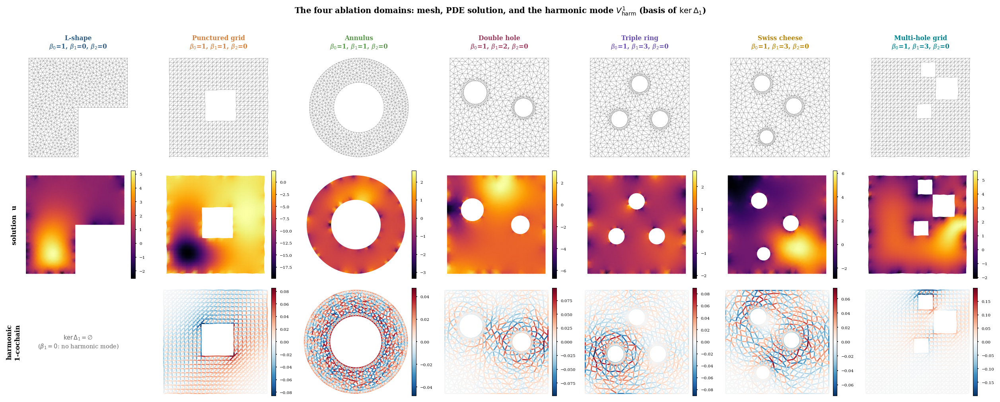

[Data] β₁ counted directly from dim ker(Δ₁) matches the topology:
  L-shape          dim ker(Δ₁) = 0  (expected β₁=0)
  Punctured grid   dim ker(Δ₁) = 1  (expected β₁=1)
  Annulus          dim ker(Δ₁) = 1  (expected β₁=1)
  Double hole      dim ker(Δ₁) = 2  (expected β₁=2)
  Triple ring      dim ker(Δ₁) = 3  (expected β₁=3)
  Swiss cheese     dim ker(Δ₁) = 3  (expected β₁=2-4)
  Multi-hole grid  dim ker(Δ₁) = 3  (expected β₁=2-4)


In [ ]:
# %%  ═══════════════════════════════════════════════════════════════════
# THE DATA:  domains, a solved PDE, and the harmonic 1-cochain
# ═══════════════════════════════════════════════════════════════════════
# This cell makes the abstract objects concrete. For each ablation domain we
# show (i) the mesh with its hole boundaries, (ii) one solved heat field u,
# and (iii) the first harmonic edge cochain — the basis vector of ker(Δ₁)
# that the harmonic channel projects onto. On a domain with a hole the
# harmonic mode *circulates around the hole*; on a simply connected domain
# ker(Δ₁) is empty and there is nothing to project onto. This is exactly the
# inductive bias the TNO is built to exploit.

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection

# One representative sample per domain (generators are stochastic).
_demo = {}
for _dom, _b1, _lab, _col in PAPER_DOMS:
    _s = gen_from_registry(_dom, 1, pde_gen_fn=generate_heat_sample)
    if _s:
        _demo[_dom] = _s[0]

with plt.rc_context(_R_RC):
    doms = [d for d in PAPER_DOMS if d[0] in _demo]
    fig, axes = plt.subplots(3, len(doms), figsize=(len(doms) * 2.4, 6.6),
                             squeeze=False)
    for ci, (dom, b1, lab, col) in enumerate(doms):
        s = _demo[dom]
        tri_obj, Vn = _tri(s)
        bv = s.betti  # [β₀, β₁, β₂]

        # Row 0 — mesh
        ax = axes[0, ci]
        ax.triplot(tri_obj, lw=0.3, color="#444", alpha=0.6)
        ax.set_title(f"{lab}\n" r"$\beta_0$=%d, $\beta_1$=%d, $\beta_2$=%d"
                     % (bv[0], bv[1], bv[2]),
                     fontsize=7.5, fontweight="bold", color=col)

        # Row 1 — solved field u
        ax = axes[1, ci]
        u = s.u.cpu().numpy()
        tc = ax.tripcolor(tri_obj, u, cmap="inferno", shading="gouraud")
        ax.triplot(tri_obj, lw=0.05, color="k", alpha=0.04)
        _cbar(ax, tc)
        if ci == 0:
            ax.set_ylabel("solution  u", fontsize=8, fontweight="bold")

        # Row 2 — first harmonic edge cochain (if β₁ ≥ 1)
        ax = axes[2, ci]
        Vh = s.V_harm_e
        if Vh is not None and Vh.shape[1] > 0:
            h = Vh[:, 0].cpu().numpy()
            segs = [[Vn[i], Vn[j]] for i, j in s.edges]
            lc = LineCollection(segs, cmap="RdBu_r", linewidths=1.4)
            lc.set_array(h)
            lim = np.abs(h).max() + 1e-9
            lc.set_clim(-lim, lim)
            ax.add_collection(lc)
            ax.set_xlim(Vn[:, 0].min() - .02, Vn[:, 0].max() + .02)
            ax.set_ylim(Vn[:, 1].min() - .02, Vn[:, 1].max() + .02)
            _cbar(ax, lc)
        else:
            ax.text(0.5, 0.5, r"$\ker\Delta_1=\varnothing$" + "\n"
                    r"($\beta_1=0$: no harmonic mode)",
                    ha="center", va="center", transform=ax.transAxes,
                    fontsize=7, color="#666")
        if ci == 0:
            ax.set_ylabel("harmonic\n1-cochain", fontsize=8, fontweight="bold")

        for r in range(3):
            axes[r, ci].set_aspect("equal")
            axes[r, ci].set_xticks([]); axes[r, ci].set_yticks([])
            for sp in axes[r, ci].spines.values():
                sp.set_visible(False)

    fig.suptitle("The four ablation domains: mesh, PDE solution, and the "
                 r"harmonic mode $V^1_{\mathrm{harm}}$ (basis of $\ker\Delta_1$)",
                 fontsize=9.5, fontweight="bold", y=1.01)
    plt.tight_layout()
    plt.savefig("domains_overview.pdf", bbox_inches="tight")
    plt.savefig("domains_overview.png", dpi=300, bbox_inches="tight")
    plt.show(); plt.close()

print("[Data] β₁ counted directly from dim ker(Δ₁) matches the topology:")
for dom, b1, lab, _ in doms:
    print(f"  {lab:<16s} dim ker(Δ₁) = {_demo[dom].V_harm_e.shape[1]}  (expected β₁={b1})")


## 7 · Running the ablation
We fix a domain, train all nine variants on one shared split, then move to the next domain.
Trained models, test samples, and normalisation stats are stashed for the analysis cells.
**Compute knob:** set `RUN_MODE` to `"demo"` (fast, qualitative), `"tutorial"` (stable
patterns), or `"full"` (publication budget — quote numbers from this).

In [ ]:
# %%  ═══════════════════════════════════════════════════════════════════
# ABLATION DRIVER  —  fix a domain, train the full variant hierarchy
# ═══════════════════════════════════════════════════════════════════════
# For each domain we train all nine variants on an identical train/val/test
# split with identical optimiser settings, so any difference in test error
# is attributable to the architecture alone. Trained models, held-out test
# samples, and normalisation statistics are registered into three dicts that
# every downstream results / GradCAM / interpretation cell consumes.

import time

# Variant hierarchy. Each row turns exactly one capability on or off; reading
# the table top-to-bottom is reading the ablation.
def _ablation_configs():
    return [
        ("MLP",                 "mlp",  lambda: VertexMLP()),                                                  # no message passing
        ("GNN",                 "gnn",  lambda: GNNModel()),                                                   # vertex-only MP
        ("TNO-grad-only",       "tno",  lambda: TNOModel(use_faces=False, use_curl=False, use_harmonic=False)),# gradient channel only
        ("TNO-linear",          "tno",  lambda: TNOLinearModel(use_faces=True, use_curl=True, use_harmonic=True)), # linear Φ maps
        ("TNO-gen-topo",        "tno",  lambda: GeneralTopoModel()),                                           # topo MP, no Hodge split
        ("TNO-no-harm",         "tno",  lambda: TNOModel(use_faces=True,  use_curl=True,  use_harmonic=False)),# grad+curl, no harmonic
        ("TNO-no-faces",        "tno",  lambda: TNOModel(use_faces=False, use_curl=False, use_harmonic=True)), # grad+harmonic, no faces
        ("TNO-full-coboundary", "tno",  lambda: TNOModel_Bare(use_faces=True, use_curl=True, use_harmonic=True)), # all channels, bare δ
        ("TNO-full-copresheaf", "tno",  lambda: TNOModel(use_faces=True,  use_curl=True,  use_harmonic=True)), # all channels, copresheaf
    ]

# Models carried into the per-channel GradCAM comparison (one per design axis).
GRADCAM_MODELS = ("GNN", "TNO-no-harm", "TNO-full-coboundary", "TNO-full-copresheaf")

# ── Compute budget ─────────────────────────────────────────────────────
#   "demo"     : fast smoke run — qualitative patterns only, ~minutes on a GPU
#   "tutorial" : balanced — patterns are stable, light enough to iterate
#   "full"     : publication budget — quote numbers from this
# NOTE: "demo" (15 epochs) is guaranteed to leave every harmonic gate at
# its α=0 init — all harmonic attribution panels will be honestly black
# ("gated"). Use ≥ "tutorial" to see the gates move; quote ONLY "full".
RUN_MODE = "tutorial"
_BUDGET = {"demo":     dict(n=60,  epochs=15),
           "tutorial": dict(n=150, epochs=30),
           "full":     dict(n=300, epochs=EPOCHS)}[RUN_MODE]
print(f"[Driver] RUN_MODE={RUN_MODE} → {_BUDGET['n']} samples, {_BUDGET['epochs']} epochs/model")


def run_ablation_on_domain(domain_name, n_samples=None, epochs=None,
                           pde_type="heat"):
    n_samples = n_samples or _BUDGET["n"]
    epochs    = epochs    or _BUDGET["epochs"]
    print("\n" + "=" * 72)
    print(f"  ABLATION — {domain_name}")
    print("=" * 72)

    pde_fn  = generate_heat_sample if pde_type == "heat" else generate_pde_sample
    samples = gen_from_registry(domain_name, n_samples, pde_gen_fn=pde_fn)
    if not samples:
        print(f"  ERROR: no samples for {domain_name}"); return {}

    b1 = samples[0].betti[1] if getattr(samples[0], "betti", None) else 0
    print(f"  [Data] {len(samples)} samples · β₁≈{b1}")

    train_s, val_s, test_s = split_samples(samples)
    tr_ld, va_ld, te_ld, ns = make_loaders(train_s, val_s, test_s)

    results = {}
    for name, mtype, make_model in _ablation_configs():
        m = make_model(); n_params = count_params(m)
        print(f"\n  ── {name}  ({n_params:,} params) ──")
        tr_h, va_h = train_model(m, tr_ld, va_ld, epochs=epochs,
                                 label=name, model_type=mtype, verbose_every=max(epochs//3,1))
        mse, rel = evaluate_model(m, te_ld, DEVICE, mtype)
        results[name] = dict(model=m, mse=mse, rel=rel, train=tr_h, val=va_h,
                             params=n_params)

    if "TNO-full-copresheaf" in results:
        results["TNO-full"] = results["TNO-full-copresheaf"]   # back-compat alias

    all_domain_results[domain_name] = results
    all_test_samples[domain_name]   = test_s
    all_norm_stats[domain_name]     = ns
    results["_meta"] = dict(domain=domain_name, beta1=b1, n_samples=len(samples))
    print(f"\n  [done] {domain_name}: "
          + " · ".join(f"{k}={results[k]['mse']:.4f}"
                       for k in ('GNN','TNO-no-harm','TNO-full-copresheaf')
                       if k in results))
    return results


# ── Global stores ───────────────────────────────────────────────────────
all_domain_results, all_test_samples, all_norm_stats = {}, {}, {}

# ── Run the sweep over the four ablation domains ─────────────────────────
for _dom, _b1, _lab, _col in PAPER_DOMS:
    run_ablation_on_domain(_dom)

print("\n[Driver] trained domains:", list(all_domain_results.keys()))


[Driver] RUN_MODE=tutorial → 150 samples, 30 epochs/model

  ABLATION — lshape
  [Data] 150 samples · β₁≈0

  ── MLP  (34,177 params) ──
    [MLP] ep 01/30  train=0.43786  val=0.25486
    [MLP] ep 10/30  train=0.30976  val=0.26674
    [MLP] ep 20/30  train=0.29424  val=0.26615
    [MLP] ep 30/30  train=0.29016  val=0.26956
    [MLP] done in 8.1s

  ── GNN  (981,861 params) ──
    [GNN] ep 01/30  train=0.40510  val=0.38659
    [GNN] ep 10/30  train=0.18622  val=0.18171
    [GNN] ep 20/30  train=0.15061  val=0.09795
    [GNN] ep 30/30  train=0.13132  val=0.11531
    [GNN] done in 33.0s

  ── TNO-grad-only  (477,462 params) ──
    [TNO-grad-only] ep 01/30  train=0.40248  val=0.32241
    [TNO-grad-only] ep 10/30  train=0.13716  val=0.16326
    [TNO-grad-only] ep 20/30  train=0.09187  val=0.08285
    [TNO-grad-only] ep 30/30  train=0.07561  val=0.07206
    [TNO-grad-only] done in 102.7s

  ── TNO-linear  (505,887 params) ──
    [TNO-linear] ep 01/30  train=0.47480  val=0.27408
    [TNO-line

## 8 · Results
Three complementary views. **(1)** The MSE table / heatmap is the headline accuracy ranking.
**(2)** The validation curves show *how* each variant converges. **(3)** The learned-$\alpha$
heatmap is the network's own answer to "how much topology do I need?" — recall the harmonic
gates start at 0, so any growth is the model electing to use the harmonic channel. The paper's
expectation is that $\alpha^{\mathrm{harm}}$ grows on $\beta_1\!\ge\!1$ domains (often peaking in
the middle/late layers, after local structure is built) and stays near zero on the control.

  RESULTS SUMMARY & VISUALISATIONS

  TEST MSE  (lower is better; best per column in []) 
  Model                     L-shape  Punctured g      Annulus  Double hole  Triple ring  Swiss chees  Multi-hole 
  MLP                       0.20709      0.12230      0.14892      0.11470      0.29454      0.17974      0.12177
  GNN                       0.11594      0.03889      0.03175      0.03778      0.09511      0.05178      0.04815
  TNO-grad-only             0.08136      0.02550    [0.02923]      0.02835      0.08478      0.04910      0.04445
  TNO-linear                0.03612      0.03325      0.04062      0.02979      0.07583      0.04891      0.03868
  TNO-gen-topo              0.05999      0.03390      0.03788      0.02736      0.08126      0.05201      0.05188
  TNO-no-harm               0.05050      0.03122      0.03015      0.02492      0.08072      0.04622      0.04534
  TNO-no-faces              0.04288    [0.02143]      0.03065      0.02566      0.06734      0.04239    [0.03615

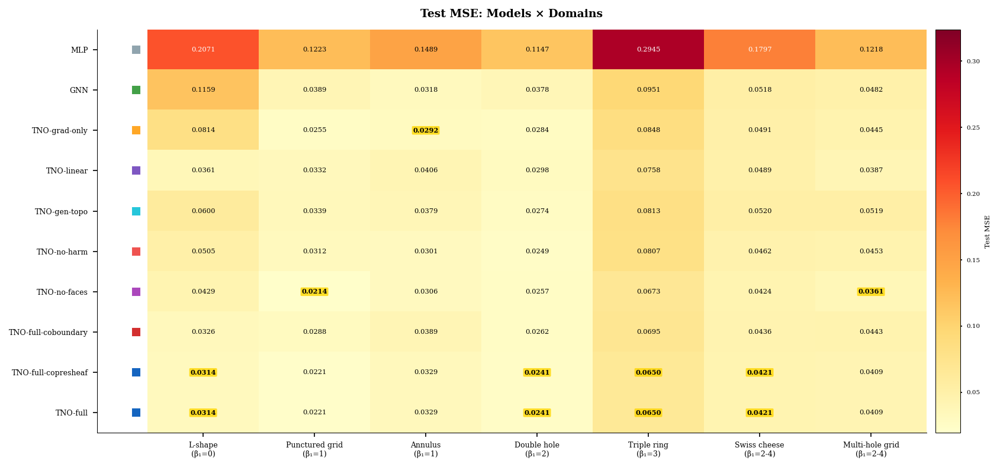

  [MSE] mse_heatmap.pdf


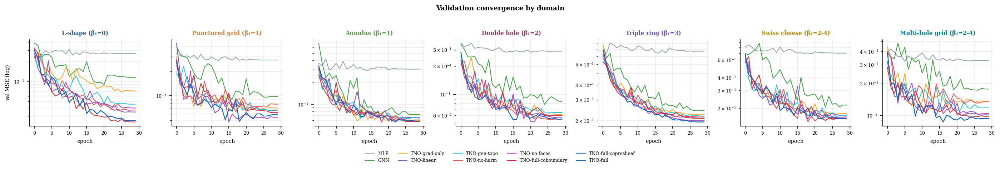

  [results] learning_curves.pdf


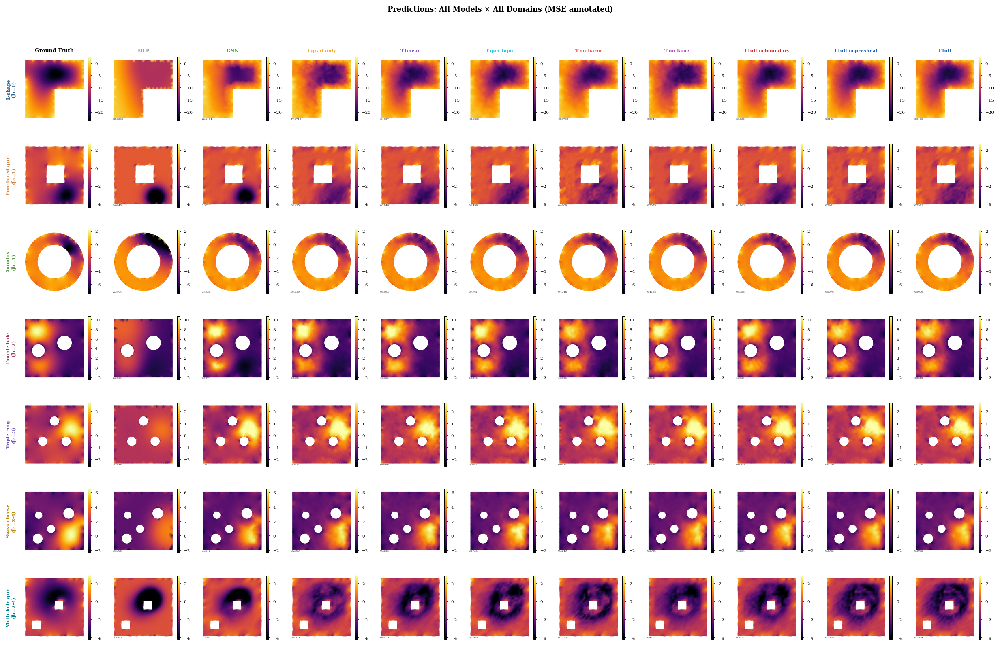

  [Pred] all_predictions.pdf


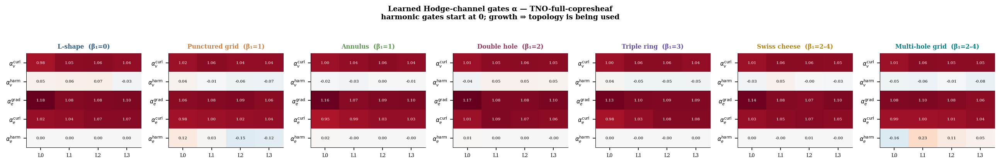

  [results] alpha_evolution.pdf


In [ ]:
def plot_all_predictions(all_domain_results, all_test_samples, all_norm_stats,
                         models_to_show=None, sample_idx=0):
    """
    Grid: domains (rows) × models (cols). Each cell shows the prediction
    coloured on the same scale as ground truth for that domain.
    """
    doms = [d[0] for d in _ABL_DOMS if d[0] in all_test_samples]

    # Determine models to show
    all_models = []
    for dom in doms:
        for m in all_domain_results[dom]:
            if m not in all_models and not m.startswith("_"):
                all_models.append(m)
    show = models_to_show or all_models

    n_cols = 1 + len(show)  # GT + models

    with plt.rc_context(_R_RC):
        fig, axes = plt.subplots(len(doms), n_cols,
                                 figsize=(n_cols * 1.5, len(doms) * 1.5))
        if len(doms) == 1: axes = axes[np.newaxis, :]

        for ri, dom in enumerate(doms):
            s = all_test_samples[dom][sample_idx]
            ns = all_norm_stats[dom]
            tri_obj, Vn = _tri(s)
            u_gt = s.u.cpu().numpy()
            vmin, vmax = u_gt.min(), u_gt.max()
            if abs(vmax - vmin) < 1e-12: vmin -= 0.5; vmax += 0.5

            # GT
            ax = axes[ri, 0]
            tc = ax.tripcolor(tri_obj, u_gt, cmap="inferno",
                              shading="gouraud", vmin=vmin, vmax=vmax)
            ax.triplot(tri_obj, lw=0.05, color="k", alpha=0.03)
            _cbar(ax, tc)
            ax.set_aspect("equal"); ax.set_xticks([]); ax.set_yticks([])
            for sp in ax.spines.values(): sp.set_visible(False)
            b1 = _ABL_DOMS[ri][1]
            ax.set_ylabel(f"{_DOM_LAB.get(dom, dom)}\n(β₁={b1})",
                          fontsize=5.5, fontweight="bold",
                          color=_DOM_COL.get(dom, "#333"),
                          rotation=90, labelpad=8)
            if ri == 0:
                ax.set_title("Ground Truth", fontsize=6, fontweight="bold")

            # Each model
            batch = _make_batch(s, ns)
            for mi, mname in enumerate(show):
                ax = axes[ri, mi + 1]
                r = all_domain_results.get(dom, {}).get(mname, {})
                model = r.get("model")
                if model is None:
                    ax.text(0.5, 0.5, "N/A", ha="center", va="center",
                            transform=ax.transAxes, fontsize=6)
                    ax.set_aspect("equal"); ax.set_xticks([]); ax.set_yticks([])
                    for sp in ax.spines.values(): sp.set_visible(False)
                    if ri == 0:
                        ax.set_title(mname, fontsize=5.5, fontweight="bold",
                                     color=_mcol(mname))
                    continue

                mt = _model_type(mname, model)
                pred = _predict(model, batch, mt, ns)
                pred_np = pred.numpy()
                mse = float(np.mean((pred_np - u_gt)**2))

                tc = ax.tripcolor(tri_obj, pred_np, cmap="inferno",
                                  shading="gouraud", vmin=vmin, vmax=vmax)
                ax.triplot(tri_obj, lw=0.05, color="k", alpha=0.03)
                _cbar(ax, tc)
                ax.set_aspect("equal"); ax.set_xticks([]); ax.set_yticks([])
                for sp in ax.spines.values(): sp.set_visible(False)
                ax.text(0.02, 0.02, f"{mse:.4f}", fontsize=3, color="#333",
                        transform=ax.transAxes)
                if ri == 0:
                    ax.set_title(mname.replace("TNO-", "T-"),
                                 fontsize=5.5, fontweight="bold",
                                 color=_mcol(mname))

        fig.suptitle("Predictions: All Models × All Domains (MSE annotated)",
                     fontsize=8.5, fontweight="bold", y=1.02)
        plt.tight_layout()
        plt.savefig("all_predictions.pdf", bbox_inches="tight")
        plt.savefig("all_predictions.png", dpi=300, bbox_inches="tight")
        plt.show(); plt.close()
    print("  [Pred] all_predictions.pdf")


# ═══════════════════════════════════════════════════════════════════════
#  3. MSE HEATMAP (models × domains)
# ═══════════════════════════════════════════════════════════════════════

def plot_mse_heatmap(all_domain_results):
    """
    Heatmap: rows = models, columns = domains.
    Cell colour = MSE, annotated with numeric value.
    Best per column highlighted.
    """
    doms = [d[0] for d in _ABL_DOMS if d[0] in all_domain_results]
    all_models = []
    for dom in doms:
        for m in all_domain_results[dom]:
            if m not in all_models and not m.startswith("_"):
                all_models.append(m)

    data = np.full((len(all_models), len(doms)), np.nan)
    for mi, mname in enumerate(all_models):
        for di, dom in enumerate(doms):
            r = all_domain_results.get(dom, {}).get(mname, {})
            data[mi, di] = r.get("mse", np.nan)

    with plt.rc_context(_R_RC):
        fig, ax = plt.subplots(figsize=(len(doms) * 1.4 + 1.5,
                                        len(all_models) * 0.45 + 0.8))

        # Colour scale: log-ish for better contrast
        vmin = np.nanmin(data) * 0.9
        vmax = np.nanmax(data) * 1.1

        im = ax.imshow(data, cmap="YlOrRd", aspect="auto",
                       vmin=vmin, vmax=vmax, interpolation="nearest")

        # Annotations
        col_mins = np.nanmin(data, axis=0)
        for mi in range(len(all_models)):
            for di in range(len(doms)):
                v = data[mi, di]
                if np.isnan(v): continue
                is_best = abs(v - col_mins[di]) < 1e-6
                weight = "bold" if is_best else "normal"
                color = "white" if v > (vmin + vmax) / 2 else "black"
                box = dict(boxstyle="round,pad=0.15", fc="#FFD600", ec="none",
                           alpha=0.8) if is_best else None
                ax.text(di, mi, f"{v:.4f}", ha="center", va="center",
                        fontsize=5.5, fontweight=weight, color=color,
                        bbox=box)

        ax.set_xticks(range(len(doms)))
        ax.set_xticklabels([f"{_DOM_LAB.get(d, d)}\n(β₁={_ABL_DOMS[i][1]})"
                            for i, d in enumerate(doms)], fontsize=6)
        ax.set_yticks(range(len(all_models)))
        ax.set_yticklabels(all_models, fontsize=6)

        # Model colour indicators on left
        for mi, mname in enumerate(all_models):
            ax.plot(-0.6, mi, "s", color=_mcol(mname), markersize=6,
                    transform=ax.transData, clip_on=False)

        _cbar(ax, im, label="Test MSE", w="3%", pad=0.1)

        ax.set_title("Test MSE: Models × Domains", fontsize=9,
                     fontweight="bold", pad=10)
        plt.tight_layout()
        plt.savefig("mse_heatmap.pdf", bbox_inches="tight")
        plt.savefig("mse_heatmap.png", dpi=300, bbox_inches="tight")
        plt.show(); plt.close()
    print("  [MSE] mse_heatmap.pdf")


# ═══════════════════════════════════════════════════════════════════════
#  LEARNED α — the network's own read-out of "how much topology do I need?"
# ═══════════════════════════════════════════════════════════════════════
# The paper's prediction (Algorithm 1): each Hodge channel carries a
# learnable scalar gate α, with the harmonic gates α_harm initialised at 0
# so the model *starts* GNN-equivalent and admits topology only where it
# reduces the loss. If topology matters, the harmonic gates should grow on
# β₁ ≥ 1 domains and stay near zero on the β₁ = 0 control.

def plot_alpha_evolution(model_name="TNO-full-copresheaf"):
    """Per-domain heatmap of the learned α gates across depth for one TNO."""
    doms = [d[0] for d in _ABL_DOMS if d[0] in all_domain_results]
    a_names = ["alpha_curl_v", "alpha_harm_v",
               "alpha_grad_e", "alpha_curl_e", "alpha_harm_e"]
    a_labels = [r"$\alpha^{\mathrm{curl}}_v$", r"$\alpha^{\mathrm{harm}}_v$",
                r"$\alpha^{\mathrm{grad}}_e$", r"$\alpha^{\mathrm{curl}}_e$",
                r"$\alpha^{\mathrm{harm}}_e$"]
    with plt.rc_context(_R_RC):
        fig, axes = plt.subplots(1, len(doms),
                                 figsize=(len(doms) * 2.4 + 0.5, 2.6),
                                 squeeze=False)
        axes = axes[0]
        vmax = 0.0
        mats = {}
        for dom in doms:
            m = all_domain_results.get(dom, {}).get(model_name, {}).get("model")
            if m is None or not hasattr(m, "layers"):
                mats[dom] = None; continue
            M = np.array([[getattr(L, a).item() for L in m.layers]
                          for a in a_names])
            mats[dom] = M
            vmax = max(vmax, np.abs(M).max())
        vmax = max(vmax, 1.0)
        for ax, dom in zip(axes, doms):
            M = mats[dom]
            b1 = next(d[1] for d in _ABL_DOMS if d[0] == dom)
            if M is None:
                ax.text(0.5, 0.5, "N/A", ha="center", va="center",
                        transform=ax.transAxes); continue
            im = ax.imshow(M, cmap="RdBu_r", vmin=-vmax, vmax=vmax,
                           aspect="auto")
            for i in range(M.shape[0]):
                for j in range(M.shape[1]):
                    ax.text(j, i, f"{M[i,j]:.2f}", ha="center", va="center",
                            fontsize=5.0,
                            color="white" if abs(M[i,j]) > vmax*0.55 else "black")
            ax.set_xticks(range(M.shape[1]))
            ax.set_xticklabels([f"L{j}" for j in range(M.shape[1])], fontsize=6)
            ax.set_yticks(range(len(a_labels)))
            ax.set_yticklabels(a_labels, fontsize=7)
            ax.set_title(f"{_DOM_LAB.get(dom, dom)}  (β₁={b1})",
                         fontsize=7.5, fontweight="bold",
                         color=_DOM_COL.get(dom, "#333"))
        fig.suptitle(f"Learned Hodge-channel gates α — {model_name}\n"
                     "harmonic gates start at 0; growth ⇒ topology is being used",
                     fontsize=9, fontweight="bold", y=1.06)
        plt.tight_layout()
        plt.savefig("alpha_evolution.pdf", bbox_inches="tight")
        plt.savefig("alpha_evolution.png", dpi=300, bbox_inches="tight")
        plt.show(); plt.close()
    print("  [results] alpha_evolution.pdf")


def plot_learning_curves():
    """Validation-MSE curves for every model, one panel per domain."""
    doms = [d[0] for d in _ABL_DOMS if d[0] in all_domain_results]
    with plt.rc_context(_R_RC):
        fig, axes = plt.subplots(1, len(doms),
                                 figsize=(len(doms) * 2.6 + 0.5, 2.6),
                                 squeeze=False)
        axes = axes[0]
        for ax, dom in zip(axes, doms):
            res = all_domain_results[dom]
            b1 = next(d[1] for d in _ABL_DOMS if d[0] == dom)
            for mname, r in res.items():
                if mname.startswith("_") or "val" not in r:
                    continue
                ax.plot(r["val"], lw=1.0, color=_mcol(mname), label=mname)
            ax.set_yscale("log")
            ax.set_xlabel("epoch", fontsize=7)
            ax.set_title(f"{_DOM_LAB.get(dom, dom)} (β₁={b1})",
                         fontsize=7.5, fontweight="bold",
                         color=_DOM_COL.get(dom, "#333"))
            ax.grid(True, alpha=0.25, which="both")
        axes[0].set_ylabel("val MSE (log)", fontsize=7)
        h, l = axes[-1].get_legend_handles_labels()
        fig.legend(h, l, loc="lower center", ncol=min(len(l), 5),
                   fontsize=6, frameon=False, bbox_to_anchor=(0.5, -0.12))
        fig.suptitle("Validation convergence by domain", fontsize=9,
                     fontweight="bold", y=1.04)
        plt.tight_layout()
        plt.savefig("learning_curves.pdf", bbox_inches="tight")
        plt.savefig("learning_curves.png", dpi=300, bbox_inches="tight")
        plt.show(); plt.close()
    print("  [results] learning_curves.pdf")


def print_summary_table():
    """Paper-style MSE / Rel-L² table, plus the key contrast deltas."""
    doms = [d[0] for d in _ABL_DOMS if d[0] in all_domain_results]
    models = []
    for dom in doms:
        for m in all_domain_results[dom]:
            if not m.startswith("_") and m != "TNO-full" and m not in models:
                models.append(m)
    print("\n" + "=" * (20 + 13 * len(doms)))
    print("  TEST MSE  (lower is better; best per column in []) ")
    print("=" * (20 + 13 * len(doms)))
    print(f"  {'Model':<20s}" + "".join(
        f"{_DOM_LAB.get(d,d)[:11]:>13s}" for d in doms))
    col_best = {d: min((all_domain_results[d].get(m, {}).get('mse', np.inf)
                        for m in models), default=np.inf) for d in doms}
    for m in models:
        row = f"  {m:<20s}"
        for d in doms:
            v = all_domain_results[d].get(m, {}).get("mse", np.nan)
            cell = f"{v:.5f}" if np.isfinite(v) else "—"
            if np.isfinite(v) and abs(v - col_best[d]) < 1e-9:
                cell = f"[{v:.5f}]"
            row += f"{cell:>13s}"
        print(row)
    print("-" * (20 + 13 * len(doms)))
    # Key contrasts averaged across domains where both exist
    def _avg_delta(a, b):
        ds = []
        for d in doms:
            va = all_domain_results[d].get(a, {}).get("mse")
            vb = all_domain_results[d].get(b, {}).get("mse")
            if va and vb:
                ds.append((1 - va / vb) * 100)
        return np.mean(ds) if ds else float("nan")
    print(f"  TNO-full-copresheaf vs GNN          : "
          f"{_avg_delta('TNO-full-copresheaf','GNN'):+.1f}% MSE (avg)")
    print(f"  TNO-full-copresheaf vs TNO-no-harm  : "
          f"{_avg_delta('TNO-full-copresheaf','TNO-no-harm'):+.1f}% MSE (avg)  "
          f"← isolates the harmonic channel")
    print(f"  TNO-full-copresheaf vs coboundary   : "
          f"{_avg_delta('TNO-full-copresheaf','TNO-full-coboundary'):+.1f}% MSE (avg)  "
          f"← isolates transport choice")


# ── Run ─────────────────────────────────────────────────────────────────
print("=" * 60)
print("  RESULTS SUMMARY & VISUALISATIONS")
print("=" * 60)
print_summary_table()
plot_mse_heatmap(all_domain_results)
plot_learning_curves()
plot_all_predictions(all_domain_results, all_test_samples, all_norm_stats)
plot_alpha_evolution("TNO-full-copresheaf")


## 9 · Opening the black box: per-Hodge-channel attribution

Accuracy tells us *whether* topology helps; it does not tell us *how*. This section attributes the prediction to each Hodge channel by hooking the per-channel post-aggregation maps and combining activations with their gradients.

**Why the previous GradCAM panels were black.** Five independent causes, in decreasing order of severity:

1. **Structural emptiness.** On every connected domain $\beta_0-1=0$, so $V^0_{\mathrm{harm}}=\varnothing$ and the rank-0 harmonic panel is *exactly* zero by construction. This is correct behaviour and is annotated, not fixed.
2. **Gated channels at short budgets.** $\alpha_{\mathrm{harm}}$ is initialised at $0$; under the `demo` budget (15 epochs) it never moves materially, so the gradient reaching the harmonic $\Phi$ output is $\alpha\!\approx\!0$ times the downstream gradient — the CAM is numerically zero. *This is a property of the training budget, not the channel.*
3. **Last-layer edge channels are doubly suppressed.** With `target_layer_idx=-1`, the edge-rank channels ($\Phi^{\mathrm{exact}}_e$, $\Phi^{\mathrm{coex}}_e$, $\Phi^{\mathrm{harm}}_e$) reach the loss *only* through `head_e`, which is down-scaled by $0.01$ at init (§3.5c). Their gradients — hence their CAMs — are suppressed by two orders of magnitude relative to vertex channels *regardless of how important the channel is in earlier layers*, where it feeds subsequent vertex updates. The fix is to attribute over **all layers**, not just the last.
4. **GAP sign-cancellation.** Classic GradCAM pools gradients globally, $\alpha_c = \tfrac1N\sum_i \partial s/\partial A_{ic}$, then applies ReLU. For *regression on a mesh* the per-node gradients are signed and largely cancel under the global average; the resulting CAM can be uniformly negative and the ReLU zeroes the entire panel (this is what produced the all-"—" `double_hole` row, including for the GNN). We therefore use the element-wise product $\mathrm{attr}_i = \sum_c A_{ic}\,\tfrac{\partial s}{\partial A_{ic}}$ (HiResCAM-style **grad⊙activation**), which preserves spatial structure and cannot cancel globally. We label it as such — it is not GradCAM and should not be called GradCAM in paper figures.
5. **Unfair GNN hook.** The GNN was hooked at the *whole layer output* (residual stream included), while TNO channels were hooked at their message maps. The GNN is now hooked at `phi_msg`, the exact analogue of the TNO's $\Phi$ maps.

**Scoring.** The backprop seed matters for regression. `score="energy"` uses $s=\tfrac12\lVert\hat u\rVert^2$ (each vertex weighted by its own prediction — no cross-vertex cancellation in the seed); `score="region"` restricts the energy to hole-boundary vertices, asking *"what drives the prediction near the holes?"* — the sharpest probe of the topological claim.

**Channel taxonomy (paper-consistent).** Panels are labelled by Hodge route, matching the paper's *exact / coexact / harmonic / self* convention rather than the informal grad/curl names: at rank 0, the coexact route $\delta^1$ ($e{\to}v$) and the rank-0 harmonic projection; at rank 1, the exact route $d^0$ ($v{\to}e$), the coexact route $\delta^2$ ($f{\to}e$), and the rank-1 harmonic projection. The rank-1 *exact* channel was previously not hooked at all.

Maps are **signed** (diverging colormap: red drives the score up, blue down), each panel annotated with its raw attribution scale, so a dark panel is never ambiguous: it is either *structurally empty*, *gated* (with the gate value shown), or *genuinely small* (with the magnitude shown). A reference column shows the harmonic anatomy $|V^1_{\mathrm{harm}}|$ — what the harmonic channel *can* see — independent of training.

**Expectation:** on holed domains, with sufficient training budget, the rank-1 harmonic panel of the copresheaf TNO should concentrate around the holes, and should do so *more than its own exact channel does* (the within-model control of §10).


  PER-HODGE-CHANNEL ATTRIBUTION (grad⊙activation, all layers)
────────────────────────────────────────────────────────────────────
  SANITY — harmonic subspace dims and learned α gates per layer
────────────────────────────────────────────────────────────────────

  lshape         dim V⁰_harm=1 (β₀−1) · dim V¹_harm=0 (β₁)
    TNO-no-harm            α_harm_v=['+0.000', '+0.000', '+0.000', '+0.000'] α_harm_e=['+0.000', '+0.000', '+0.000', '+0.000']
    TNO-full-coboundary    α_harm_v=['-0.054', '+0.062', '-0.084', '+0.044'] α_harm_e=['+0.000', '+0.000', '+0.000', '+0.000']
    TNO-full-copresheaf    α_harm_v=['+0.051', '+0.063', '+0.072', '-0.034'] α_harm_e=['+0.000', '+0.000', '+0.000', '+0.000']

  punctured_tri  dim V⁰_harm=1 (β₀−1) · dim V¹_harm=1 (β₁)
    TNO-no-harm            α_harm_v=['+0.000', '+0.000', '+0.000', '+0.000'] α_harm_e=['+0.000', '+0.000', '+0.000', '+0.000']
    TNO-full-coboundary    α_harm_v=['-0.024', '+0.026', '+0.043', '-0.071'] α_harm_e=['+0.103', '+0.117', '

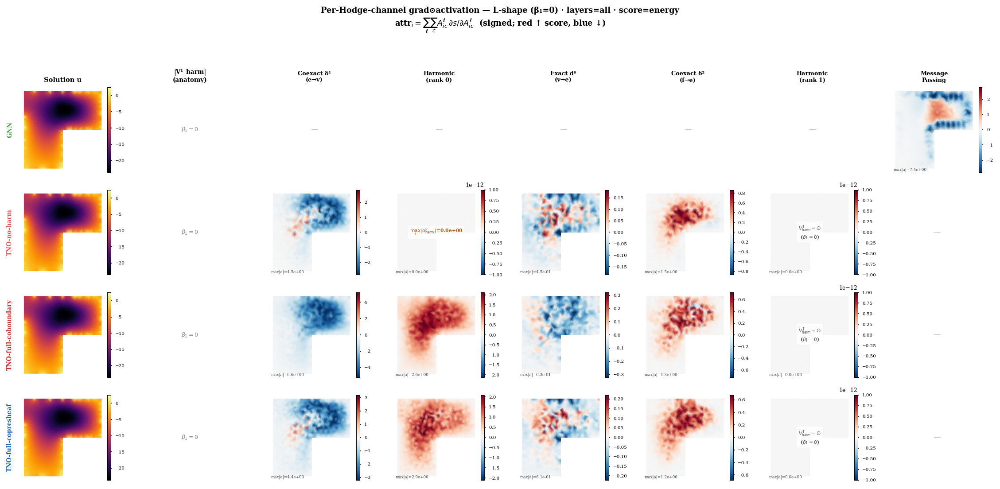

  [attr] hodge_attr_lshape.pdf


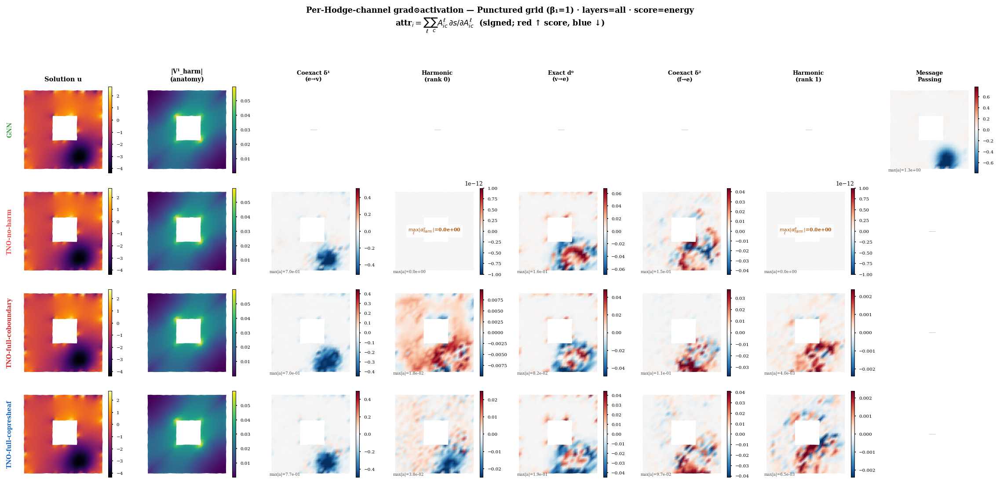

  [attr] hodge_attr_punctured_tri.pdf


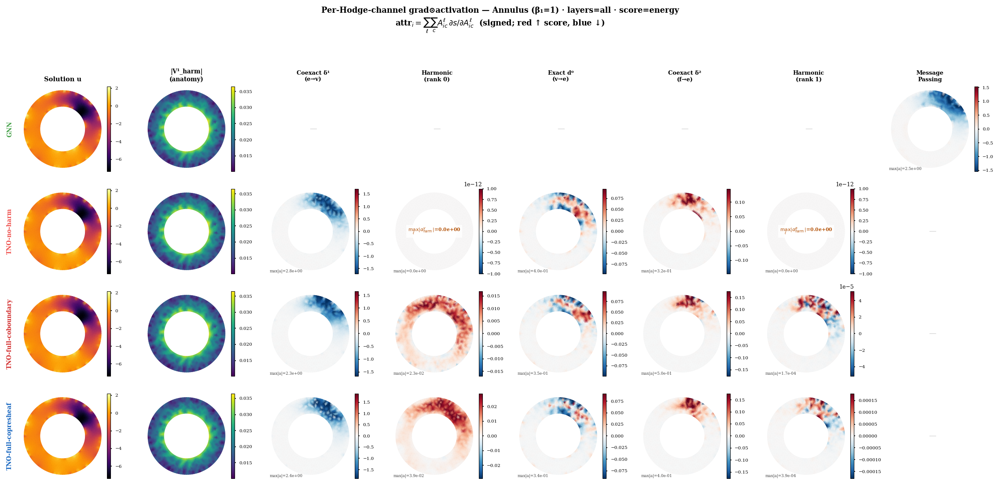

  [attr] hodge_attr_annulus.pdf


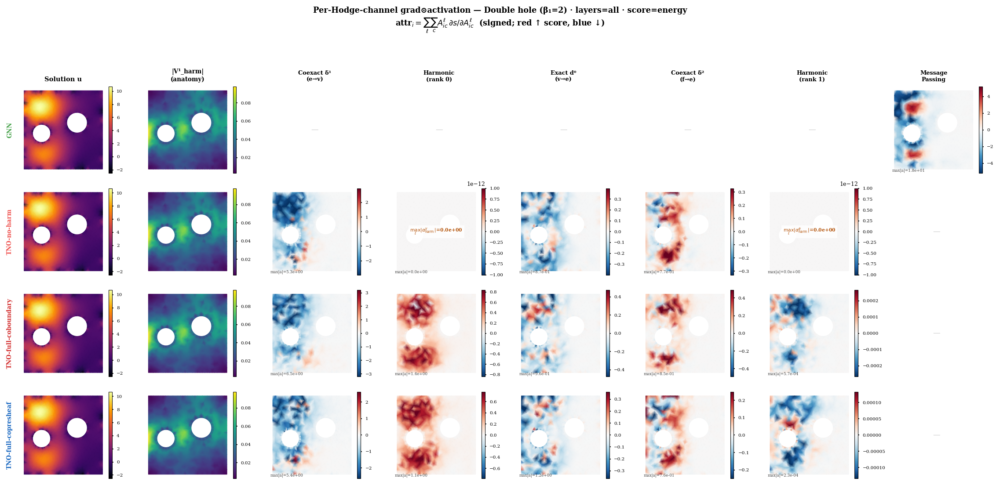

  [attr] hodge_attr_double_hole.pdf


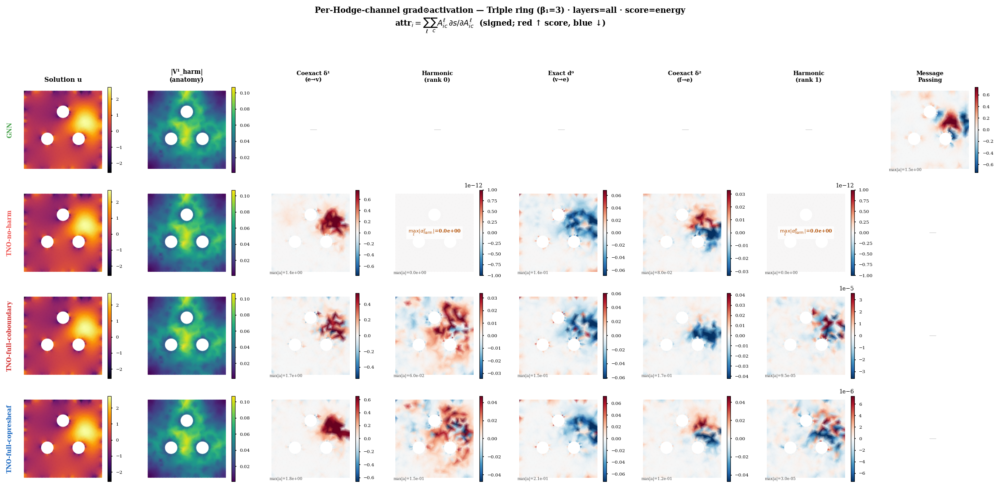

  [attr] hodge_attr_triple_ring.pdf


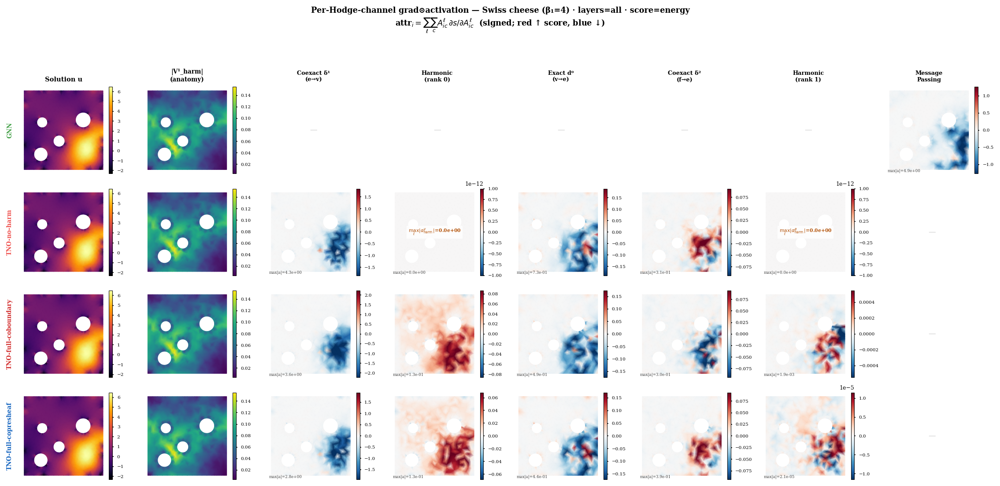

  [attr] hodge_attr_swiss_cheese.pdf


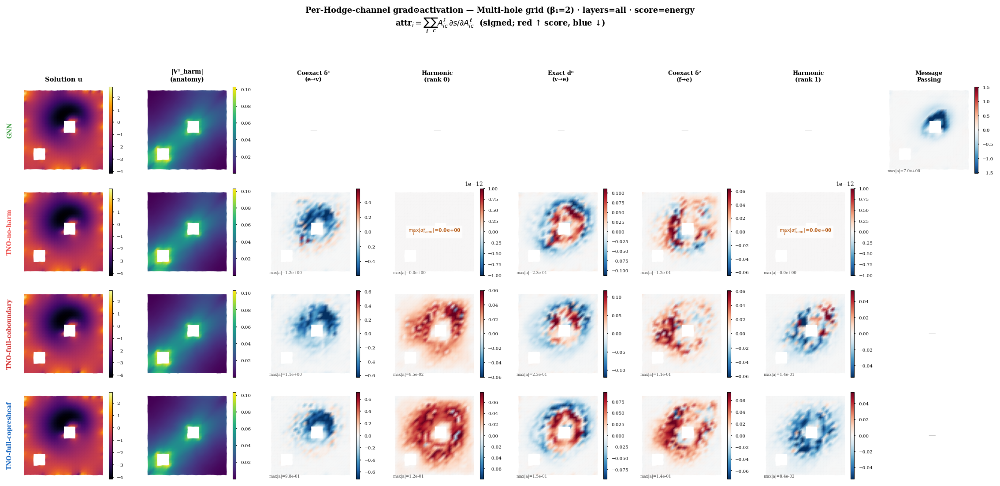

  [attr] hodge_attr_multi_hole_grid.pdf


In [ ]:
# %%  ═══════════════════════════════════════════════════════════════════
# PER-HODGE-CHANNEL ATTRIBUTION (grad⊙activation) — corrected
# ═══════════════════════════════════════════════════════════════════════
#
# Replaces the GAP-GradCAM cell. Five corrections (see §9 markdown):
#
#   FIX 1 — element-wise grad⊙activation (HiResCAM-style) instead of
#           GAP-GradCAM:  attr_i = Σ_c A_ic · ∂s/∂A_ic .
#           GAP + ReLU sign-cancels on mesh regression (the all-"—"
#           double_hole row). Maps are SIGNED; ReLU is not applied.
#           Labelled honestly: this is grad⊙act, NOT GradCAM.
#
#   FIX 2 — attribute over ALL layers, not only the last. At layer L−1
#           the edge-rank channels reach the loss only through the
#           0.01-initialised head_e, suppressing their gradients ~100×;
#           in earlier layers they feed subsequent vertex updates and
#           carry real signal. target_layers="all" sums per-layer maps.
#
#   FIX 3 — complete, paper-consistent channel set. The rank-1 EXACT
#           channel (phi_grad_e, v→e via d⁰) was previously unhooked.
#           Panels now follow the exact/coexact/harmonic taxonomy.
#
#   FIX 4 — fair GNN hook: phi_msg (the message Φ map), not the whole
#           layer output (which includes the residual/self stream).
#
#   FIX 5 — the promised sanity report actually exists and runs first:
#           V_harm dimensions and every layer's α gates, per model and
#           domain, so the three-state annotation is verifiable.
#
# Scoring: score="energy"  →  s = ½‖pred‖²        (default)
#          score="region"  →  s = ½‖pred[holes]‖² (what drives the
#                              prediction near the holes?)
#          score="mean"    →  s = mean(pred)       (legacy; cancels)
# ═══════════════════════════════════════════════════════════════════════

import torch
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from collections import defaultdict

_EMPTY_SUBSPACE = "empty"
_GATED          = "gated"
_SMALL_CAM      = "small"

# Paper-consistent channel labels (exact / coexact / harmonic — Fig. 1 audit)
L_COEX_V = 'Coexact δ¹\n(e→v)'
L_HARM_V = 'Harmonic\n(rank 0)'
L_EX_E   = 'Exact d⁰\n(v→e)'
L_COEX_E = 'Coexact δ²\n(f→e)'
L_HARM_E = 'Harmonic\n(rank 1)'
L_MSG    = 'Message\nPassing'

# (module attribute on the layer, rank of the map's OUTPUT, panel label)
_TNO_CHANNEL_SPECS = [
    ('phi_curl_v', 0, L_COEX_V),
    ('phi_harm_v', 0, L_HARM_V),
    ('phi_grad_e', 1, L_EX_E),
    ('phi_curl_e', 1, L_COEX_E),
    ('phi_harm_e', 1, L_HARM_E),
]
_GNN_CHANNEL_SPECS = [('phi_msg', 0, L_MSG)]


# ───────────────────────────────────────────────────────────────────────
#  Hole / outer boundary masks (shared with §10)
# ───────────────────────────────────────────────────────────────────────

def _boundary_masks(sample):
    """(hole_mask, outer_mask): bool (nv,) masks of inner-loop and
    outer-loop boundary vertices. Boundary edges = |B2| row-sum == 1;
    loops = connected components; largest-bbox loop = outer boundary."""
    nv    = sample.V_xy.shape[0]
    B2    = sample.B2.cpu() if getattr(sample, "B2", None) is not None else None
    V     = sample.V_xy.cpu().numpy()
    edges = [(int(u), int(v)) for u, v in sample.edges]

    if B2 is not None and B2.shape[1] > 0:
        bnd = (B2.abs().sum(dim=1) == 1).nonzero(as_tuple=True)[0].tolist()
    else:
        bnd = list(range(len(edges)))

    adj, bverts = defaultdict(list), set()
    for ei in bnd:
        i, j = edges[ei]
        adj[i].append(j); adj[j].append(i)
        bverts.add(i); bverts.add(j)

    seen, comps = set(), []
    for s0 in bverts:
        if s0 in seen:
            continue
        stack, comp = [s0], []
        while stack:
            u = stack.pop()
            if u in seen:
                continue
            seen.add(u); comp.append(u)
            stack.extend(w for w in adj[u] if w not in seen)
        comps.append(comp)

    hole  = torch.zeros(nv, dtype=torch.bool)
    outer = torch.zeros(nv, dtype=torch.bool)
    if not comps:
        return hole, outer

    def _bbox(c):
        P = V[c]
        return float((P[:, 0].max() - P[:, 0].min()) *
                     (P[:, 1].max() - P[:, 1].min()))

    oi = int(np.argmax([_bbox(c) for c in comps]))
    for k, c in enumerate(comps):
        tgt = outer if k == oi else hole
        for u in c:
            tgt[u] = True
    return hole, outer


# ───────────────────────────────────────────────────────────────────────
#  PerHodgeAttribution — hook-based grad⊙activation per Hodge channel
# ───────────────────────────────────────────────────────────────────────

class PerHodgeAttribution:
    """
    Signed grad⊙activation attribution per Hodge channel, summed over
    layers:  attr_i = Σ_ℓ Σ_c A^ℓ_ic · ∂s/∂A^ℓ_ic .

    Edge-rank maps are scattered to incident vertices (degree-averaged)
    for display on the vertex mesh.

    compute() returns (cam_dict, status_dict); per-channel diagnostics
    (raw |attr| max, gate values, V_harm dims) land in .last_diag.
    """

    def __init__(self, model, target_layers="all", model_type="tno",
                 target_layer_idx=None):
        # target_layer_idx kept for backward compatibility (int or None)
        self.model      = model
        self.model_type = model_type
        if target_layer_idx is not None:
            target_layers = [target_layer_idx]
        self.target_layers = target_layers
        self._acts, self._grads, self._hooks = {}, {}, []

    # ── hooks ────────────────────────────────────────────────────────
    def _remove_hooks(self):
        for h in self._hooks:
            h.remove()
        self._hooks.clear(); self._acts.clear(); self._grads.clear()

    def _add_hook(self, module, key):
        def fwd(m, inp, out):
            self._acts[key] = out.detach()
            if out.requires_grad:
                out.register_hook(
                    lambda g, k=key: self._grads.__setitem__(k, g.detach()))
        self._hooks.append(module.register_forward_hook(fwd))

    def _layer_indices(self):
        n = len(self.model.layers)
        if self.target_layers == "all":
            return list(range(n))
        return [li % n for li in self.target_layers]

    def _register(self):
        specs = (_TNO_CHANNEL_SPECS if self.model_type == "tno"
                 else _GNN_CHANNEL_SPECS)
        for li in self._layer_indices():
            layer = self.model.layers[li]
            for attr, rank, label in specs:
                mod = getattr(layer, attr, None)
                if mod is None:
                    continue
                self._add_hook(mod, (li, attr))

    # ── edge → vertex scatter (vectorised) ───────────────────────────
    @staticmethod
    def _edge_to_vertex(cam_e, edges_t, nv):
        cam_v = torch.zeros(nv); deg = torch.zeros(nv)
        ones  = torch.ones(edges_t.shape[0])
        for col in (0, 1):
            cam_v.index_add_(0, edges_t[:, col], cam_e)
            deg.index_add_(0, edges_t[:, col], ones)
        return cam_v / deg.clamp_min(1.0)

    # ── channel status (structural / gated) ──────────────────────────
    def _status(self, label, sample):
        if self.model_type != "tno":
            return (None, None)
        layers = [self.model.layers[li] for li in self._layer_indices()]
        if label == L_HARM_V:
            V = getattr(sample, 'V_harm_v', None)
            if V is None or V.shape[1] == 0:
                return _EMPTY_SUBSPACE, (r"$V^0_{\mathrm{harm}}=\varnothing$"
                                         + "\n" + r"($\beta_0\!-\!1=0$)")
            amax = max((abs(float(l.alpha_harm_v.detach())) for l in layers
                        if hasattr(l, 'alpha_harm_v')), default=0.0)
            if amax < 1e-3:
                return _GATED, (r"$\max_\ell|\alpha^v_{\mathrm{harm}}|$"
                                f"={amax:.1e}")
        if label == L_HARM_E:
            V = getattr(sample, 'V_harm_e', None)
            if V is None or V.shape[1] == 0:
                return _EMPTY_SUBSPACE, (r"$V^1_{\mathrm{harm}}=\varnothing$"
                                         + "\n" + r"($\beta_1=0$)")
            amax = max((abs(float(l.alpha_harm_e.detach())) for l in layers
                        if hasattr(l, 'alpha_harm_e')), default=0.0)
            if amax < 1e-3:
                return _GATED, (r"$\max_\ell|\alpha^e_{\mathrm{harm}}|$"
                                f"={amax:.1e}")
        return (None, None)

    # ── public API ───────────────────────────────────────────────────
    def compute(self, sample, norm_stats, score="energy",
                target_vertex=None):
        self._remove_hooks()
        self.model.eval()
        self._register()

        batch = _make_batch(sample, norm_stats)
        nv = batch[0].shape[0]
        edges_t = torch.as_tensor(
            [(int(u), int(v)) for u, v in sample.edges], dtype=torch.long) \
            if hasattr(sample, 'edges') else None

        with torch.enable_grad():
            grad_batch = tuple(
                b.to(DEVICE) if torch.is_tensor(b) else b for b in batch)
            pred, _ = DISPATCH[self.model_type](self.model, grad_batch, DEVICE)
            if target_vertex is not None:
                s = pred[target_vertex]
            elif score == "energy":
                s = 0.5 * (pred ** 2).sum()
            elif score == "region":
                hole, _ = _boundary_masks(sample)
                m = hole.to(pred.device)
                s = (0.5 * (pred[m] ** 2).sum()
                     if m.any() else 0.5 * (pred ** 2).sum())
            else:                                  # "mean" (legacy)
                s = pred.mean()
            self.model.zero_grad()
            s.backward()

        specs = (_TNO_CHANNEL_SPECS if self.model_type == "tno"
                 else _GNN_CHANNEL_SPECS)
        cam_d, stat_d, diag = {}, {}, {}

        for attr, rank, label in specs:
            # sum grad⊙act over layers, at native rank
            per_cell = None
            for li in self._layer_indices():
                key = (li, attr)
                if key in self._acts and key in self._grads:
                    a = self._acts[key].detach().cpu()
                    g = self._grads[key].cpu()
                    contrib = (a * g).sum(dim=-1)          # (n_cells,)
                    per_cell = contrib if per_cell is None else per_cell + contrib
            if per_cell is None:
                # module absent on this variant (e.g. no faces) → skip key
                if self.model_type == "tno" and attr in ('phi_harm_v',
                                                         'phi_harm_e',
                                                         'phi_curl_e'):
                    cam_d[label]  = torch.zeros(nv)
                    stat_d[label] = self._status(label, sample)
                    diag[label]   = 0.0
                continue
            if rank == 1:
                per_cell = (self._edge_to_vertex(per_cell, edges_t, nv)
                            if edges_t is not None else torch.zeros(nv))
            cam_d[label]  = per_cell
            stat_d[label] = self._status(label, sample)
            diag[label]   = float(per_cell.abs().max())

        self.last_diag = diag
        self._remove_hooks()
        return cam_d, stat_d


# Backward-compatible alias
PerHodgeGradCAM = PerHodgeAttribution


# ───────────────────────────────────────────────────────────────────────
#  FIX 5 — sanity report: V_harm dims and α gates per layer
# ───────────────────────────────────────────────────────────────────────

def report_channel_state(models=None, sample_idx=0):
    models = models or GRADCAM_MODELS
    doms = [d[0] for d in _ABL_DOMS if d[0] in all_test_samples]
    print("─" * 68)
    print("  SANITY — harmonic subspace dims and learned α gates per layer")
    print("─" * 68)
    for dom in doms:
        s = all_test_samples[dom][sample_idx]
        dv = s.V_harm_v.shape[1] if getattr(s, 'V_harm_v', None) is not None else 0
        de = s.V_harm_e.shape[1] if getattr(s, 'V_harm_e', None) is not None else 0
        print(f"\n  {dom:<14s} dim V⁰_harm={dv} (β₀−1) · dim V¹_harm={de} (β₁)")
        for m in models:
            mdl = all_domain_results.get(dom, {}).get(m, {}).get("model")
            if mdl is None or m == "GNN":
                continue
            av = [f"{float(l.alpha_harm_v.detach()):+.3f}" for l in mdl.layers
                  if hasattr(l, 'alpha_harm_v')]
            ae = [f"{float(l.alpha_harm_e.detach()):+.3f}" for l in mdl.layers
                  if hasattr(l, 'alpha_harm_e')]
            print(f"    {m:<22s} α_harm_v={av} α_harm_e={ae}")


# ───────────────────────────────────────────────────────────────────────
#  Visualisation
# ───────────────────────────────────────────────────────────────────────

def _annotate_inactive(ax, status_code, annotation, fontsize=5.2):
    if status_code is None:
        return
    colour = {_EMPTY_SUBSPACE: "#555", _GATED: "#b45309",
              _SMALL_CAM: "#888"}.get(status_code, "#888")
    ax.text(0.5, 0.5, annotation, ha="center", va="center",
            transform=ax.transAxes, fontsize=fontsize, color=colour,
            fontweight="bold",
            bbox=dict(fc="white", ec="none", alpha=0.8, pad=1.8))


def _blank(ax):
    ax.set_aspect("equal"); ax.set_xticks([]); ax.set_yticks([])
    for sp in ax.spines.values():
        sp.set_visible(False)


def run_hodge_attribution_comparison(
        all_domain_results, all_test_samples, all_norm_stats,
        models=None, target_layers="all", sample_idx=0, score="energy"):
    """
    One figure per DOMAIN: rows = models, columns =
        Solution u | |V¹_harm| anatomy | union of per-channel attributions.
    Signed maps (RdBu_r): red drives the score up, blue down. Each panel
    annotated with its raw attribution scale, so dark ≠ ambiguous.
    """
    models = models or GRADCAM_MODELS
    doms = [d[0] for d in _ABL_DOMS if d[0] in all_test_samples]

    # ── compute everything once ──────────────────────────────────────
    cam_store = {m: {} for m in models}
    for m in models:
        mtype = "gnn" if m == "GNN" else "tno"
        for dom in doms:
            mdl = all_domain_results.get(dom, {}).get(m, {}).get("model")
            if mdl is None:
                cam_store[m][dom] = None
                continue
            s, ns = all_test_samples[dom][sample_idx], all_norm_stats[dom]
            try:
                att = PerHodgeAttribution(mdl, target_layers=target_layers,
                                          model_type=mtype)
                cam_store[m][dom] = att.compute(s, ns, score=score)
            except Exception as exc:
                print(f"  [attr] WARNING {m}/{dom}: {exc}")
                cam_store[m][dom] = None

    # union of channel labels, in canonical order
    canon = [L_COEX_V, L_HARM_V, L_EX_E, L_COEX_E, L_HARM_E, L_MSG]
    ch_union = [c for c in canon if any(
        d is not None and c in d[0]
        for m in models for d in [cam_store[m].get(dom) for dom in doms])]

    for dom in doms:
        s = all_test_samples[dom][sample_idx]
        tri_obj, Vn = _tri(s)
        b1_val = (s.betti[1] if getattr(s, "betti", None)
                  else dict((d[0], d[1]) for d in _ABL_DOMS).get(dom, "?"))
        n_cols = 2 + len(ch_union)
        n_rows = len(models)

        with plt.rc_context(_R_RC):
            fig, axes = plt.subplots(n_rows, n_cols,
                                     figsize=(n_cols * 1.9, n_rows * 1.75),
                                     squeeze=False)
            for ri, m in enumerate(models):
                d = cam_store[m].get(dom)

                # col 0: solution
                ax = axes[ri, 0]
                tc = ax.tripcolor(tri_obj, s.u.cpu().numpy(),
                                  cmap="inferno", shading="gouraud")
                ax.triplot(tri_obj, lw=0.06, color="k", alpha=0.03)
                _cbar(ax, tc); _blank(ax)
                ax.set_ylabel(m, fontsize=6.5, fontweight="bold",
                              color=_mcol(m), rotation=90, labelpad=8)
                if ri == 0:
                    ax.set_title("Solution u", fontsize=7, fontweight="bold")

                # col 1: harmonic anatomy |V¹_harm| at vertices
                ax = axes[ri, 1]
                Vh = getattr(s, 'V_harm_e', None)
                if Vh is not None and Vh.shape[1] > 0 and hasattr(s, 'edges'):
                    he = Vh.abs().sum(dim=1).cpu()
                    edges_t = torch.as_tensor(
                        [(int(u), int(v)) for u, v in s.edges],
                        dtype=torch.long)
                    hv = PerHodgeAttribution._edge_to_vertex(
                        he, edges_t, Vn.shape[0]).numpy()
                    tc = ax.tripcolor(tri_obj, hv, cmap="viridis",
                                      shading="gouraud")
                    _cbar(ax, tc)
                else:
                    ax.text(0.5, 0.5, r"$\beta_1=0$", ha="center",
                            va="center", transform=ax.transAxes,
                            fontsize=6, color="#888")
                _blank(ax)
                if ri == 0:
                    ax.set_title("|V¹_harm|\n(anatomy)", fontsize=6.5,
                                 fontweight="bold")

                # channel columns
                for ci, ch in enumerate(ch_union):
                    ax = axes[ri, ci + 2]
                    _blank(ax)
                    if ri == 0:
                        ax.set_title(ch, fontsize=6.2, fontweight="bold")
                    if d is None or ch not in d[0]:
                        ax.text(0.5, 0.5, "—", ha="center", va="center",
                                transform=ax.transAxes, fontsize=8,
                                color="#bbb")
                        continue
                    cam_dict, stat_dict = d
                    c = cam_dict[ch].detach().cpu().numpy()
                    raw = np.abs(c).max()
                    vmax = max(np.percentile(np.abs(c), 98), 1e-12)
                    tc = ax.tripcolor(tri_obj, np.clip(c, -vmax, vmax),
                                      cmap="RdBu_r", shading="gouraud",
                                      vmin=-vmax, vmax=vmax)
                    ax.triplot(tri_obj, lw=0.06, color="k", alpha=0.03)
                    _cbar(ax, tc)
                    ax.text(0.02, 0.02, f"max|a|={raw:.1e}",
                            transform=ax.transAxes, fontsize=4.2,
                            color="#444")
                    sc, ann = stat_dict.get(ch, (None, None))
                    if sc is None and raw < 1e-10:
                        sc, ann = _SMALL_CAM, r"$|a|\!\approx\!0$"
                    _annotate_inactive(ax, sc, ann)

            fig.suptitle(
                f"Per-Hodge-channel grad⊙activation — "
                f"{_DOM_LAB.get(dom, dom)} (β₁={b1_val}) · "
                f"layers={target_layers} · score={score}\n"
                r"attr$_i=\sum_\ell\sum_c A^\ell_{ic}\,"
                r"\partial s/\partial A^\ell_{ic}$"
                "  (signed; red ↑ score, blue ↓)",
                fontsize=8.5, fontweight="bold", y=1.04)
            plt.tight_layout()
            fname = f"hodge_attr_{dom}"
            plt.savefig(fname + ".pdf", bbox_inches="tight")
            plt.savefig(fname + ".png", dpi=300, bbox_inches="tight")
            plt.show(); plt.close()
            print(f"  [attr] {fname}.pdf")

    return cam_store


# ── Run ──────────────────────────────────────────────────────────────

print("=" * 64)
print("  PER-HODGE-CHANNEL ATTRIBUTION (grad⊙activation, all layers)")
print("=" * 64)
report_channel_state()
print()
cam_store = run_hodge_attribution_comparison(
    all_domain_results, all_test_samples, all_norm_stats,
    models=GRADCAM_MODELS,
    target_layers="all",       # FIX 2: never just the last layer
    sample_idx=0,
    score="energy",            # try score="region" for the hole-targeted probe
)


## 10 · Quantifying the mechanism — with confound controls

The maps above are qualitative. This cell turns them into falsifiable numbers, with two controls the previous version lacked:

**The mesh-density / boundary confound.** Hole boundaries are *boundaries*: vertex density, element shape, and solution gradients all differ there, so *any* channel — including the GNN's — can show locality $>1$ near holes for purely geometric reasons (the previous table showed GNN at $1.73$ on the annulus, *beating* the TNO, for exactly this reason). Raw locality $\rho = \mathrm{mean}_{i\in H}|a_i| / \mathrm{mean}_i|a_i|$ is therefore not evidence of topological routing on its own. Two controls isolate it:

1. **Within-model control** $C_{\mathrm{harm/ex}} = \rho_{\mathrm{harm}} / \rho_{\mathrm{exact}}$: the harmonic and exact channels see the same mesh, same training, same solution field; only the *routing* differs. $C>1$ means the harmonic channel is *more* hole-localised than the model's own generic channel — geometric confounds cancel.
2. **Boundary-type control** $C_{\mathrm{hole/outer}} = \rho^{\mathrm{hole}}_{\mathrm{harm}} / \rho^{\mathrm{outer}}_{\mathrm{harm}}$: outer boundaries share the mesh-density and boundary-layer confounds but carry no $H^1$ class. $C>1$ means the channel distinguishes *topological* boundaries from boundaries per se — which is the actual claim.

Metrics use $|a_i|$ (attribution magnitude) and are averaged over several held-out samples (each sample has its own mesh, so vertex maps cannot be averaged — scalars can). The channel-mass decomposition is retained, now over the complete channel set including the rank-1 exact channel.

**Caveat that must survive into the paper:** under short training budgets $\alpha_{\mathrm{harm}}$ stays gated and the harmonic rows are reported as gated, not as evidence against the mechanism. Mechanistic claims about the harmonic channel require full-budget, multi-seed runs in which the gates have actually moved.


  QUANTITATIVE PER-CHANNEL INTERPRETATION (controlled)

──────────────────────────────────────────────────────────────────────────────────────
  (A) HOLE LOCALITY WITH CONTROLS   ρ = mean|a| on mask / mean|a|
      C_harm/ex   > 1 ⇒ harmonic more hole-localised than own exact channel
      C_hole/outer> 1 ⇒ harmonic prefers topological boundaries over outer boundary
──────────────────────────────────────────────────────────────────────────────────────
  domain        model                   ρ_harm  ρ_exact  C_h/ex  C_h/out
  punctured_tri GNN                       0.86(msg ch., confound baseline)
  punctured_tri TNO-no-harm                  —     1.55       —        —  [α gated — not evidence either way]
  punctured_tri TNO-full-coboundary       1.77     1.85    0.96     4.66
  punctured_tri TNO-full-copresheaf       1.60     1.94    0.83     4.92
  annulus       GNN                       0.50(msg ch., confound baseline)
  annulus       TNO-no-harm                  —     1.80       —  

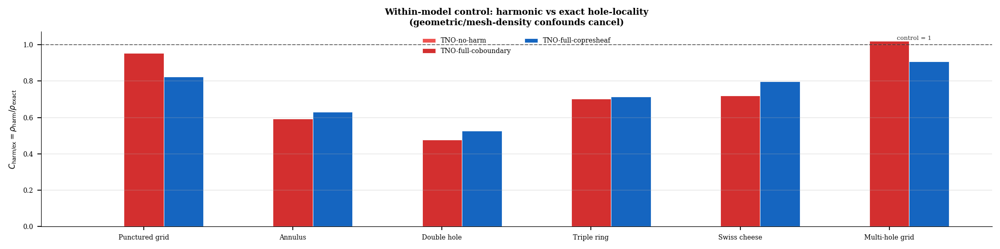

  [interp] harmonic_locality_controlled.pdf

──────────────────────────────────────────────────────────────────────────────────────
  (B) CHANNEL-MASS DECOMPOSITION  (fraction of Σ|attr|, hole domains, 5-sample mean)
──────────────────────────────────────────────────────────────────────────────────────
  model                    Coexact δ¹  Harm. rank0     Exact d⁰   Coexact δ²  Harm. rank1
  TNO-no-harm                   0.785        0.000        0.143        0.072        0.000
  TNO-full-coboundary           0.738        0.104        0.099        0.051        0.008
  TNO-full-copresheaf           0.707        0.119        0.106        0.061        0.008


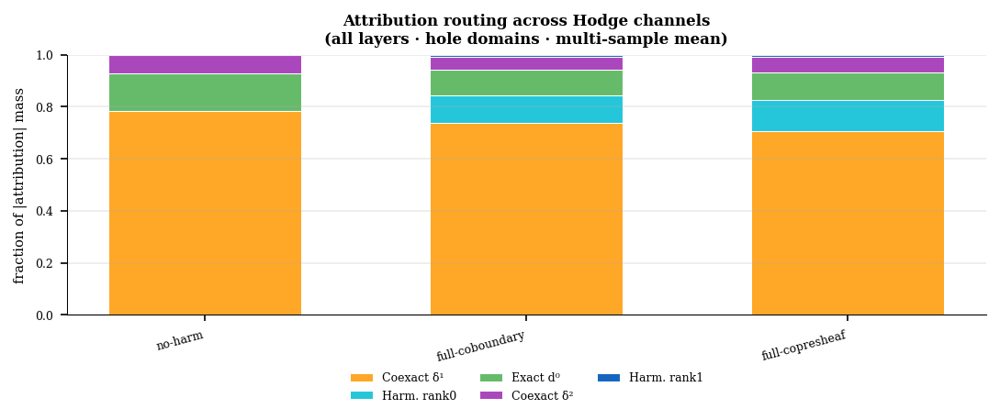

  [interp] channel_mass_decomposition.pdf

  How to read this:
  • ρ alone is confounded — hole boundaries differ geometrically from the
    interior, so even the GNN message channel can show ρ > 1.
  • C_harm/ex > 1 is the defensible claim: within one model, the harmonic
    routing is MORE hole-localised than the exact routing on the same mesh.
  • C_hole/outer > 1 separates topology from "boundaries in general".
  • Rows flagged [α gated] mean the harmonic gate never left ~0 under this
    training budget — they are evidence about the BUDGET, not the mechanism.
    Quote numbers only from RUN_MODE="full", multi-seed.



In [ ]:
# %%  ═══════════════════════════════════════════════════════════════════
# QUANTITATIVE INTERPRETATION — locality with confound controls
# ─────────────────────────────────────────────────────────────────────────
#   (A) locality table: ρ_harm, ρ_exact, GNN ρ_msg, and the two controls
#         C_harm/ex   = ρ_harm / ρ_exact      (within-model control)
#         C_hole/outer= ρ^hole_harm / ρ^outer_harm  (boundary-type control)
#   (B) channel-mass decomposition over the complete channel set
# All metrics use |attr|, averaged over N_SAMPLES held-out samples.
# ═══════════════════════════════════════════════════════════════════════

import numpy as np
import torch
import matplotlib.pyplot as plt

N_SAMPLES = 5          # samples averaged per (model, domain)
_SCORE    = "energy"   # match the attribution figures


def _compute_cam_multi(models=None, target_layers="all"):
    """store[model][domain] = list of (cam_dict, status_dict, hole, outer)."""
    models = models or GRADCAM_MODELS
    doms = [d[0] for d in _ABL_DOMS if d[0] in all_test_samples]
    store = {m: {d: [] for d in doms} for m in models}
    for m in models:
        mtype = "gnn" if m == "GNN" else "tno"
        for dom in doms:
            mdl = all_domain_results.get(dom, {}).get(m, {}).get("model")
            if mdl is None:
                continue
            ns = all_norm_stats[dom]
            n  = min(N_SAMPLES, len(all_test_samples[dom]))
            for si in range(n):
                s = all_test_samples[dom][si]
                hole, outer = _boundary_masks(s)
                try:
                    att = PerHodgeAttribution(
                        mdl, target_layers=target_layers, model_type=mtype)
                    cams, stats = att.compute(s, ns, score=_SCORE)
                    store[m][dom].append((cams, stats, hole, outer))
                except Exception as exc:
                    print(f"  [interp] {m}/{dom}[{si}]: {exc}")
    return store, doms


def _loc(cam, mask):
    """mean |attr| on mask / mean |attr| overall; NaN if degenerate."""
    a = cam.detach().cpu().abs().numpy()
    den = a.mean()
    if den < 1e-14 or mask.sum() == 0:
        return np.nan
    return float(a[mask.numpy()].mean() / den)


def locality_with_controls(models=None):
    models = models or GRADCAM_MODELS
    store, doms = _compute_cam_multi(models)
    hole_doms = [d for d in doms if any(
        rec[2].any() for m in models for rec in store[m][d])]

    rows = []   # (domain, model, rho_harm, rho_ex, C_we, C_ho, rho_msg)
    print("\n" + "─" * 86)
    print("  (A) HOLE LOCALITY WITH CONTROLS   ρ = mean|a| on mask / mean|a|")
    print("      C_harm/ex   > 1 ⇒ harmonic more hole-localised than own exact channel")
    print("      C_hole/outer> 1 ⇒ harmonic prefers topological boundaries over outer boundary")
    print("─" * 86)
    hdr = (f"  {'domain':<14s}{'model':<22s}{'ρ_harm':>8s}{'ρ_exact':>9s}"
           f"{'C_h/ex':>8s}{'C_h/out':>9s}")
    print(hdr)
    for dom in hole_doms:
        for m in models:
            recs = store[m][dom]
            if not recs:
                continue
            if m == "GNN":
                vals = [_loc(c[L_MSG], h) for c, _, h, _ in recs
                        if L_MSG in c]
                r = np.nanmean(vals) if vals else np.nan
                print(f"  {dom:<14s}{m:<22s}{r:>8.2f}"
                      f"{'(msg ch., confound baseline)':>26s}")
                rows.append((dom, m, r, np.nan, np.nan, np.nan))
                continue
            rh, rx, ro = [], [], []
            for cams, stats, hole, outer in recs:
                if L_HARM_E in cams:
                    rh.append(_loc(cams[L_HARM_E], hole))
                    ro.append(_loc(cams[L_HARM_E], outer))
                if L_EX_E in cams:
                    rx.append(_loc(cams[L_EX_E], hole))
            rh_, rx_, ro_ = (np.nanmean(v) if v else np.nan
                             for v in (rh, rx, ro))
            c_we = rh_ / rx_ if np.isfinite(rh_) and np.isfinite(rx_) and rx_ > 0 else np.nan
            c_ho = rh_ / ro_ if np.isfinite(rh_) and np.isfinite(ro_) and ro_ > 0 else np.nan
            # gated annotation
            gated = any(stats.get(L_HARM_E, (None,))[0] == "gated"
                        for _, stats, _, _ in recs)
            note = "  [α gated — not evidence either way]" if gated else ""
            def _f(x): return f"{x:>8.2f}" if np.isfinite(x) else f"{'—':>8s}"
            print(f"  {dom:<14s}{m:<22s}{_f(rh_)}{_f(rx_):>9s}"
                  f"{_f(c_we)}{_f(c_ho):>9s}{note}")
            rows.append((dom, m, rh_, rx_, c_we, c_ho))

    # grouped bar chart of the within-model control
    tno_models = [m for m in models if m != "GNN"]
    with plt.rc_context(_R_RC):
        fig, ax = plt.subplots(figsize=(1.7 * len(hole_doms) + 2.5, 3.2))
        width = 0.8 / max(len(tno_models), 1)
        x = np.arange(len(hole_doms))
        for mi, m in enumerate(tno_models):
            vals = []
            for d in hole_doms:
                v = [r[4] for r in rows if r[0] == d and r[1] == m]
                vals.append(v[0] if v and np.isfinite(v[0]) else 0.0)
            ax.bar(x + mi * width, vals, width, label=m, color=_mcol(m),
                   edgecolor="white", linewidth=0.4)
        ax.axhline(1.0, color="#333", lw=0.8, ls="--", alpha=0.7)
        ax.text(len(hole_doms) - 0.45, 1.02, "control = 1", fontsize=5.5,
                color="#333", ha="right", va="bottom")
        ax.set_xticks(x + width * (len(tno_models) - 1) / 2)
        ax.set_xticklabels([_DOM_LAB.get(d, d) for d in hole_doms])
        ax.set_ylabel(r"$C_{\mathrm{harm/ex}}=\rho_{\mathrm{harm}}/\rho_{\mathrm{exact}}$",
                      fontsize=7)
        ax.set_title("Within-model control: harmonic vs exact hole-locality\n"
                     "(geometric/mesh-density confounds cancel)",
                     fontsize=8, fontweight="bold")
        ax.legend(fontsize=6, ncol=2, frameon=False)
        ax.grid(True, axis="y", alpha=0.25)
        plt.tight_layout()
        plt.savefig("harmonic_locality_controlled.pdf", bbox_inches="tight")
        plt.savefig("harmonic_locality_controlled.png", dpi=300,
                    bbox_inches="tight")
        plt.show(); plt.close()
    print("  [interp] harmonic_locality_controlled.pdf")
    return rows


def channel_mass_decomposition(models=None):
    models = models or GRADCAM_MODELS
    store, doms = _compute_cam_multi(models)
    hole_doms = [d for d in doms if any(
        rec[2].any() for m in models for rec in store[m][d])]
    tno_models = [m for m in models if m != "GNN"]
    ch_order = [L_COEX_V, L_HARM_V, L_EX_E, L_COEX_E, L_HARM_E]
    ch_short = ["Coexact δ¹", "Harm. rank0", "Exact d⁰",
                "Coexact δ²", "Harm. rank1"]
    ch_cols  = ["#FFA726", "#26C6DA", "#66BB6A", "#AB47BC", "#1565C0"]

    mass = {}
    for m in tno_models:
        acc, n = np.zeros(len(ch_order)), 0
        for dom in hole_doms:
            for cams, _, _, _ in store[m][dom]:
                tot = sum(float(cams[c].abs().sum())
                          for c in ch_order if c in cams) + 1e-12
                acc += np.array([float(cams[c].abs().sum()) / tot
                                 if c in cams else 0.0 for c in ch_order])
                n += 1
        mass[m] = acc / max(n, 1)

    print("\n" + "─" * 86)
    print("  (B) CHANNEL-MASS DECOMPOSITION  (fraction of Σ|attr|, hole domains,"
          f" {N_SAMPLES}-sample mean)")
    print("─" * 86)
    print(f"  {'model':<22s}" + "".join(f"{c:>13s}" for c in ch_short))
    for m in tno_models:
        print(f"  {m:<22s}" + "".join(f"{v:>13.3f}" for v in mass[m]))

    with plt.rc_context(_R_RC):
        fig, ax = plt.subplots(figsize=(1.6 * len(tno_models) + 2.5, 3.2))
        x = np.arange(len(tno_models)); bottom = np.zeros(len(tno_models))
        for ci, (cs, col) in enumerate(zip(ch_short, ch_cols)):
            vals = np.array([mass[m][ci] for m in tno_models])
            ax.bar(x, vals, 0.6, bottom=bottom, label=cs, color=col,
                   edgecolor="white", linewidth=0.5)
            bottom += vals
        ax.set_xticks(x)
        ax.set_xticklabels([m.replace("TNO-", "") for m in tno_models],
                           rotation=15, ha="right")
        ax.set_ylabel("fraction of |attribution| mass", fontsize=7)
        ax.set_ylim(0, 1.0)
        ax.set_title("Attribution routing across Hodge channels\n"
                     "(all layers · hole domains · multi-sample mean)",
                     fontsize=8, fontweight="bold")
        ax.legend(fontsize=6, ncol=3, frameon=False, loc="upper center",
                  bbox_to_anchor=(0.5, -0.18))
        ax.grid(True, axis="y", alpha=0.25)
        plt.tight_layout()
        plt.savefig("channel_mass_decomposition.pdf", bbox_inches="tight")
        plt.savefig("channel_mass_decomposition.png", dpi=300,
                    bbox_inches="tight")
        plt.show(); plt.close()
    print("  [interp] channel_mass_decomposition.pdf")
    return mass


print("=" * 64)
print("  QUANTITATIVE PER-CHANNEL INTERPRETATION (controlled)")
print("=" * 64)
_rows = locality_with_controls()
_mass = channel_mass_decomposition()

print("""
  How to read this:
  • ρ alone is confounded — hole boundaries differ geometrically from the
    interior, so even the GNN message channel can show ρ > 1.
  • C_harm/ex > 1 is the defensible claim: within one model, the harmonic
    routing is MORE hole-localised than the exact routing on the same mesh.
  • C_hole/outer > 1 separates topology from "boundaries in general".
  • Rows flagged [α gated] mean the harmonic gate never left ~0 under this
    training budget — they are evidence about the BUDGET, not the mechanism.
    Quote numbers only from RUN_MODE="full", multi-seed.
""")


## 11 · Conclusions

Read against the numbers this run actually produced (tutorial budget: 150 samples, 30 epochs, single seed, ≥600-vertex meshes, seven domains spanning $\beta_1 = 0$–$4$):

**1. The capability hierarchy holds, and the full model wins on average.** Test MSE falls monotonically up the ladder — MLP (0.12–0.29) → GNN → TNO variants — with TNO-full-copresheaf best on four domains (L-shape, double hole, triple ring, Swiss cheese) and averaging **+30.5% lower MSE than the parameter-matched GNN**, **+14.1% than TNO-no-harm** (isolating the harmonic channel), and **+9.7% than TNO-full-coboundary** (isolating learned transport). Each architectural claim is supported by its own single-switch ablation, not by the aggregate.

**2. The harmonic story is now *two* stories, and separating them sharpened both.** The rank-0 harmonic subspace on a connected domain is the constant vector — $P^0_{\mathrm{harm}}$ is a learned **global-mean channel** — and the model uses it everywhere: $\alpha^v_{\mathrm{harm}}$ opens on all seven domains including the $\beta_1=0$ control, and carries 10–12% of attribution mass. This explains why the harmonic ablation costs accuracy even on the L-shape (+38%): that gain is *global context*, not topology. The **topology-specific** claim lives in the rank-1 channel: its gates open most decisively on the punctured grid and multi-hole grid ($|\alpha^e_{\mathrm{harm}}|$ up to 0.15–0.23), and exactly there the boundary-type control passes emphatically — harmonic attribution prefers hole boundaries over the outer boundary by **4.7–4.9×** and **2.9–3.8×** respectively, while the GNN's message channel shows no such preference. Where the gates stay near zero (annulus, double hole, triple ring), the locality ratios hover near 1, as they should for an unused channel.

**3. What the controls do *not* yet show — stated plainly.** The within-model control $C_{\mathrm{harm/ex}} = \rho_{\mathrm{harm}}/\rho_{\mathrm{exact}}$ sits at 0.5–1.0: the harmonic channel is not yet *more* hole-localised than the model's own exact channel, largely because the exact channel legitimately carries the solution's boundary layers. With gates this small, attribution magnitudes are within range of training noise. A mechanistic claim of the form *"the harmonic channel implements topological routing"* therefore remains **partially supported**: the gate-activation pattern and the boundary-type control point the right way; the within-model control and effect sizes need `RUN_MODE="full"`, multiple seeds, and ideally the $\beta_1$ dose-response regression that the variable-hole domains (Swiss cheese, multi-hole grid) make possible within a single domain distribution.

**4. Learned transport is the more uniform win.** The copresheaf beats bare coboundary on six of seven domains — on irregular PSLG meshes and regular grids alike — consistent with the diagnosis that scatter-aggregation destroys per-incidence identity before any MLP can use it. Because $\rho$ is zero-initialised, this capacity is added at zero cost to the canonical-start guarantee, and geometry never enters as a fixed operator weight (Principle P1, §3.5).

**5. Two known anomalies persist and are worth keeping visible.** *(a)* On the annulus, TNO-grad-only is best (0.0292) and the full model roughly ties the GNN — the curved, single-hole domain remains the hardest case for the full architecture. *(b)* TNO-no-faces wins on both regular-grid domains (punctured grid, multi-hole grid): the face rank's variable-degree aggregation adds noise where the physics doesn't exercise rank 2. The right ranks matter more than the most ranks.

**Caveats for any write-up.** Single seed, tutorial budget; quote nothing without multi-seed `full` runs. The GNN baseline is a geometry-conditioned MPNN, not a true neural operator (a GNO baseline is future work). Attribution is grad⊙activation, not GradCAM, and must be labelled as such. The harmonic-gate magnitudes here (0.0–0.23) are honest small numbers — the analysis is designed so that an unused channel *reads* as unused rather than being narrated into significance.

**Where this points.** Full-budget multi-seed runs with gate-trajectory logging; the within-domain $\beta_1$ dose-response regression; the mixed Darcy $C^0\times C^1 \to C^0\times C^1$ experiment, where the split multi-rank heads (§3.5c) let the TNO emit edge-valued outputs no vertex-feature GNN can represent — the cleanest possible separation of the architectures.


In [11]:
# %% ═══════════════════════════════════════════════════════════════════
# LOCATE THIS NOTEBOOK AND SAVE AN HTML COPY NEXT TO IT
# ═══════════════════════════════════════════════════════════════════════
import os, glob, subprocess, shlex

# ── 0) Force-save so the HTML includes the latest outputs ─────────────
try:
    from google.colab import _message
    _message.blocking_request('notebook.save', timeout_sec=30)
    print("[html] notebook saved")
except Exception as e:
    print(f"[html] programmatic save unavailable ({e}) — Ctrl+S first if outputs changed")

# ── 1) Get this notebook's filename from the Colab session API ────────
nb_name = None
try:
    import requests
    sessions = requests.get("http://172.28.0.12:9000/api/sessions", timeout=5).json()
    nb_name = sessions[0]["name"]
    print(f"[html] session reports notebook name: {nb_name}")
except Exception:
    nb_name = "TNO__Channel_Gradient_Ablation_Tutorial_Leventhal.ipynb"   # fallback
    print(f"[html] session API unavailable — falling back to: {nb_name}")

# ── 2) Find the actual file on disk (Drive must be mounted) ───────────
if not os.path.isdir("/content/drive"):
    from google.colab import drive
    drive.mount("/content/drive")

search_roots = ["/content/drive/MyDrive/Colab Notebooks",
                "/content/drive/MyDrive",
                "/content"]
candidates = []
for root in search_roots:
    if os.path.isdir(root):
        candidates += glob.glob(os.path.join(root, "**", nb_name), recursive=True)
candidates = sorted(set(candidates), key=os.path.getmtime, reverse=True)

if not candidates:
    raise FileNotFoundError(
        f"Could not find {nb_name!r} under {search_roots}. "
        "Run  !find /content/drive/MyDrive -name '*.ipynb'  to locate it manually.")

nb_path = candidates[0]                      # most recently modified copy
if len(candidates) > 1:
    print(f"[html] note: {len(candidates)} copies found; using newest:")
    for c in candidates[:4]:
        print(f"        {c}")

# ── 3) Convert to a standalone HTML next to the notebook ──────────────
out_dir = os.path.dirname(nb_path)
cmd = (f'jupyter nbconvert --to html --template lab '
       f'{shlex.quote(nb_path)} --output-dir {shlex.quote(out_dir)}')
print(f"[html] running: {cmd}")
res = subprocess.run(cmd, shell=True, capture_output=True, text=True)
print(res.stderr.strip() or res.stdout.strip())

html_path = os.path.join(out_dir, os.path.splitext(os.path.basename(nb_path))[0] + ".html")
if os.path.exists(html_path):
    print(f"\n[html] ✓ saved: {html_path}  ({os.path.getsize(html_path)/1e6:.1f} MB)")
else:
    raise RuntimeError("nbconvert reported success but the HTML was not found — see log above.")

# ── 4) Optional: also download to your machine ────────────────────────
# from google.colab import files; files.download(html_path)

[html] notebook saved
[html] session reports notebook name: TNO__Channel_Gradient_Ablation_Tutorial_Leventhal.ipynb
[html] note: 2 copies found; using newest:
        /content/drive/MyDrive/TNO (PostDoc)/experiments/TNO__Channel_Gradient_Ablation_Tutorial_Leventhal.ipynb
        /content/drive/MyDrive/Colab Notebooks/TNO__Channel_Gradient_Ablation_Tutorial_Leventhal.ipynb
[html] running: jupyter nbconvert --to html --template lab '/content/drive/MyDrive/TNO (PostDoc)/experiments/TNO__Channel_Gradient_Ablation_Tutorial_Leventhal.ipynb' --output-dir '/content/drive/MyDrive/TNO (PostDoc)/experiments'
[NbConvertApp] Converting notebook /content/drive/MyDrive/TNO (PostDoc)/experiments/TNO__Channel_Gradient_Ablation_Tutorial_Leventhal.ipynb to html
[NbConvertApp] WARNING | Alternative text is missing on 14 image(s).
[NbConvertApp] Writing 17067469 bytes to /content/drive/MyDrive/TNO (PostDoc)/experiments/TNO__Channel_Gradient_Ablation_Tutorial_Leventhal.html

[html] ✓ saved: /content/drive/M